In [ ]:
#Instalar aplicaciones específicas

!pip install shap
!pip install xgboost
!pip install imblearn
!pip install statsmodels
!pip install lightgbm
!pip install tensorflow
!pip install scikeras
!pip install hdbscan
%pip install prophet
%pip install statsmodels

In [2]:
# Importación de las librerias principales
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
import hdbscan
from sklearn.model_selection import ParameterGrid
from mpl_toolkits.mplot3d import Axes3D
import time
import shap
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, accuracy_score, classification_report, confusion_matrix
import joblib
from joblib import dump
from imblearn.over_sampling import SMOTE
from collections import Counter
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPooling1D, SimpleRNN, LSTM
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasClassifier
from keras.layers import Input
from scipy.cluster.hierarchy import dendrogram, linkage
from prophet import Prophet

# **0. - Inicialización**

El dataset fue descargado del repositario de datos de edp. 

In [3]:
import pandas as pd

# Cargar los datos desde el dataset y ordenarlos por 'time_stamp'
def upload_files(index_fields=None): 
    file_name = "0.csv"
    df = pd.read_csv(file_name, sep=';', parse_dates=['time_stamp'], index_col=index_fields)
    
    # Ordenar por time_stamp
    df = df.sort_values(by='time_stamp')
    return df

# Semilla para reproducibilidad (si se usa más adelante)
seed = 1001

# Cargar y ordenar el dataset
train = upload_files(index_fields=None)

print("Tamaño del conjunto de datos:", train.shape)


Tamaño del conjunto de datos: (54986, 86)


El dataset contiene 54986 instancias y 86 características. Cada fila en este dataset representa una instancia o una captura de los valores de cada sensor que posee el generador eolico.

**Primeras filas del dataset**

In [4]:
print("\nPrimeras filas del dataset:")
print(train.head())


Primeras filas del dataset:
           time_stamp  asset_id  id train_test  status_type_id  sensor_0_avg  \
0 2022-08-03 06:10:00         0   0      train               0          22.0   
1 2022-08-03 06:20:00         0   1      train               0          22.0   
2 2022-08-03 06:30:00         0   2      train               0          22.0   
3 2022-08-03 06:40:00         0   3      train               0          22.0   
4 2022-08-03 06:50:00         0   4      train               0          22.0   

   sensor_1_avg  sensor_2_avg  wind_speed_3_avg  wind_speed_4_avg  ...  \
0         302.9         129.4               1.7               1.7  ...   
1         307.1         133.6               1.7               1.7  ...   
2         340.6         167.1               0.9               0.9  ...   
3         124.4         -49.1               1.5               1.5  ...   
4          66.2        -107.3               1.0               1.0  ...   

   sensor_47  sensor_48  sensor_49  sensor_50

La cabecera del dataset proporciona una vista preliminar de las primeras cinco filas, mostrando algunas de las principales características disponibles.


**Últimas filas del dataset (cola)**

In [4]:
print("\nÚltimas filas del dataset:")
print(train.tail())


Últimas filas del dataset:
               time_stamp  asset_id     id  train_test  status_type_id  \
54981 2023-08-23 05:30:00         0  54981  prediction               3   
54982 2023-08-23 05:40:00         0  54982  prediction               3   
54983 2023-08-23 05:50:00         0  54983  prediction               3   
54984 2023-08-23 06:00:00         0  54984  prediction               3   
54985 2023-08-23 06:10:00         0  54985  prediction               3   

       sensor_0_avg  sensor_1_avg  sensor_2_avg  wind_speed_3_avg  \
54981          25.0         121.0          24.6               3.3   
54982          25.0         117.2          20.9               2.8   
54983          25.0         114.5          18.2               2.7   
54984          25.0         104.4           8.0               3.1   
54985          25.0         101.8           5.4               3.4   

       wind_speed_4_avg  ...  sensor_47  sensor_48  sensor_49  sensor_50  \
54981               0.0  ...      -1

# **Información general sobre el dataset**

**Exploración de los Datos**

El análisis exploratorio de datos es fundamental para entender la estructura, las características principales y las distribuciones de las variables en el dataset. A través de este proceso, buscamos:


*   Identificar la presencia de valores nulos que podrían afectar el rendimiento de los modelos.
*   Detectar outliers o valores atípicos que podrían influir de manera desproporcionada en el análisis o los modelos predictivos.
*   Analizar la distribución de cada variable para determinar si alguna transformación es necesaria.
*   Examinar la correlación entre variables, lo cual ayuda a identificar relaciones significativas que podrían ser útiles en el modelo o redundancias que pueden ser simplificadas.




In [ ]:
# Información general sobre el dataset
print(train.info())  # Verificar tipos de datos y valores faltantes

El análisis exploratorio de datos revela que el conjunto de datos consta de 54.986 instancias y 86 características, de las cuales 81 contienen valores numéricos continuos (float64), 3 son enteros (int64), y 2 son de tipo texto (object). Se observa que la mayoría de las columnas corresponden a mediciones de sensores y variables relacionadas con la velocidad del viento y la potencia generada. Además, se detectaron **dos columnas con valores nulos** (sensor_14_avg y sensor_22_avg), aunque en una cantidad mínima, lo que sugiere que pueden eliminarse esos registros o imputarse sin afectar significativamente el análisis. También se identificaron posibles redundancias entre variables debido a la presencia de múltiples estadísticas de sensores, lo que podría requerir una evaluación de correlaciones para evitar información duplicada.

**Descripción de las características del dataset**

Cada instancia representa una medición en el parque eólico, incluyendo sensores ambientales, de temperatura, potencia y dirección del aerogenerador.

Datos generales
time_stamp (object): Marca de tiempo de la medición.
asset_id (int64): Identificador único del aerogenerador.
id (int64): Identificador único de la muestra.
train_test (object): Indica si la muestra pertenece al conjunto de entrenamiento o prueba.
status_type_id (int64): Estado del aerogenerador, categórico.
Sensores ambientales y de viento
sensor_0_avg (float64): Temperatura ambiente (°C).
sensor_1_avg (float64): Dirección absoluta del viento (°).
sensor_2_avg (float64): Dirección relativa del viento (°).
wind_speed_3_avg (float64): Velocidad media del viento (m/s).
wind_speed_4_avg (float64): Velocidad estimada del viento (m/s).
wind_speed_3_max (float64): Velocidad máxima del viento registrada (m/s).
wind_speed_3_min (float64): Velocidad mínima del viento registrada (m/s).
wind_speed_3_std (float64): Desviación estándar de la velocidad del viento (m/s).
Sensores de control y generación
sensor_5_avg (float64): Ángulo de paso de las palas (°).
sensor_6_avg (float64): Temperatura en el controlador del buje (°C).
sensor_7_avg (float64): Temperatura en la parte superior de la góndola (°C).
sensor_8_avg (float64): Temperatura en las bobinas de estrangulamiento en la sección VCS (°C).
sensor_9_avg (float64): Temperatura en la placa VCP (°C).
sensor_10_avg (float64): Temperatura en el agua de refrigeración VCS (°C).
sensor_11_avg (float64): Temperatura en el cojinete del engranaje de alta velocidad (°C).
sensor_12_avg (float64): Temperatura del aceite del engranaje (°C).
sensor_13_avg (float64): Temperatura en el cojinete del generador (Drive End) (°C).
sensor_14_avg (float64): Temperatura en el cojinete del generador (Non-Drive End) (°C).
sensor_15_avg (float64): Temperatura dentro del generador en los devanados del estator fase 1 (°C).
sensor_16_avg (float64): Temperatura dentro del generador en los devanados del estator fase 2 (°C).
sensor_17_avg (float64): Temperatura dentro del generador en los devanados del estator fase 3 (°C).
Rotación y potencia generada
sensor_18_avg (float64): RPM del generador en el último período (rpm).
sensor_18_max (float64): RPM máxima del generador (rpm).
sensor_18_min (float64): RPM mínima del generador (rpm).
sensor_18_std (float64): Desviación estándar de las RPM del generador (rpm).
Temperaturas del transformador y nacelle
sensor_38_avg (float64): Temperatura en el transformador de alta tensión fase L1 (°C).
sensor_39_avg (float64): Temperatura en el transformador de alta tensión fase L2 (°C).
sensor_40_avg (float64): Temperatura en el transformador de alta tensión fase L3 (°C).
sensor_41_avg (float64): Temperatura del aceite en el grupo hidráulico (°C).
sensor_42_avg (float64): Dirección de la góndola (°).
sensor_43_avg (float64): Temperatura en la góndola (°C).
Mediciones eléctricas
sensor_23_avg (float64): Corriente promedio en fase 1 (A).
sensor_24_avg (float64): Corriente promedio en fase 2 (A).
sensor_25_avg (float64): Corriente promedio en fase 3 (A).
sensor_26_avg (float64): Frecuencia de la red (Hz).
sensor_32_avg (float64): Voltaje promedio en fase 1 (V).
sensor_33_avg (float64): Voltaje promedio en fase 2 (V).
sensor_34_avg (float64): Voltaje promedio en fase 3 (V).
Potencia generada y reactiva
power_29_avg (float64): Potencia activa media de la red (kW).
power_30_avg (float64): Potencia total generada (kW).
reactive_power_27_avg (float64): Potencia reactiva capacitiva de la red (kVAr).
reactive_power_28_avg (float64): Potencia reactiva inductiva de la red (kVAr).
sensor_44 (float64): Potencia activa - generador desconectado (Wh).
sensor_45 (float64): Potencia activa - generador conectado en delta (Wh).
sensor_46 (float64): Potencia activa - generador conectado en estrella (Wh).
sensor_47 (float64): Potencia reactiva - generador desconectado (VArh).
sensor_48 (float64): Potencia reactiva - generador conectado en delta (VArh).
sensor_49 (float64): Potencia reactiva - generador conectado en estrella (VArh).
sensor_50 (float64): Potencia activa total (Wh).
sensor_51 (float64): Potencia reactiva total (VArh).
Otras métricas
sensor_52_avg (float64): RPM promedio del rotor (rpm).
sensor_53_avg (float64): Temperatura en el cono de la nariz (°C).




Entre los principales caracteristicas que presenta el dataset, destaca su alta dimensionalidad, lo que podría afectar la eficiencia de los modelos predictivos y requerir técnicas de reducción de dimensionalidad. Por otra parte, es recomendable convertir la columna time_stamp a formato datetime para facilitar el análisis temporal, así como transformar o eliminar las variables categóricas, como train_test, para mejorar la optimización del procesamiento. Como próximos pasos, sería útil visualizar la distribución de datos mediante histogramas, analizar la matriz de correlación para detectar variables redundantes y evaluar la existencia de patrones en el tiempo para mejorar la clasificación y predicción en el parque eólico.

**Estadísticas descriptivas del dataset**

In [5]:
# Asegurar que se muestran todas las columnas
pd.set_option('display.max_columns', None)

# Mostrar las estadísticas descriptivas de todas las columnas
print(train.describe(include='all'))

                           time_stamp  asset_id            id train_test  \
count                           54986   54986.0  54986.000000      54986   
unique                            NaN       NaN           NaN          2   
top                               NaN       NaN           NaN      train   
freq                              NaN       NaN           NaN      52148   
mean    2023-02-11 19:09:52.514457856       0.0  27492.500000        NaN   
min               2022-08-03 06:10:00       0.0      0.000000        NaN   
25%               2022-11-08 07:12:30       0.0  13746.250000        NaN   
50%               2023-02-11 19:55:00       0.0  27492.500000        NaN   
75%               2023-05-18 08:07:30       0.0  41238.750000        NaN   
max               2023-08-23 06:10:00       0.0  54985.000000        NaN   
std                               NaN       0.0  15873.235288        NaN   

        status_type_id  sensor_0_avg  sensor_1_avg  sensor_2_avg  \
count     54986.000

Las estadísticas descriptivas proporcionadas ofrecen una visión detallada de la distribución y valores fundamentales de cada variable en el dataset, como la media, la desviación estándar, y los percentiles (25%, 50% y 75%). El dataset en análisis contiene una amplia variedad de variables que abarcan distintos aspectos del funcionamiento de un aerogenerador. Estas variables pueden agruparse en diferentes categorías de acuerdo con su impacto esperado en la operación, mantenimiento y rendimiento de la generación eólica. Se espera que cada uno de estos grupos influya de manera distinta en el comportamiento del aerogenerador y en la predicción de posibles fallas o necesidades de mantenimiento preventivo. Cada instancia representa una medición de un aerogenerador con las siguientes características:

**Información General**

* time_stamp (timestamp): Marca temporal de la medición. Formato: YYYY-MM-DD HH:MM:SS. (Ejemplo: 2022-08-03 06:10:00)
* asset_id (numérico): Identificador del activo (aerogenerador). Valor único en este dataset.
* id (numérico): Identificador único de la instancia en el dataset.
* train_test (categórico): Indica a que grupo de datos (de los dos posibles), puede pertenecer la instancia.
* status_type_id (categórico): Puede representar el estado del aerogenerador, necesita un estudio más detallado. Valores posibles: {0, ... , 5}.

**Datos Ambientales**

* sensor_0_avg (numérico): Temperatura ambiente (°C). Rango: [4, 41], Media: 20.1.
* sensor_1_avg (numérico): Dirección absoluta del viento (°). Rango: [0, 359], Media: 164.7.
* sensor_2_avg (numérico): Dirección relativa del viento (°). Rango: [-179.8, 180], Media: 0.8.

**Velocidad del Viento**

* wind_speed_3_avg (numérico): Velocidad media del viento (m/s). Rango: [0.5, 25.5], Media: 6.5.
* wind_speed_4_avg (numérico): Velocidad estimada del viento (m/s). Rango: [0, 25.5], Media: 6.4.
* wind_speed_3_max (numérico): Velocidad máxima del viento (m/s). Rango: [0.8, 70], Media: 14.4.
* wind_speed_3_min (numérico): Velocidad mínima del viento (m/s). Rango: [0.4, 10.5], Media: 1.6.
* wind_speed_3_std (numérico): Desviación estándar de la velocidad del viento (m/s). Rango: [0, 55.1], Media: 1.3.

**Rotor y góndola**

* sensor_5_avg (numérico): Ángulo medio del rotor (°). Rango: [-2.3, 90], Media: 10.3.
* sensor_5_max (numérico): Ángulo máximo del rotor (°). Rango: [-2.2, 90], Media: 15.1.
* sensor_5_min (numérico): Ángulo mínimo del rotor (°). Rango: [-4.1, 90], Media: 7.5.
* sensor_5_std (numérico): Desviación estándar del ángulo del rotor (°). Rango: [0, 43.7], Media: 1.8.
* sensor_18_avg (numérico): Revoluciones medias del rotor, en el periodo anterior (rpm). Rango: [0, 1683.8], Media: 1068.3.
* sensor_18_max (numérico): Revoluciones máximas del rotor, en el periodo anterior (rpm). Rango: [0, 1927.5], Media: 1187.8.
* sensor_18_min (numérico): Revoluciones mínimas del rotor, en el periodo anterior (rpm). Rango: [0, 1666.1], Media: 945.9.
* sensor_18_std (numérico): Desviación estándar de las revoluciones, en el periodo anterior (rpm). Rango: [0, 813.8], Media: 64.5.
* sensor_41_avg (numérico): Temperatura de aceite del grupo hidráulico (°C). Rango: [21, 51], Media: 38.9.
* sensor_42_avg (numérico): Dirección de la góndola (°). Rango: [0.3, 359], Media: 168.3.
* sensor_43_avg (numérico): Temperatura de la góndola (°C). Rango: [15, 50], Media: 30.3.
* sensor_52_avg (numérico): Revoluciones medias del rotor (rpm). Rango: [0, 14.9], Media: 9.39.
* sensor_52_max (numérico): Revoluciones máximas del rotor (rpm). Rango: [0, 16.9], Media: 10.4.
* sensor_52_min (numérico): Revoluciones mínimas del rotor (rpm). Rango: [0, 14.8], Media: 8.3.
* sensor_52_std (numérico): Desviación estándar de las revoluciones del rotor (rpm). Rango: [0, 7.3], Media: 0.58.
* sensor_53_avg (numérico): Temperatura en la nariz del generador (°C). Rango: [8, 45], Media: 23.2.

**Temperaturas Internas del Generador**

* sensor_6_avg (numérico): Temperatura en el controlador del buje (°C). Rango: [14, 51], Media: 30.7.
* sensor_7_avg (numérico): Temperatura en el controlador superior de la góndola (°C). Rango: [23, 58], Media: 39.5.
* sensor_8_avg (numérico): Temperatura en las bobinas de choque de la sección VCS (°C). Rango: [19, 133], Media: 80.7.
* sensor_9_avg (numérico): Temperatura en la placa VCP (°C). Rango: [27, 59], Media: 39.6.
* sensor_10_avg (numérico): Temperatura en el agua de refrigeración del VCS (°C). Rango: [23, 53], Media: 37.3.
* sensor_11_avg (numérico): Temperatura en el cojinete del engranaje del eje de alta velocidad (°C). Rango: [22, 68], Media: 51.5.
* sensor_12_avg (numérico): Temperatura del aceite en la caja de cambios (°C). Rango: [24, 61], Media: 48.3.
* sensor_13_avg (numérico): Temperatura en el cojinete 2 del generador (°C). Rango: [19, 94], Media: 46.9.
* sensor_14_avg (numérico): Temperatura en el cojinete 1 del generador (°C). Rango: [18, 95], Media: 45.7.
* sensor_15_avg (numérico): Temperatura en el estator fase 1 (°C). Rango: [21, 145], Media: 69.2.
* sensor_16_avg (numérico): Temperatura en el estator fase 2 (°C). Rango: [21, 143], Media: 68.8.
* sensor_17_avg (numérico): Temperatura en el estator fase 3 (°C). Rango: [20, 139], Media: 67.6.
* sensor_19_avg (numérico): Temperatura cel aceite de lubricación en el generador (°C). Rango: [12, 60], Media: 31.4.
* sensor_20_avg (numérico): Temperatura en la barra colector del generador (°C). Rango: [20, 62], Media: 37.3.
* sensor_21_avg (numérico): Temperatura medida por el controlador IGBT en el inversor del lado de la red (°C). Rango: [29, 55], Media: 38.4.
* sensor_35_avg (numérico): Temperatura medida por el controlador IGBT en el inversor del lado del rotor fase 1 (°C). Rango: [29, 57], Media: 38.9.
* sensor_36_avg (numérico): Temperatura medida por el controlador IGBT en el inversor del lado del rotor fase 2 (°C). Rango: [29, 56], Media: 38.8.
* sensor_37_avg (numérico): Temperatura medida por el controlador IGBT en el inversor del lado del rotor fase 3 (°C). Rango: [29, 58], Media: 40.4.
* sensor_38_avg (numérico): Temperatura en el transformador de Alta Tensión fase L1 (°C). Rango: [43, 107], Media: 72.2.
* sensor_39_avg (numérico): Temperatura en el transformador de Alta Tensión fase L2 (°C). Rango: [45, 122], Media: 79.3.
* sensor_40_avg (numérico): Temperatura en el transformador de Alta Tensión fase L3 (°C). Rango: [45, 131], Media: 81.3.

  
**Potencia**
* reactive_power_27_avg (numérico): Potencia reactiva capacitiva media de la red (kVAr). Rango: [0, 0.4878], Media: 0.2404.
* reactive_power_27_max (numérico): Potencia reactiva capacitiva máxima  de la red (kVAr). Rango: [0, 0.4878], Media: 0.3181.
* reactive_power_27_min (numérico): Potencia reactiva capacitiva mínima  de la red (kVAr). Rango: [0, 0.4878], Media: 0.1581.
* reactive_power_27_std (numérico): Desviación estándar de la potencia reactiva capacitiva  de la red (kVAr). Rango: [0, 0.2429], Media: 0.0382.
* reactive_power_28_avg (numérico): Potencia reactiva inductiva media de la red (kVAr). Rango: [-0.4878, 0], Media: -0.2593.
* reactive_power_28_max (numérico): Potencia reactiva inductiva máxima  de la red (kVAr). Rango: [-0.4878, 0], Media: -0.1838.
* reactive_power_28_min (numérico): Potencia reactiva inductiva mínima  de la red (kVAr). Rango: [-0.4878, 0], Media: -0.3280.
* reactive_power_28_std (numérico): Desviación estándar de la potencia inductiva de la red (kVAr). Rango: [0, 0.2432], Media: 0.0354.
* power_29_avg (numérico): Potencia activa media de la red (kW). Rango: [0, 0.9756], Media: 0.3179.
* power_29_max (numérico): Potencia activa máxima de la red  (kW). Rango: [0, 0.9756], Media: 0.4184.
* power_29_min (numérico): Potencia activa mínima de la red  (kW). Rango: [0, 0.9756], Media: 0.2028.
* power_29_std (numérico): Desviación estándar de la potencia activa de la red (kW). Rango: [0, 0.4435], Media: 0.0455.
* power_30_avg (numérico): Potencia de la red (kW). Rango: [-0.015, 0.9757], Media: 0.2883.
* power_30_max (numérico): Potencia de la red máxima (kW). Rango: [-0.0128, 1.0343], Media: 0.3865.
* power_30_min (numérico): Potencia de la red mínima (kW). Rango: [-0.0273, 0.9737], Media: 0.1850.
* power_30_std (numérico): Desviación estándar de la potencia de la red (kW). Rango: [0, 0.4926], Media: 0.0425.
* sensor_31_avg (numérico): Potencia reactiva media de la red (kVAr). Rango: [-0.23, 0.24], Media: -0.0473.
* sensor_31_max (numérico): Potencia reactiva máxima de la red (kVAr). Rango: [-228.2, 1002.2], Media: -28.0.
* sensor_31_min (numérico): Potencia reactiva mínima de la red (kVAr). Rango: [-1000.8, 404.3], Media: -148.5.
* sensor_31_std (numérico): Desviación estándar de la Potencia reactiva de la red (kVAr). Rango: [0, 549.1], Media: 21.1.
* sensor_44 (numérico): Potencia activa del generador desconectado (Wh). Rango: [-5026, 494], Media: -452.96.
* sensor_45 (numérico): Potencia activa - generador conectado en delta. (Wh). Rango: [-736, 334355], Media: 98980.05.
* sensor_46 (numérico): Potencia activa con generador conectado en estrella (Wh). Valor constante igual a 0 en todo el conjunto de datos, lo cual sugiere que esta configuraciómn no está activa.
* sensor_47 (numérico): Potencia reactiva con generador desconectado (VArh). Rango: [-5201, 381], Media: -474.03.
* sensor_48 (numérico): Potencia reactiva con generador conectado en delta (VArh). Rango: [-80419, 81778], Media: -15692.6.
* sensor_49 (numérico): Potencia reactiva con generador conectado en estrella (VArh). Valor constante igual a 0 en todo el conjunto de datos, lo cual sugiere que esta configuraciómn no está activa.
* sensor_50 (numérico): Potencia activa total (Wh). Rango: [-5126, 334355], Media: 98527.1. 
* sensor_51 (numérico): Potencia reactiva total (VArh). Rango: [-80419, 81772], Media: -16166.6.

**Observación**: La variable sensor_50 (Potencia activa total (Wh)) es la más idónea para representar la producción real de energía de un generador eólico, ya que mide directamente la potencia activa total entregada a la red eléctrica, es decir, la energía útil efectivamente generada. A diferencia de otras variables que reflejan estados específicos de conexión (como sensor_44, sensor_45 o sensor_46) o componentes no productivos como la potencia reactiva (VArh), sensor_50 integra todas las condiciones operativas del generador, ofreciendo una visión global y acumulada de la energía producida. Esto la convierte en la referencia principal para análisis de rendimiento, predicción de generación y evaluación de eficiencia energética.

**Tensiones y Corrientes**
* sensor_22_avg (numérico): Factor de potencia medio. Rango: [0.2, 1], Media: 0.84.
* sensor_32_avg (numérico): Voltaje medio en fase 1 (V). Rango: [390.7, 413.2], Media: 399.8.
* sensor_33_avg (numérico): Voltaje medio en fase 2 (V). Rango: [388.9, 411.4], Media: 398.0.
* sensor_34_avg (numérico): Voltaje medio en fase 3 (V). Rango: [387.4, 412.2], Media: 397.3.
* sensor_23_avg (numérico): Corriente promedio en fase 1 (A). Rango: [0, 1687.5], Media: 507.8.
* sensor_24_avg (numérico): Corriente promedio en fase 2 (A). Rango: [1, 1706.3], Media: 523.3.
* sensor_25_avg (numérico): Corriente promedio en fase 3 (A). Rango: [1, 1690.5], Media: 508.1.
* sensor_26_avg (numérico): Frecuencia de la red (Hz). Rango: [49.9, 50.1], Media: 49.9996


**Visualizar distribución de variables numéricas**

Para visualizar la distribución de las variables numéricas, se pueden utilizar histogramas o gráficos de densidad, que permiten identificar la forma y el rango de los datos de cada variable. Esto es útil para comprender si los datos están distribuidos normalmente, si existen sesgos o si hay valores atípicos significativos.

In [5]:
#Definir diccionario con las descripciones de las variables del dataset
descripcion_variables = {
    "time_stamp": "Marca temporal de la medición (YYYY-MM-DD HH:MM:SS)",
    "asset_id": "Identificador único del aerogenerador",
    "id": "Identificador único de la instancia",
    "train_test": "Indica si la muestra pertenece a entrenamiento o prueba",
    "status_type_id": "Estado del aerogenerador (valores posibles: 0 a 5)",

    # Datos ambientales y viento
    "sensor_0_avg": "Temperatura ambiente (°C)",
    "sensor_1_avg": "Dirección absoluta del viento (°)",
    "sensor_2_avg": "Dirección relativa del viento (°)",
    "wind_speed_3_avg": "Velocidad media del viento (m/s)",
    "wind_speed_4_avg": "Velocidad estimada del viento (m/s)",
    "wind_speed_3_max": "Velocidad máxima del viento (m/s)",
    "wind_speed_3_min": "Velocidad mínima del viento (m/s)",
    "wind_speed_3_std": "Desviación estándar de la velocidad del viento (m/s)",

    # Rotor y góndola
    "sensor_5_avg": "Ángulo medio del rotor (°)",
    "sensor_5_max": "Ángulo máximo del rotor (°)",
    "sensor_5_min": "Ángulo mínimo del rotor (°)",
    "sensor_5_std": "Desviación estándar del ángulo del rotor (°)",
    "sensor_18_avg": "Revoluciones medias del rotor (rpm)",
    "sensor_18_max": "Revoluciones máximas del rotor (rpm)",
    "sensor_18_min": "Revoluciones mínimas del rotor (rpm)",
    "sensor_18_std": "Desviación estándar de las revoluciones del rotor (rpm)",
    "sensor_41_avg": "Temperatura del aceite del grupo hidráulico (°C)",
    "sensor_42_avg": "Dirección de la góndola (°)",
    "sensor_43_avg": "Temperatura de la góndola (°C)",
    "sensor_52_avg": "RPM promedio del rotor (rpm)",
    "sensor_52_max": "RPM máxima del rotor (rpm)",
    "sensor_52_min": "RPM mínima del rotor (rpm)",
    "sensor_52_std": "Desviación estándar del rotor (rpm)",
    "sensor_53_avg": "Temperatura en la nariz del generador (°C)",

    # Temperaturas internas
    "sensor_6_avg": "Temp. en el controlador del buje (°C)",
    "sensor_7_avg": "Temp. en parte superior de la góndola (°C)",
    "sensor_8_avg": "Temp. en bobinas de choque VCS (°C)",
    "sensor_9_avg": "Temp. en la placa VCP (°C)",
    "sensor_10_avg": "Temp. en el agua de refrigeración VCS (°C)",
    "sensor_11_avg": "Temp. en el cojinete engranaje alta velocidad (°C)",
    "sensor_12_avg": "Temp. aceite caja de cambios (°C)",
    "sensor_13_avg": "Temp. cojinete 2 generador (°C)",
    "sensor_14_avg": "Temp. cojinete 1 generador (°C)",
    "sensor_15_avg": "Temp. estator fase 1 (°C)",
    "sensor_16_avg": "Temp. estator fase 2 (°C)",
    "sensor_17_avg": "Temp. estator fase 3 (°C)",
    "sensor_19_avg": "Temp. aceite lubricación generador (°C)",
    "sensor_20_avg": "Temp. barra colector generador (°C)",
    "sensor_21_avg": "Temp. IGBT inversor lado red (°C)",
    "sensor_35_avg": "Temp. IGBT inversor rotor fase 1 (°C)",
    "sensor_36_avg": "Temp. IGBT inversor rotor fase 2 (°C)",
    "sensor_37_avg": "Temp. IGBT inversor rotor fase 3 (°C)",
    "sensor_38_avg": "Temp. transformador AT fase L1 (°C)",
    "sensor_39_avg": "Temp. transformador AT fase L2 (°C)",
    "sensor_40_avg": "Temp. transformador AT fase L3 (°C)",

    # Potencias
    "reactive_power_27_avg": "Pot. reactiva capacitiva media (kVAr)",
    "reactive_power_27_max": "Pot. reactiva capacitiva máxima (kVAr)",
    "reactive_power_27_min": "Pot. reactiva capacitiva mínima (kVAr)",
    "reactive_power_27_std": "Desv. estándar potencia capacitiva (kVAr)",
    "reactive_power_28_avg": "Pot. reactiva inductiva media (kVAr)",
    "reactive_power_28_max": "Pot. reactiva inductiva máxima (kVAr)",
    "reactive_power_28_min": "Pot. reactiva inductiva mínima (kVAr)",
    "reactive_power_28_std": "Desv. estándar potencia inductiva (kVAr)",
    "power_29_avg": "Potencia activa media de la red (kW)",
    "power_29_max": "Potencia activa máxima de la red (kW)",
    "power_29_min": "Potencia activa mínima de la red (kW)",
    "power_29_std": "Desv. estándar potencia activa de la red (kW)",
    "power_30_avg": "Potencia total de la red (kW)",
    "power_30_max": "Potencia máxima de la red (kW)",
    "power_30_min": "Potencia mínima de la red (kW)",
    "power_30_std": "Desv. estándar potencia red (kW)",
    "sensor_31_avg": "Pot. reactiva media red (kVAr)",
    "sensor_31_max": "Pot. reactiva máxima red (kVAr)",
    "sensor_31_min": "Pot. reactiva mínima red (kVAr)",
    "sensor_31_std": "Desv. estándar potencia reactiva (kVAr)",
    "sensor_44": "Pot. activa - generador desconectado (Wh)",
    "sensor_45": "Pot. activa - generador en delta (Wh)",
    "sensor_46": "Pot. activa - generador en estrella (Wh)",
    "sensor_47": "Pot. reactiva - generador desconectado (VArh)",
    "sensor_48": "Pot. reactiva - generador en delta (VArh)",
    "sensor_49": "Pot. reactiva - generador en estrella (VArh)",
    "sensor_50": "Potencia activa total (Wh)",
    "sensor_51": "Potencia reactiva total (VArh)",

    # Tensión y corriente
    "sensor_22_avg": "Factor de potencia medio",
    "sensor_23_avg": "Corriente media fase 1 (A)",
    "sensor_24_avg": "Corriente media fase 2 (A)",
    "sensor_25_avg": "Corriente media fase 3 (A)",
    "sensor_26_avg": "Frecuencia red (Hz)",
    "sensor_32_avg": "Voltaje medio fase 1 (V)",
    "sensor_33_avg": "Voltaje medio fase 2 (V)",
    "sensor_34_avg": "Voltaje medio fase 3 (V)"
}

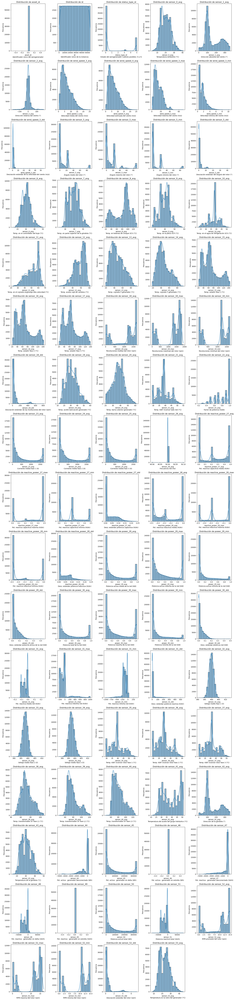

In [7]:
# Fuente: https://seaborn.pydata.org/generated/seaborn.histplot.html

# Crear histogramas para cada variable numérica
numerical_columns = train.select_dtypes(include=['float64', 'int64']).columns

num_cols = len(numerical_columns)
num_rows = (num_cols + 4) // 5

plt.figure(figsize=(20, 5 * num_rows))

for i, column in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, 5, i)
    sns.histplot(train[column], kde=True, bins=20)
    plt.title(f'Distribución de {column}')
    plt.xlabel(f"{column}\n{descripcion_variables.get(column, 'Descripción no disponible')}")
    plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

**Reducción de Dimensionalidad y Optimización del Dataset**

El análisis de las distribuciones de las variables numéricas del dataset revela ciertos patrones en la variabilidad de los datos, así como la presencia de valores extremos y sesgos en algunas de ellas. Para optimizar el análisis y la modelización, es conveniente eliminar las siguientes variables por las siguientes razones:

- **asset_id**: Se trata de un identificador único para cada aerogenerador, lo cual no aporta información relevante para el análisis predictivo. Su inclusión en modelos de machine learning no agregaría valor y podría inducir sesgos innecesarios.

- **id**: Es simplemente un número secuencial asignado a cada observación en el conjunto de datos. No contiene información sobre el estado operativo de los aerogeneradores, la velocidad del viento, las condiciones ambientales o cualquier otro factor relevante para el análisis de mantenimiento y predicción.

- **sensor_26_av**g: La distribución de esta variable muestra que prácticamente todos los valores son constantes en 50 Hz, lo que indica que representa la frecuencia del sistema eléctrico, un parámetro regulado y estable. Dado que no aporta variabilidad ni información relevante para el modelo, su eliminación es recomendable.

- **sensor_46**:Se observa que la variable tiene un único valor en toda la serie temporal, lo que la convierte en una variable redundante sin utilidad predictiva. Variables constantes no aportan información al modelo y pueden ser eliminadas sin afectar el desempeño de los algoritmos.

- **sensor_49**: Su distribución muestra que contiene un único valor (0) en todo el conjunto de datos. Esto implica que no aporta información significativa y no tiene impacto en el modelo, por lo que su eliminación es aconsejable.


In [6]:
# Lista de columnas a eliminar
columnas_a_eliminar = ['asset_id','id','sensor_26_avg', 'sensor_46', 'sensor_49']

# Eliminar las columnas del dataset
train = train.drop(columns=columnas_a_eliminar)

# Verificar que se eliminaron correctamente
print("Columnas después de la eliminación:", train.columns)

Columnas después de la eliminación: Index(['time_stamp', 'train_test', 'status_type_id', 'sensor_0_avg',
       'sensor_1_avg', 'sensor_2_avg', 'wind_speed_3_avg', 'wind_speed_4_avg',
       'wind_speed_3_max', 'wind_speed_3_min', 'wind_speed_3_std',
       'sensor_5_avg', 'sensor_5_max', 'sensor_5_min', 'sensor_5_std',
       'sensor_6_avg', 'sensor_7_avg', 'sensor_8_avg', 'sensor_9_avg',
       'sensor_10_avg', 'sensor_11_avg', 'sensor_12_avg', 'sensor_13_avg',
       'sensor_14_avg', 'sensor_15_avg', 'sensor_16_avg', 'sensor_17_avg',
       'sensor_18_avg', 'sensor_18_max', 'sensor_18_min', 'sensor_18_std',
       'sensor_19_avg', 'sensor_20_avg', 'sensor_21_avg', 'sensor_22_avg',
       'sensor_23_avg', 'sensor_24_avg', 'sensor_25_avg',
       'reactive_power_27_avg', 'reactive_power_27_max',
       'reactive_power_27_min', 'reactive_power_27_std',
       'reactive_power_28_avg', 'reactive_power_28_max',
       'reactive_power_28_min', 'reactive_power_28_std', 'power_29_avg',
     

**Eliminación de Variables para Optimizar el Dataset**

La eliminación de variables con los sufijos _min, _max y _std se justifica porque estas métricas suelen ser redundantes con las variables promedio (_avg), lo que podría generar colinealidad y afectar la capacidad de generalización del modelo. Además, reducir la cantidad de variables mejora la eficiencia computacional y facilita la interpretación del análisis sin introducir ruido innecesario. La eliminación de la columna id también es válida, ya que se trata de un identificador sin valor predictivo, evitando que el modelo aprenda relaciones irrelevantes. 

In [7]:
# Lista de patrones a eliminar
patrones_a_eliminar = ['_min', '_max', '_std']

# Filtrar columnas que contienen los patrones a eliminar
columnas_a_eliminar = [col for col in train.columns if any(p in col for p in patrones_a_eliminar)]

# Eliminar las columnas del dataset
train = train.drop(columns=columnas_a_eliminar)

# Verificar que se eliminaron correctamente
print("Columnas después de la eliminación:", train.columns)

Columnas después de la eliminación: Index(['time_stamp', 'train_test', 'status_type_id', 'sensor_0_avg',
       'sensor_1_avg', 'sensor_2_avg', 'wind_speed_3_avg', 'wind_speed_4_avg',
       'sensor_5_avg', 'sensor_6_avg', 'sensor_7_avg', 'sensor_8_avg',
       'sensor_9_avg', 'sensor_10_avg', 'sensor_11_avg', 'sensor_12_avg',
       'sensor_13_avg', 'sensor_14_avg', 'sensor_15_avg', 'sensor_16_avg',
       'sensor_17_avg', 'sensor_18_avg', 'sensor_19_avg', 'sensor_20_avg',
       'sensor_21_avg', 'sensor_22_avg', 'sensor_23_avg', 'sensor_24_avg',
       'sensor_25_avg', 'reactive_power_27_avg', 'reactive_power_28_avg',
       'power_29_avg', 'power_30_avg', 'sensor_31_avg', 'sensor_32_avg',
       'sensor_33_avg', 'sensor_34_avg', 'sensor_35_avg', 'sensor_36_avg',
       'sensor_37_avg', 'sensor_38_avg', 'sensor_39_avg', 'sensor_40_avg',
       'sensor_41_avg', 'sensor_42_avg', 'sensor_43_avg', 'sensor_44',
       'sensor_45', 'sensor_47', 'sensor_48', 'sensor_50', 'sensor_51',
      

**Visualización de muestras de los diferentes valores que contiene la característica "train_test"**



In [10]:
# Agrupar por 'train_test' y obtener 20 muestras aleatorias de cada grupo
muestras_train_test = train.groupby('train_test').apply(lambda x: x.sample(n=20, random_state=42)).reset_index(drop=True)

# Mostrar las 40 filas seleccionadas (20 de cada valor)
print(muestras_train_test)

            time_stamp  train_test  status_type_id  sensor_0_avg  \
0  2023-08-06 03:20:00  prediction               0          27.0   
1  2023-08-21 23:30:00  prediction               3          26.0   
2  2023-08-12 10:40:00  prediction               0          26.0   
3  2023-08-19 01:40:00  prediction               0          26.0   
4  2023-08-16 22:50:00  prediction               0          26.0   
5  2023-08-05 17:10:00  prediction               0          36.0   
6  2023-08-09 23:10:00  prediction               0          24.0   
7  2023-08-14 09:00:00  prediction               0          25.0   
8  2023-08-06 22:10:00  prediction               0          30.0   
9  2023-08-15 13:30:00  prediction               0          32.0   
10 2023-08-14 04:20:00  prediction               0          25.0   
11 2023-08-17 23:30:00  prediction               0          28.0   
12 2023-08-15 16:20:00  prediction               0          34.0   
13 2023-08-05 12:10:00  prediction              

C:\Users\aless\AppData\Local\Temp\ipykernel_16328\3643142755.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  muestras_train_test = train.groupby('train_test').apply(lambda x: x.sample(n=20, random_state=42)).reset_index(drop=True)


En el presente trabajo se busca desarrollar modelos de clasificación y predicción basados en técnicas de ciencia de datos aplicadas a un parque eólico. Para garantizar la validez del proceso de entrenamiento, ajuste y evaluación de modelos, es fundamental trabajar con observaciones que estén correctamente etiquetadas respecto al estado o clase objetivo, o que al menos representen una muestra coherente de datos históricos reales con variables explicativas completas y representativas. Dentro del conjunto de datos analizado, la columna train_test distingue entre dos tipos de registros:

**"train"**: Observaciones históricas etiquetadas, provenientes de periodos pasados del aerogenerador, las cuales reflejan condiciones conocidas del sistema y contienen información válida para el entrenamiento y validación del modelo.

**"prediction"**: Observaciones más recientes que, presumiblemente, están destinadas a ser utilizadas en la fase de predicción. Estas instancias no están etiquetadas en términos de clase objetivo y, en muchos casos, pueden reflejar características operativas diferentes o incluso contener variables faltantes, no supervisadas o estimadas.

En la muestra aleatoria analizada de ambas categorías se han observado diferencias relevantes entre las instancias "train" y "prediction" en múltiples variables operativas. Por ejemplo:

- Las instancias "train" abarcan una mayor variabilidad en condiciones de operación del aerogenerador, incluyendo tanto registros normales como extremos en temperatura, potencia activa, reactiva, velocidades de viento y otros sensores clave.

- Las observaciones "prediction", en cambio, presentan un comportamiento operacional más acotado, con menos variabilidad en algunas variables y en ciertos casos sin información asociada al resultado o estado real del sistema.

Además, la inclusión de las filas "prediction" durante el entrenamiento de modelos puede provocar los siguientes problemas:

* Riesgo de introducción de sesgos: Dado que estos datos están destinados a ser utilizados en la fase de inferencia, su inclusión en el entrenamiento puede sesgar los modelos hacia condiciones operativas recientes que no reflejan adecuadamente los estados históricos del sistema.

* Problemas de evaluación del modelo: Las instancias "prediction" no suelen contar con una etiqueta de clase conocida (por ejemplo, si hubo fallo, mantenimiento o condición operativa normal), por lo que no pueden ser utilizadas en la validación o testeo del desempeño del modelo.

* Contaminación del conjunto de entrenamiento: Incorporar datos no etiquetados o de naturaleza distinta (por ejemplo, simulados o provenientes de sistemas de predicción anteriores) puede disminuir la capacidad generalizadora del modelo, especialmente si se busca inferir sobre nuevas condiciones reales en el futuro.


Por lo tanto, y de acuerdo con buenas prácticas en el desarrollo de modelos de machine learning supervisado (ver: Géron, A. Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2019) Pag 54-56, se recomienda proceder con el filtrado de las instancias:

* Conservar únicamente las observaciones con train_test = 'train'.

* Eliminar las instancias con train_test = 'prediction' para asegurar la integridad del proceso de entrenamiento y evitar introducir datos que no cumplen con las condiciones necesarias para el aprendizaje supervisado.

In [8]:
# Separar los datos del dataset ya que incluyen valores que son del tipo predictivo
train_set = train[train['train_test'] == 'train']  # Datos de entrenamiento
prediction_set = train[train['train_test'] == 'prediction']   # Datos de predicción

#Eliminar columna 'train_test'
train=train_set
train = train.drop('train_test', axis=1)

# Mostrar el tamaño de cada conjunto de datos
print(f"Tamaño del conjunto de entrenamiento: {train_set.shape[0]} registros")
print(f"Tamaño del conjunto predictivo: {prediction_set.shape[0]} registros")

Tamaño del conjunto de entrenamiento: 52148 registros
Tamaño del conjunto predictivo: 2838 registros


# **Preprocesamiento**

**Valores nulos**

In [9]:
# Identificación de valores nulos
def valores_faltantes(df):
    missing_values = df.isnull().sum()
    print("\nValores nulos por columna:")
    print(missing_values[missing_values > 0])  # Muestra solo columnas con valores nulos

# Llamada a la función para verificar valores nulos en el dataset cargado
valores_faltantes(train)


Valores nulos por columna:
Series([], dtype: int64)


En el proceso de preprocesamiento de datos, se identificaron valores nulos en solo un registro de las variables sensor_14_avg y sensor_22_avg. Dado que el dataset cuenta con un total de 54,986 registros, la cantidad de datos faltantes representa menos del 0.002% del total, lo que es insignificante en términos estadísticos.

En este contexto, la eliminación del registro con valores nulos se considera la mejor estrategia por las siguientes razones:

Mínima pérdida de información: Al eliminar solo un registro, el impacto en la calidad del dataset es despreciable, manteniendo la representatividad de los datos.
Evita sesgos en la distribución: Imputar los valores faltantes con la media, mediana o moda podría alterar levemente las distribuciones originales de las variables, especialmente en el caso de sensor_22_avg, que presenta una distribución multimodal.
Simplificación del preprocesamiento: La eliminación de un único registro es una solución directa y eficiente, evitando la necesidad de justificar métodos de imputación que no aportarían un beneficio significativo en este caso.
Por lo tanto, se procede a eliminar el registro que contiene los valores nulos y a trabajar con un dataset completamente limpio para garantizar la calidad del análisis posterior.

In [10]:
# 📌 Verificar la cantidad de valores nulos antes de la eliminación
print("Valores nulos antes de la eliminación:")
print(train.isnull().sum()[train.isnull().sum() > 0])

# 📌 Eliminar el registro con valores nulos
train = train.dropna().reset_index(drop=True)

# 📌 Verificar que no haya valores nulos después de la eliminación
print("\nValores nulos después de la eliminación:")
print(train.isnull().sum().sum())  # Debería ser 0 si la eliminación fue exitosa


Valores nulos antes de la eliminación:
Series([], dtype: int64)

Valores nulos después de la eliminación:
0


**Valores duplicados**

In [11]:
# 📌 Verificar la cantidad de registros duplicados en el dataset
duplicados = train.duplicated().sum()

# 📌 Mostrar el resultado
if duplicados > 0:
    print(f"⚠️ Se encontraron {duplicados} registros duplicados en el dataset.")
else:
    print("✅ No se encontraron registros duplicados en el dataset.")


✅ No se encontraron registros duplicados en el dataset.


**Identificación de outliers**

Para realizar la detección de outliers en las variables numéricas del dataset, se utilizarán métodos estadísticos basados en el rango intercuartílico (IQR). Este método identifica valores extremos que se encuentran significativamente alejados de la mediana, lo cual puede afectar la calidad del modelo de Machine Learning.

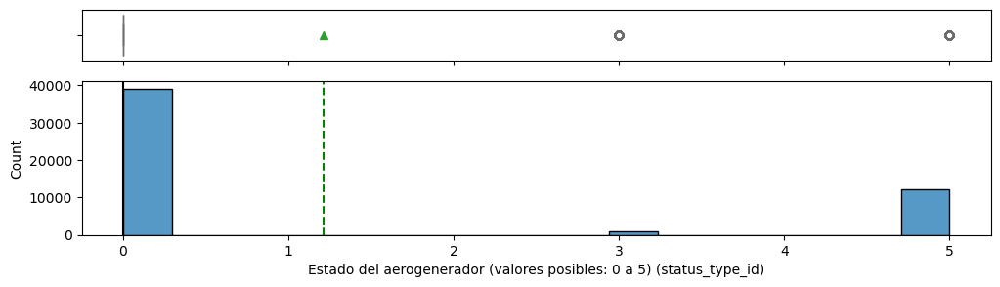

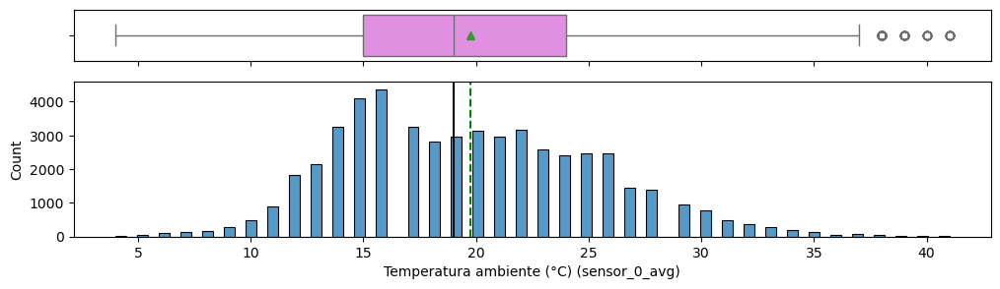

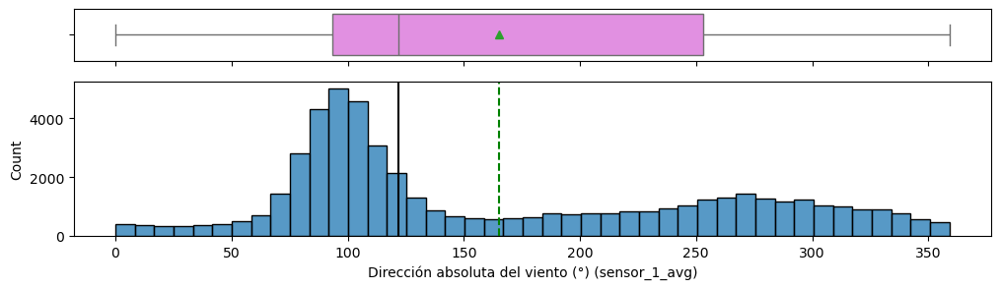

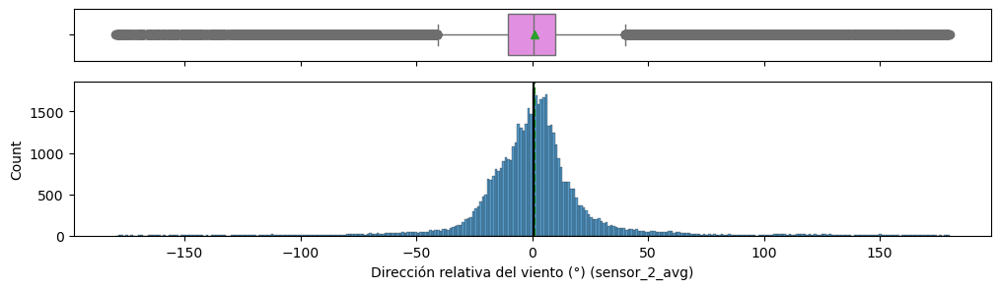

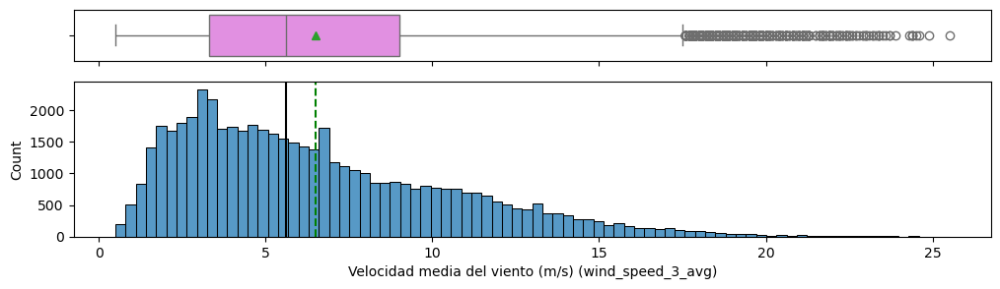

...

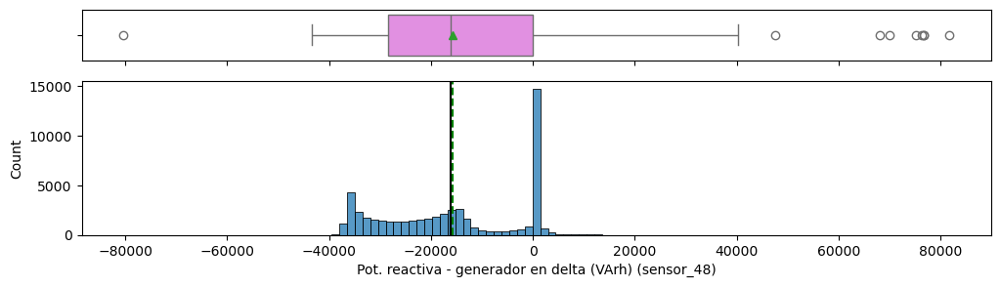

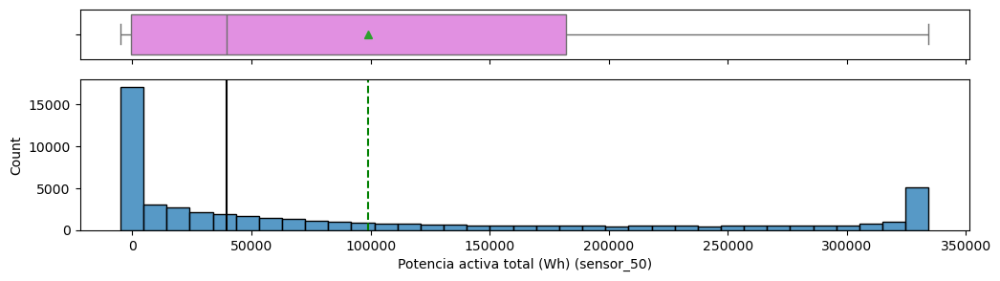

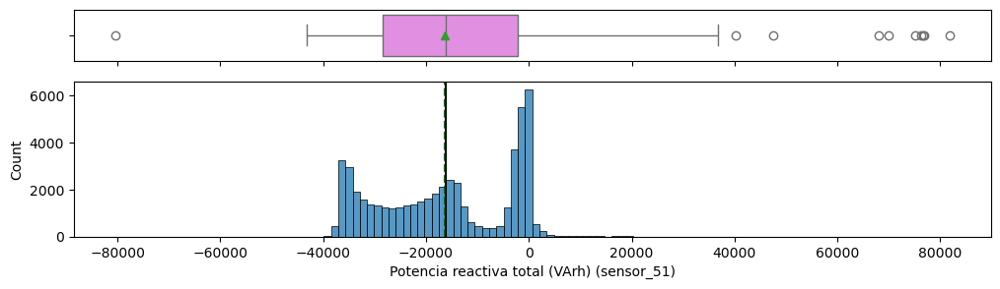

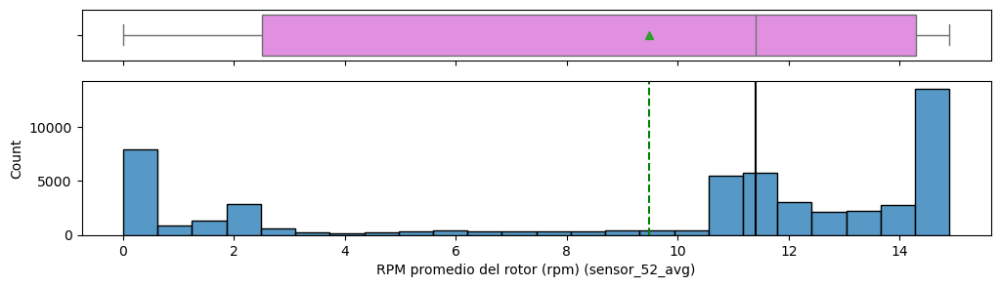

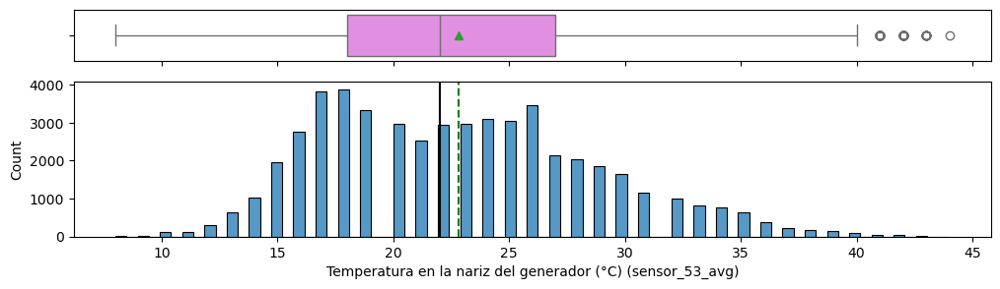

📊 Cantidad de outliers por variable (ordenado de mayor a menor):

status_type_id (Estado del aerogenerador (valores posibles: 0 a 5)): 12999 outliers
sensor_47 (Pot. reactiva - generador desconectado (VArh)): 8050 outliers
sensor_2_avg (Dirección relativa del viento (°)): 5176 outliers
sensor_44 (Pot. activa - generador desconectado (Wh)): 2580 outliers
sensor_5_avg (Ángulo medio del rotor (°)): 1843 outliers
sensor_39_avg (Temp. transformador AT fase L2 (°C)): 1266 outliers
sensor_38_avg (Temp. transformador AT fase L1 (°C)): 594 outliers
wind_speed_3_avg (Velocidad media del viento (m/s)): 593 outliers
sensor_37_avg (Temp. IGBT inversor rotor fase 3 (°C)): 518 outliers
sensor_21_avg (Temp. IGBT inversor lado red (°C)): 517 outliers
sensor_35_avg (Temp. IGBT inversor rotor fase 1 (°C)): 450 outliers
sensor_14_avg (Temp. cojinete 1 generador (°C)): 447 outliers
wind_speed_4_avg (Velocidad estimada del viento (m/s)): 438 outliers
sensor_10_avg (Temp. en el agua de refrigeración VCS (°C)

In [15]:
# 📌 Copiar el dataset original
df = train.copy()  # Asegúrate de que 'train' está definido en tu entorno

# 📌 Seleccionar solo columnas numéricas
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# 📌 Función para contar outliers usando el rango intercuartílico (IQR)
def count_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return len(outliers)

# 📌 Contar outliers por cada variable
outliers_count = {col: count_outliers(df, col) for col in numerical_columns}

# 📌 Ordenar de mayor a menor
outliers_sorted = sorted(outliers_count.items(), key=lambda x: x[1], reverse=True)

# 📌 Función para graficar boxplot e histograma juntos con etiquetas mejoradas
def histogram_boxplot(data, feature, figsize=(12, 3), kde=False, bins=None):

    # Obtener la descripción del sensor
    sensor_label = descripcion_variables.get(feature, feature)  # Si no está en el diccionario, usa el nombre original
    xlabel = f"{sensor_label} ({feature})"

    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Número de filas del grid de subplots = 2
        sharex=True,  # Compartir el eje x entre los subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},  # Proporción de los subplots
        figsize=figsize,
    )  
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # Boxplot con la media indicada
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # Histograma
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Línea de la media
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Línea de la mediana

    ax_hist2.set_xlabel(xlabel)  # Modificar etiqueta del eje X

    plt.show()
    plt.close(f2)  # 🔴 Cierra la figura después de mostrarla para liberar memoria

# 📌 Generar las gráficas para todas las variables numéricas
for column in numerical_columns:
    histogram_boxplot(df, column)

# 📌 Imprimir cantidad de outliers en orden de mayor a menor
print("📊 Cantidad de outliers por variable (ordenado de mayor a menor):\n")

for column, count in outliers_sorted:
    descripcion = descripcion_variables.get(column, "Descripción no disponible")
    print(f"{column} ({descripcion}): {count} outliers")


El análisis de valores atípicos en el conjunto de datos reveló la presencia de múltiples observaciones extremas en diferentes variables. Sin embargo, en lugar de eliminar estos datos, se ha decidido **conservarlos** debido a la naturaleza del problema en estudio. En un parque eólico, las condiciones meteorológicas y operativas pueden **experimentar fluctuaciones extremas** que impactan variables clave, como la velocidad del viento, la temperatura en los componentes del generador y la potencia generada. Estas variaciones pueden ser el resultado de eventos meteorológicos inusuales, como ráfagas de viento intensas o cambios bruscos de temperatura, los cuales son fenómenos naturales y no necesariamente errores en la recopilación de datos. La eliminación de estos valores podría llevar a la pérdida de información valiosa sobre el comportamiento del sistema en condiciones extremas, lo que afectaría la capacidad del modelo para realizar predicciones precisas en escenarios similares. Por lo tanto, se ha optado por retener los valores atípicos y monitorear su impacto en las siguientes fases del proceso de modelado, asegurando así una representación más realista y completa del fenómeno estudiado. Por otra parte, dado que la variable **status_type_id** presenta una cantidad significativa de outliers (12.999), es necesario **analizar con detalle si dicha caracteristica podría estar relacionada con transiciones entre diferentes condiciones de operación, fallos, eventos de mantenimiento o cambios en la configuración del sistema**.

---

**Ingeniería de caracteristicas**

---

Para reducir el número de características sin perder información relevante, se pueden aplicar estrategias de agrupación basadas en el significado físico de las variables y en su relación con el objetivo. Algunas de las características que pueden agruparse son:

**Temperaturas en el Generador**

Sensores: sensor_15_avg, sensor_16_avg, sensor_17_avg

Nueva Variable: temperatura_promedio_generador

Justificación: Estas variables representan temperaturas en distintas fases del generador, por lo que un promedio puede resumir la información sin pérdida de valor.

**Corriente en las Fases**

Sensores: sensor_23_avg, sensor_24_avg, sensor_25_avg

Nueva Variable: corriente_total

Justificación: La corriente en cada fase puede sumarse para obtener la corriente total del sistema.


**Voltaje en las Fases**

Sensores: sensor_32_avg, sensor_33_avg, sensor_34_avg

Nueva Variable: voltaje_promedio

Justificación: En la mayoría de los sistemas eléctricos, un promedio de voltajes trifásicos es representativo del sistema global.


**Potencia Reactiva en la Red**

Sensores: reactive_power_27_avg, reactive_power_28_avg, sensor_31_avg

Nueva Variable: potencia_reactiva_total

Justificación: La suma de las componentes de potencia reactiva proporciona una visión integral de la compensación de energía en el sistema.


**Temperatura en el Transformador HV**

Sensores: sensor_38_avg, sensor_39_avg, sensor_40_avg

Nueva Variable: temperatura_promedio_transformador

Justificación: Estas temperaturas corresponden a las distintas fases del transformador, y un promedio representa mejor su estado térmico.

In [46]:
train_backup=train
#train=train_backup

In [16]:
print("Columnas después de la eliminación:", train.columns)

Columnas después de la eliminación: Index(['time_stamp', 'status_type_id', 'sensor_0_avg', 'sensor_1_avg',
       'sensor_2_avg', 'wind_speed_3_avg', 'wind_speed_4_avg', 'sensor_5_avg',
       'sensor_6_avg', 'sensor_7_avg', 'sensor_8_avg', 'sensor_9_avg',
       'sensor_10_avg', 'sensor_11_avg', 'sensor_12_avg', 'sensor_13_avg',
       'sensor_14_avg', 'sensor_15_avg', 'sensor_16_avg', 'sensor_17_avg',
       'sensor_18_avg', 'sensor_19_avg', 'sensor_20_avg', 'sensor_21_avg',
       'sensor_22_avg', 'sensor_23_avg', 'sensor_24_avg', 'sensor_25_avg',
       'reactive_power_27_avg', 'reactive_power_28_avg', 'power_29_avg',
       'power_30_avg', 'sensor_31_avg', 'sensor_32_avg', 'sensor_33_avg',
       'sensor_34_avg', 'sensor_35_avg', 'sensor_36_avg', 'sensor_37_avg',
       'sensor_38_avg', 'sensor_39_avg', 'sensor_40_avg', 'sensor_41_avg',
       'sensor_42_avg', 'sensor_43_avg', 'sensor_44', 'sensor_45', 'sensor_47',
       'sensor_48', 'sensor_50', 'sensor_51', 'sensor_52_avg',
   

In [12]:
# Crear nuevas variables agrupadas
train["temperatura_promedio_generador"] = train[["sensor_15_avg", "sensor_16_avg", "sensor_17_avg"]].mean(axis=1)
train["corriente_total"] = train[["sensor_23_avg", "sensor_24_avg", "sensor_25_avg"]].sum(axis=1)
train["voltaje_promedio"] = train[["sensor_32_avg", "sensor_33_avg", "sensor_34_avg"]].mean(axis=1)
train["potencia_reactiva_total"] = train[["reactive_power_27_avg", "reactive_power_28_avg", "sensor_31_avg"]].sum(axis=1)
train["temperatura_promedio_transformador"] = train[["sensor_38_avg", "sensor_39_avg", "sensor_40_avg"]].mean(axis=1)


# Eliminar las características originales que fueron agrupadas
features_to_drop = [
    "sensor_15_avg", "sensor_16_avg", "sensor_17_avg",
    "sensor_23_avg", "sensor_24_avg", "sensor_25_avg",
    "sensor_32_avg", "sensor_33_avg", "sensor_34_avg",
    "reactive_power_27_avg", "reactive_power_28_avg", "sensor_31_avg",
    "sensor_38_avg", "sensor_39_avg", "sensor_40_avg"
]

train_reducido = train.drop(columns=features_to_drop)

print(f"✅ Características agrupadas y eliminadas: {len(features_to_drop)} columnas.")
print(f"📉 Nuevo dataset tiene {train_reducido.shape[1]} características.")

✅ Características agrupadas y eliminadas: 15 columnas.
📉 Nuevo dataset tiene 43 características.


**Normalizar el dataset**

In [13]:
# Crear una copia del dataset para evitar modificar el original
dataset_normalizado = train_reducido.copy()

# Seleccionar solo las columnas numéricas para normalizar
columnas_numericas = train_reducido.select_dtypes(include=['float64', 'int64']).columns
columnas_numericas = columnas_numericas.drop("status_type_id", errors="ignore")  # Excluir status_type_id

# Inicializar el escalador
scaler = StandardScaler()

# Aplicar la normalización a las columnas numéricas
dataset_normalizado[columnas_numericas] = scaler.fit_transform(train_reducido[columnas_numericas])

# Mantener `status_type_id` sin cambios
dataset_normalizado["status_type_id"] = train_reducido["status_type_id"]  # Se mantiene sin normalizar

# Verificar que los datos han sido normalizados
print(dataset_normalizado.describe())

# Guardar el dataset normalizado para su uso posterior
dataset_normalizado.to_csv("dataset_normalizado.csv", index=False)

# 📌 Guardar el scaler en un archivo para usarlo en la evaluación
joblib.dump(scaler, "scaler_estado.pkl")

print("\n✅ StandardScaler entrenado y guardado correctamente en 'scaler_estado.pkl'.")
print("✅ Normalización completada y datos guardados en 'dataset_normalizado.csv'.")


                          time_stamp  status_type_id  sensor_0_avg  \
count                          52148    52148.000000  5.214800e+04   
mean   2023-02-01 21:01:01.118355200        1.213220 -2.616097e-17   
min              2022-08-03 06:10:00        0.000000 -2.831922e+00   
25%              2022-11-03 04:17:30        0.000000 -8.526404e-01   
50%              2023-02-01 23:25:00        0.000000 -1.329015e-01   
75%              2023-05-03 13:22:30        0.000000  7.667722e-01   
max              2023-08-03 06:00:00        5.000000  3.825663e+00   
std                              NaN        2.120112  1.000010e+00   

       sensor_1_avg  sensor_2_avg  wind_speed_3_avg  wind_speed_4_avg  \
count  5.214800e+04  5.214800e+04      5.214800e+04      5.214800e+04   
mean   2.354487e-16 -6.540241e-18      4.360161e-17      1.177243e-16   
min   -1.802531e+00 -5.575262e+00     -1.509654e+00     -1.660004e+00   
25%   -7.833460e-01 -3.484618e-01     -8.058701e-01     -8.147979e-01   
50% 

# **1.- Recuperar dataset Normalizado**

In [84]:
# 📌 Cargar el dataset normalizado desde el archivo
dataset_normalizado = pd.read_csv("dataset_normalizado.csv")

# 📌 Verificar la carga del dataset
print("✅ Dataset reducido cargado correctamente desde el archivo.")

✅ Dataset reducido cargado correctamente desde el archivo.


# **Transformación**

**Matriz de Correlación de Datasets**


🔹 Calculando matriz de correlación para Matriz de correlación


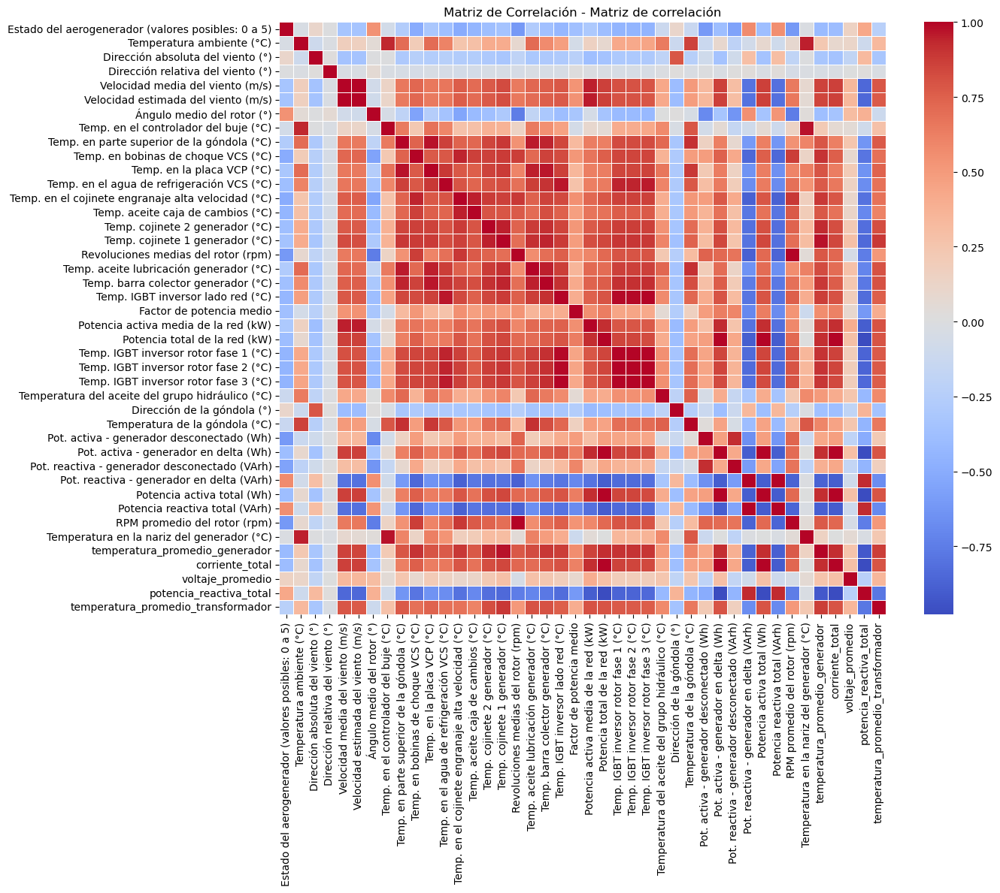

In [19]:
# 📌 Función para graficar la matriz de correlación usando descripciones
def graficar_matriz_correlacion(df, nombre_cluster):
    print(f"\n🔹 Calculando matriz de correlación para {nombre_cluster}")

    # 📌 Seleccionar solo columnas numéricas
    df_numeric = df.select_dtypes(include=[np.number])

    # 📌 Calcular la matriz de correlación
    corr_matrix = df_numeric.corr(method='pearson')

    # 📌 Renombrar columnas con descripciones
    columnas_renombradas = [
        descripcion_variables.get(col, col) for col in corr_matrix.columns
    ]
    corr_matrix.columns = columnas_renombradas
    corr_matrix.index = columnas_renombradas

    # 📌 Graficar el heatmap
    plt.figure(figsize=(14, 12))
    sns.heatmap(corr_matrix, cmap="coolwarm", annot=False, fmt=".2f", linewidths=0.5)
    plt.title(f"Matriz de Correlación - {nombre_cluster}")
    plt.tight_layout()
    plt.show()

# 📌 Aplicar el análisis
graficar_matriz_correlacion(dataset_normalizado, "Matriz de correlación")

El análisis de la matriz de correlación ha permitido identificar relaciones significativas entre las variables del dataset, facilitando la comprensión de la interacción entre los distintos sensores del aerogenerador. Sin embargo, debido a la gran cantidad de variables presentes, la interpretación directa de la matriz completa se ve obstaculizada por la sobrecarga de información y la dificultad para extraer patrones relevantes de manera intuitiva. Para facilitar la interpretación y mejorar la eficiencia del modelo, se han agrupado las variables en categorías funcionales basadas en su interacción con el estado operativo del aerogenerador. Este enfoque estructurado permite analizar con mayor precisión las relaciones dentro de cada grupo y facilita la identificación de patrones específicos que pueden ser relevantes para la predicción del estado del aerogenerador y la optimización del mantenimiento preventivo.

Los grupos de variables definidos en este análisis son:

**Grupo 1 - Condiciones Ambientales y Velocidad del Viento**: Incluye variables relacionadas con el entorno del aerogenerador, tales como temperatura ambiente, dirección del viento y velocidad del viento. Estas variables son fundamentales en la evaluación del rendimiento del aerogenerador, ya que afectan directamente la cantidad de energía generada y el desgaste estructural.

Variables incluidas: sensor_0_avg (Temperatura ambiente), sensor_1_avg (Dirección absoluta del viento), sensor_2_avg (Dirección relativa del viento), wind_speed_3_avg (Velocidad del viento), wind_speed_4_avg (Velocidad estimada del viento).

**Grupo 2 - Sensores Internos del Aerogenerador**: Comprende sensores que monitorean la temperatura en componentes internos clave, como el generador, la caja de engranajes y la góndola. La medición de temperatura en estos componentes es fundamental para la detección temprana de fallas y el desarrollo de estrategias de mantenimiento predictivo.

Variables incluidas: sensor_6_avg, sensor_7_avg, sensor_8_avg, sensor_9_avg, sensor_10_avg, sensor_11_avg, sensor_13_avg, sensor_14_avg, sensor_19_avg, sensor_20_avg, sensor_21_avg, sensor_35_avg, sensor_36_avg, sensor_37_avg, sensor_38_avg, sensor_39_avg, sensor_40_avg, sensor_41_avg, sensor_53_avg, temperatura_promedio_generador, temperatura_promedio_transformador.

**Grupo 3 - Sensores Eléctricos y de Potencia**: Este grupo abarca sensores de potencia activa y reactiva, así como sensores de voltaje y corriente en distintas partes del sistema eléctrico del aerogenerador. El análisis de estas variables permite evaluar la eficiencia energética del sistema y detectar posibles anomalías en la generación o distribución de energía.

Variables incluidas: reactive_power_27_avg, reactive_power_28_avg, power_29_avg, power_30_avg, sensor_31_avg, sensor_32_avg, sensor_33_avg, sensor_34_avg, sensor_44, sensor_45, sensor_47, sensor_48, sensor_50, sensor_51, corriente_total, voltaje_promedio, potencia_reactiva_total, rpm_promedio_generador.
Agrupar las variables de esta manera permite analizar la correlación dentro de cada grupo de manera más focalizada, facilitando la identificación de patrones clave en la operación del aerogenerador y contribuyendo a la optimización de su rendimiento y mantenimiento.


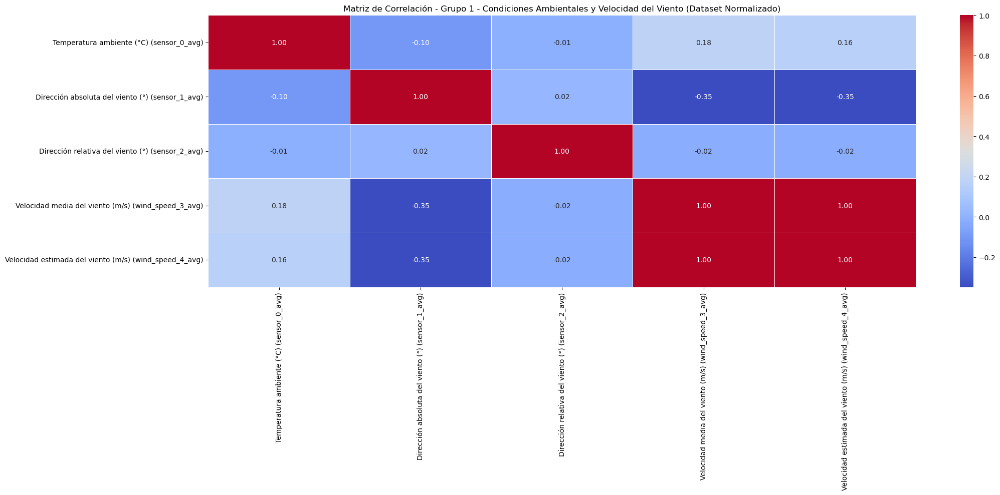

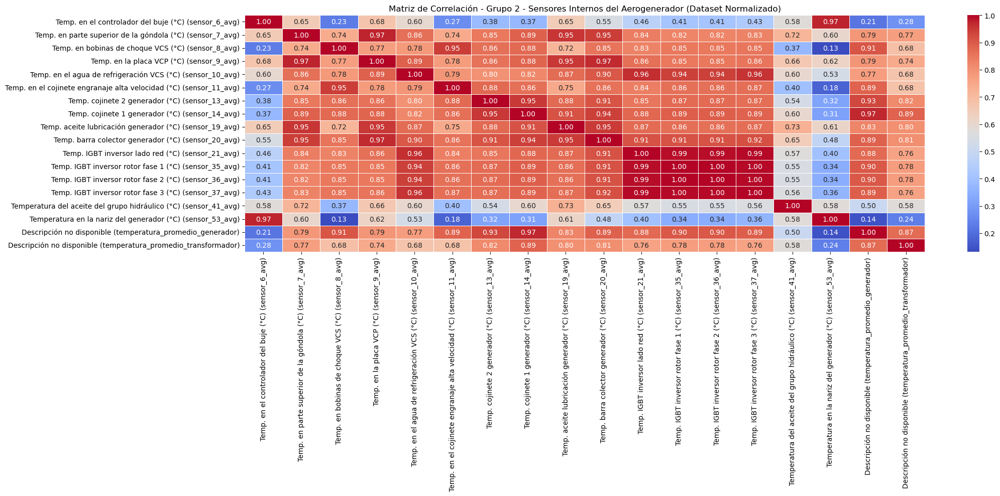

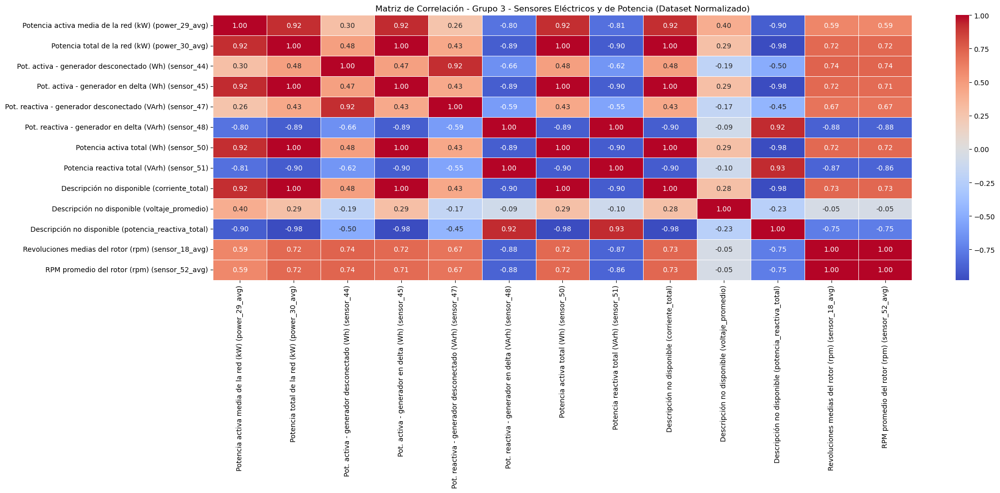

In [71]:
# 📌 Definir los grupos de sensores basados en la matriz de correlación visualizada
grupo_1 = ["sensor_0_avg", "sensor_1_avg", "sensor_2_avg", "wind_speed_3_avg", "wind_speed_4_avg"]

grupo_2 = ["sensor_6_avg", "sensor_7_avg", "sensor_8_avg", "sensor_9_avg", "sensor_10_avg", 
           "sensor_11_avg", "sensor_13_avg", "sensor_14_avg", "sensor_19_avg", "sensor_20_avg", 
           "sensor_21_avg", "sensor_35_avg", "sensor_36_avg", "sensor_37_avg", "sensor_38_avg", 
           "sensor_39_avg", "sensor_40_avg", "sensor_41_avg", "sensor_53_avg", 
           "temperatura_promedio_generador", "temperatura_promedio_transformador"]

grupo_3 = ["reactive_power_27_avg", "reactive_power_28_avg", "power_29_avg", "power_30_avg", 
           "sensor_31_avg", "sensor_32_avg", "sensor_33_avg", "sensor_34_avg", "sensor_44", 
           "sensor_45", "sensor_47", "sensor_48", "sensor_50", "sensor_51", "corriente_total", 
           "voltaje_promedio", "potencia_reactiva_total", "sensor_18_avg", "sensor_52_avg"]

# 📌 Función para calcular y mostrar la matriz de correlación de cada grupo con descripciones
def calcular_correlaciones(df, nombre_cluster):
    grupos = {
        "Grupo 1 - Condiciones Ambientales y Velocidad del Viento": grupo_1,
        "Grupo 2 - Sensores Internos del Aerogenerador": grupo_2,
        "Grupo 3 - Sensores Eléctricos y de Potencia": grupo_3
    }
    
    for nombre_grupo, variables in grupos.items():
        variables_presentes = [var for var in variables if var in df.columns] 

        if len(variables_presentes) > 1:  # Solo calcular si hay más de una variable
            # Calcular la matriz de correlación
            corr_matrix = df[variables_presentes].corr()

            # Crear etiquetas: descripción + (nombre original)
            etiquetas = [f"{descripcion_variables.get(col, 'Descripción no disponible')} ({col})" for col in corr_matrix.columns]
            corr_matrix.columns = etiquetas
            corr_matrix.index = etiquetas

            # Graficar heatmap
            plt.figure(figsize=(22, 10))
            sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
            plt.title(f"Matriz de Correlación - {nombre_grupo} ({nombre_cluster})")
            plt.tight_layout()
            plt.show()

# 📌 Calcular y graficar correlaciones en cada grupo con el dataset normalizado
calcular_correlaciones(dataset_normalizado, "Dataset Normalizado")

**Reducción de Características tras el Análisis de Correlación**

Luego de realizar un análisis de correlación en el dataset normalizado, se identificaron múltiples variables con una correlación excesiva. La eliminación de estas variables redundantes es esencial para reducir la dimensionalidad del problema, mejorar la eficiencia computacional y evitar problemas de multicolinealidad en los modelos predictivos. A continuación, se detallan las variables eliminadas, agrupadas según su funcionalidad:

1. Variables redundantes en la medición de velocidad del viento:
wind_speed_4_avg: Presenta una correlación extremadamente alta con wind_speed_3_avg, indicando que ambas variables registran prácticamente la misma información sobre la velocidad del viento. Para evitar la duplicidad en la representación de esta métrica, se ha optado por conservar solo una de ellas.

3. Sensores internos del aerogenerador con alta interdependencia:
Se ha identificado que varios sensores de temperatura presentan correlaciones superiores a 0.9 entre sí, reflejando mediciones redundantes dentro del aerogenerador:

sensor_7_avg, sensor_9_avg, sensor_10_avg, sensor_11_avg, sensor_14_avg, sensor_19_avg, sensor_20_avg, sensor_21_avg, sensor_35_avg, sensor_36_avg, sensor_37_avg: Estas variables corresponden a sensores de temperatura ubicados en diferentes componentes, como el controlador de la góndola, la caja de engranajes, el generador y el transformador. Dado que estas mediciones están altamente correlacionadas, se han eliminado algunas de ellas para evitar redundancias.
temperatura_promedio_generador y temperatura_promedio_transformador: Estas métricas agregadas mostraron una alta correlación con los sensores de temperatura individuales, lo que sugiere que su inclusión en el modelo no aporta información adicional significativa.

3. Variables relacionadas con la potencia y reactancia altamente correlacionadas:
Las mediciones de potencia activa, reactiva y corriente en el aerogenerador han mostrado correlaciones elevadas, lo que indica que algunas variables pueden ser eliminadas sin pérdida de información relevante:

power_30_avg: Se encuentra altamente correlacionada con power_29_avg, lo que indica que ambas representan la misma tendencia en la potencia activa del aerogenerador.
sensor_50 y sensor_51: Estas variables de potencia total presentan una correlación muy fuerte con otras métricas de potencia activa y reactiva, como corriente_total y potencia_reactiva_total, haciendo que su eliminación sea recomendable para evitar multicolinealidad.
sensor_45, sensor_48: Se ha determinado que estas variables tienen correlaciones superiores a 0.9 con otras mediciones de generación de energía, por lo que han sido eliminadas para evitar redundancias.

4. Variables redundantes en la medición de corriente y voltaje:
Las mediciones de corriente y voltaje en distintas fases también presentan alta correlación, lo que justifica la eliminación de algunas de ellas:

corriente_total: Altamente correlacionada con las mediciones de potencia activa, lo que sugiere que su información está implícitamente representada en otras variables.
voltaje_promedio: Correlacionada con otras métricas de voltaje y potencia, por lo que se ha eliminado para reducir la dimensionalidad sin afectar la información contenida en el dataset.




In [14]:
# 📌 Definir las variables a eliminar
variables_eliminar = [
    "wind_speed_4_avg","sensor_9_avg","sensor_11_avg","sensor_14_avg","sensor_18_avg","sensor_19_avg","sensor_20_avg","sensor_21_avg",
    "sensor_35_avg","sensor_36_avg","sensor_37_avg","sensor_53_avg","temperatura_promedio_generador","power_29_avg","power_30_avg",
    "sensor_45","sensor_51","corriente_total","potencia_reactiva_total"
]

# 📌 Eliminar las variables de los datasets
dataset_reducido_sin_normalizar=train_reducido.drop(columns=variables_eliminar, errors='ignore')
dataset_reducido = dataset_normalizado.drop(columns=variables_eliminar, errors='ignore')

print("✅ Variables con alta correlación eliminadas correctamente.")


✅ Variables con alta correlación eliminadas correctamente.


In [22]:
print("Columnas después de la eliminación:", dataset_reducido.columns)

Columnas después de la eliminación: Index(['time_stamp', 'status_type_id', 'sensor_0_avg', 'sensor_1_avg',
       'sensor_2_avg', 'wind_speed_3_avg', 'sensor_5_avg', 'sensor_6_avg',
       'sensor_7_avg', 'sensor_8_avg', 'sensor_10_avg', 'sensor_12_avg',
       'sensor_13_avg', 'sensor_22_avg', 'sensor_41_avg', 'sensor_42_avg',
       'sensor_43_avg', 'sensor_44', 'sensor_47', 'sensor_48', 'sensor_50',
       'sensor_52_avg', 'voltaje_promedio',
       'temperatura_promedio_transformador'],
      dtype='object')


**Almacenar el dataset reducido en disco**

In [15]:
# 📌 Guardar el dataset reducido (Normalizado) en un archivo CSV
dataset_reducido.to_csv("dataset_reducido.csv", index=False)

# 📌 Guardar el dataset reducido (Sin Normalizar) en un archivo CSV

dataset_reducido_sin_normalizar.to_csv("dataset_reducido_sin_normalizar.csv", index=False)

print("✅ Datasets guardados correctamente")

✅ Datasets guardados correctamente


# **2.- Recuperar el dataset reducido **

In [10]:
# 📌 Cargar el dataset reducido desde el archivo
dataset_reducido = pd.read_csv("dataset_reducido.csv")
dataset_reducido_sin_normalizar= pd.read_csv("dataset_reducido_sin_normalizar.csv")

# 📌 Verificar la carga del dataset
print("✅ Dataset reducido cargado correctamente desde el archivo.")

✅ Dataset reducido cargado correctamente desde el archivo.


# **Objetivo 1. 
Reducción de dimensionalidad con PCA**

C:\Users\aless\AppData\Local\Temp\ipykernel_19216\3865383769.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_pca_2d[:,0], X_pca_2d[:,1], alpha=0.5, cmap='viridis')


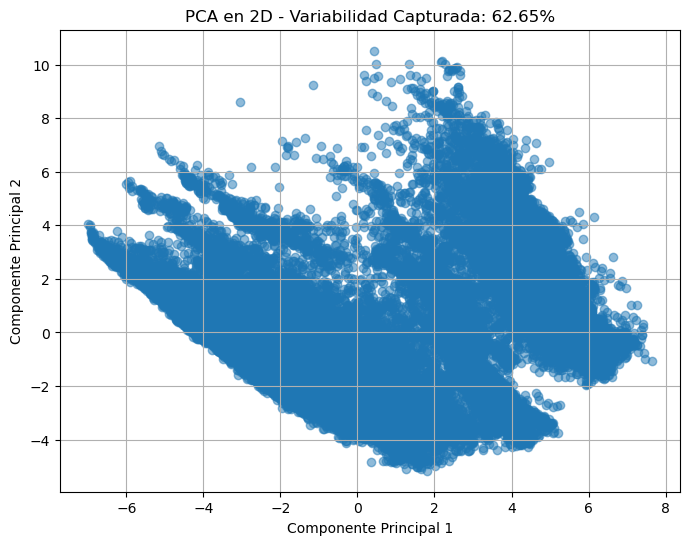

C:\Users\aless\AppData\Local\Temp\ipykernel_19216\3865383769.py:29: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_pca_3d[:,0], X_pca_3d[:,1], X_pca_3d[:,2], alpha=0.5, cmap='viridis')


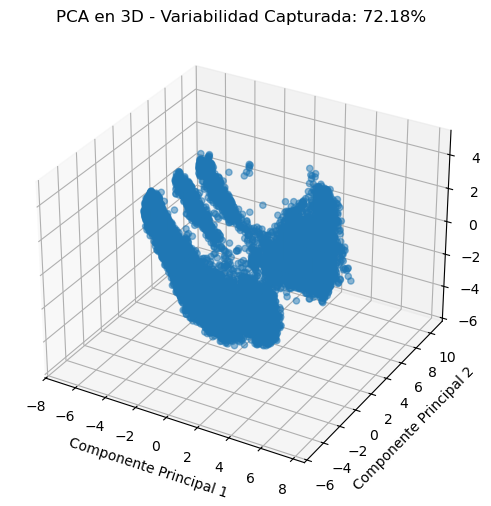

In [16]:
# 📌 Asegurar que solo se usen variables numéricas
X = dataset_reducido.select_dtypes(include=[np.number])
X_backup=X
X_normalizado=X

# 📌 Aplicar PCA en 2 y 3 dimensiones
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X)
varianza_pca_2d = np.sum(pca_2d.explained_variance_ratio_) * 100

pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X)
varianza_pca_3d = np.sum(pca_3d.explained_variance_ratio_) * 100

# 📌 Graficar PCA en 2D
plt.figure(figsize=(8,6))
plt.scatter(X_pca_2d[:,0], X_pca_2d[:,1], alpha=0.5, cmap='viridis')
plt.title(f"PCA en 2D - Variabilidad Capturada: {varianza_pca_2d:.2f}%")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.grid()
plt.show()



# 📌 Graficar PCA en 3D
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca_3d[:,0], X_pca_3d[:,1], X_pca_3d[:,2], alpha=0.5, cmap='viridis')
ax.set_title(f"PCA en 3D - Variabilidad Capturada: {varianza_pca_3d:.2f}%")
ax.set_xlabel("Componente Principal 1")
ax.set_ylabel("Componente Principal 2")
ax.set_zlabel("Componente Principal 3")
plt.show()




In [ ]:
# 📌 Visualización interactiva de PCA en 3D
fig_pca = px.scatter_3d(
    x=X_pca_3d[:, 0], y=X_pca_3d[:, 1], z=X_pca_3d[:, 2],
    title=f"PCA en 3D - Variabilidad Capturada: {varianza_pca_3d:.2f}%",
    labels={"x": "Componente Principal 1", "y": "Componente Principal 2", "z": "Componente Principal 3"},
    opacity=0.7
)

# Aumentar el tamaño de la figura
fig_pca.update_layout(
    width=1200,  # Ancho en píxeles
    height=800,  # Alto en píxeles
    margin=dict(l=0, r=0, b=0, t=50)  # Ajustar márgenes para mejor visualización
)

fig_pca.show()

En la visualización del PCA en 3D, se puede apreciar cierta estructura en los datos, con una forma levemente definida que sugiere que podrían existir agrupaciones o patrones en los datos. Sin embargo, la presencia de una forma continua y dispersa indica que no hay una segmentación clara de clústeres a simple vista.

Para determinar el número óptimo de componentes principales a utilizar en el análisis, asegurando que se conserve al menos un 90% de la varianza explicada. Se calcula la varianza acumulada a medida que se agregan más componentes y se representa gráficamente, facilitando la selección del punto en el que se logra el mejor equilibrio entre reducción de dimensionalidad y retención de información. Esta técnica es especialmente útil antes de aplicar algoritmos de clustering, ya que permite trabajar con un espacio de menor dimensión sin afectar significativamente la estructura de los datos.

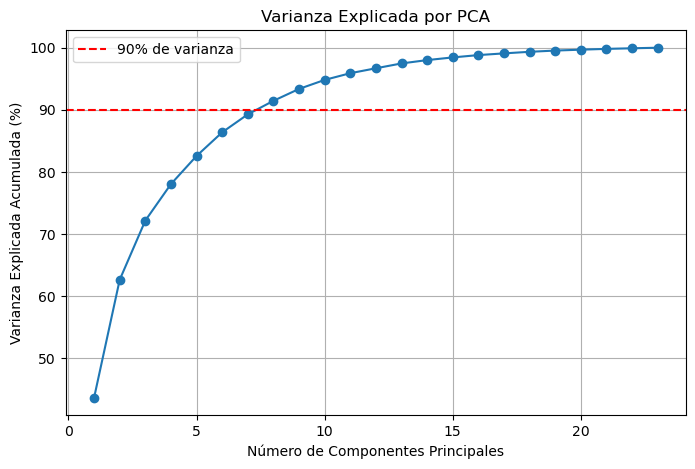

In [17]:

# Calcular PCA con más componentes para análisis
pca_full = PCA().fit(X)
explained_variance = np.cumsum(pca_full.explained_variance_ratio_) * 100

# Graficar la varianza acumulada
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance)+1), explained_variance, marker='o', linestyle='-')
plt.axhline(y=90, color='r', linestyle='--', label="90% de varianza")
plt.xlabel("Número de Componentes Principales")
plt.ylabel("Varianza Explicada Acumulada (%)")
plt.title("Varianza Explicada por PCA")
plt.legend()
plt.grid()
plt.show()

La gráfica muestra la varianza explicada acumulada en función del número de componentes principales. Observaciones clave:

La línea roja (90% de varianza explicada) se cruza aproximadamente en el octavo componente principal.

Las primeras 3 componentes explican alrededor de un 70%, lo que sugiere que X_pca_3d podría no capturar toda la información relevante.

Con ~8 componentes se supera el umbral del 90%, lo que indica que reducir la dimensionalidad a 8 dimensiones podría ser una mejor opción para clustering.

Se realiza 

# **PCA con 8 compoenntes principales**

In [18]:
#PCA con 8 componentes principales

X_cpu = pd.DataFrame(X)

# Aplicar PCA con 8 componentes para reducir dimensionalidad
pca_8d = PCA(n_components=8, random_state=42)
X_pca_8d = pca_8d.fit_transform(X_cpu)

K=2: Inercia = 798716.1763, Silhouette Score = 0.3820
K=3: Inercia = 611600.3029, Silhouette Score = 0.3066
K=4: Inercia = 532387.3966, Silhouette Score = 0.3044
K=5: Inercia = 469372.5553, Silhouette Score = 0.2976
K=6: Inercia = 417512.8450, Silhouette Score = 0.2818
K=7: Inercia = 388224.3783, Silhouette Score = 0.2700

📌 Mejor número de clusters según Silhouette Score: K=2


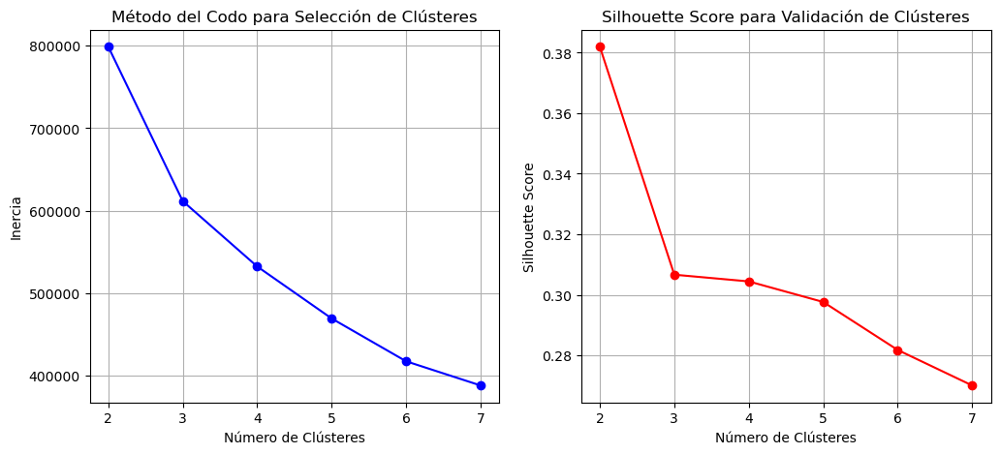

⏳ Tiempo de ejecución: 4 minutos y 17.98 segundos


In [10]:
#Método del codo



start_time = time.time()  # Iniciar tiempo


# Valores de K a probar
k_values = [2, 3, 4, 5, 6, 7]
silhouette_scores = {}
inertia_values = {}

# Evaluar cada número de clusters
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca_8d)

    # Calcular Inercia (Suma de errores al cuadrado)
    inertia = kmeans.inertia_
    inertia_values[k] = inertia

    # Calcular Silhouette Score
    silhouette = silhouette_score(X_pca_8d, labels)
    silhouette_scores[k] = silhouette

    print(f"K={k}: Inercia = {inertia:.4f}, Silhouette Score = {silhouette:.4f}")

# Seleccionar el mejor K según Silhouette Score
best_k = max(silhouette_scores, key=silhouette_scores.get)
print(f"\n📌 Mejor número de clusters según Silhouette Score: K={best_k}")

# Graficar el método del codo y Silhouette Score en subgráficos
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Gráfico del Codo (Inercia)
axes[0].plot(inertia_values.keys(), inertia_values.values(), marker='o', linestyle='-', color='blue')
axes[0].set_xlabel("Número de Clústeres")
axes[0].set_ylabel("Inercia")
axes[0].set_title("Método del Codo para Selección de Clústeres")
axes[0].grid()

# Gráfico del Silhouette Score
axes[1].plot(silhouette_scores.keys(), silhouette_scores.values(), marker='o', linestyle='-', color='red')
axes[1].set_xlabel("Número de Clústeres")
axes[1].set_ylabel("Silhouette Score")
axes[1].set_title("Silhouette Score para Validación de Clústeres")
axes[1].grid()

# Mostrar gráficos
plt.show()

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

En la imagen, la curva de inercia muestra un cambio significativo en la pendiente alrededor de K = 3 o K = 4, después de lo cual la reducción de la inercia se vuelve más gradual. Sin embargo, el Silhouette Score es mayor en K=2, lo que sugiere una mejor separación entre clústeres y mayor cohesión dentro de cada grupo. Si el objetivo es una segmentación con una estructura más definida, K=2 sería la mejor opción, pero si se busca un balance entre separación y estructura interna, K=3 o 4 sería la opcion mas viable. No obstante, con un Silhouette Score de alrededor de 0.3, el resultado sigue siendo bajo, lo que sugiere que los clústeres pueden estar solapados o que KMeans podría no ser la mejor opción para esta segmentación.

Dado que KMeans no está dando buenos resultados, podemos probar métodos más avanzados:


⏳ K=3 - Tiempo de ejecución: 0 minutos y 38.04 segundos
📈 Silhouette Score para K=3: 0.2639
⏳ K=4 - Tiempo de ejecución: 0 minutos y 36.04 segundos
📈 Silhouette Score para K=4: 0.2622


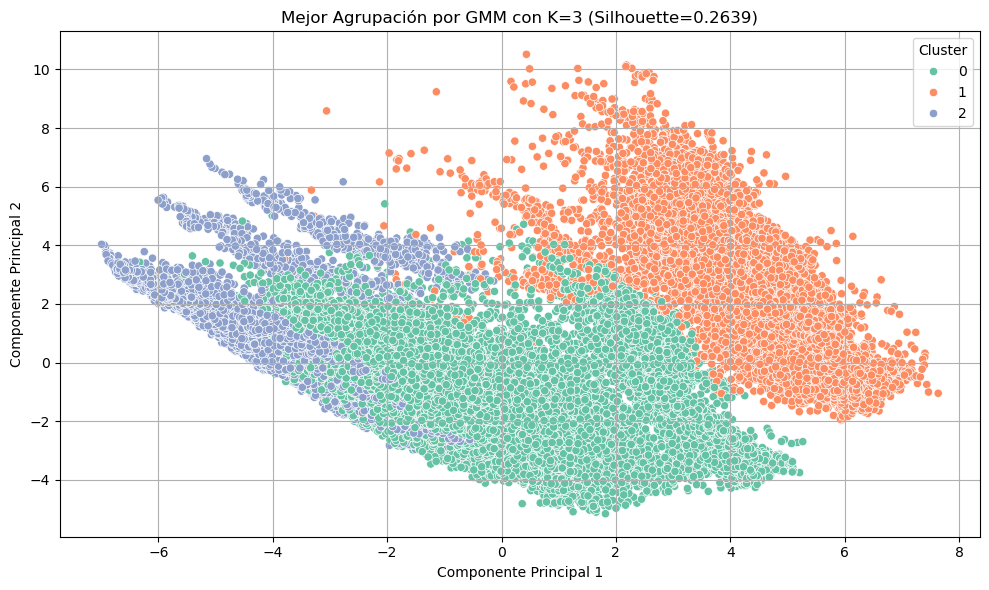


📊 Resultados finales de Silhouette Score:
 - K=3: Silhouette Score = 0.2639
 - K=4: Silhouette Score = 0.2622

✅ El mejor valor de K fue 3 con un Silhouette Score de 0.2639


In [28]:
# Inicializar variables
best_k = None
best_score = -1
scores = {}
best_labels = None
best_model = None

# Evaluar para K=3 y K=4
for k in [3, 4]:
    start_time = time.time()
    gmm = GaussianMixture(n_components=k, random_state=42)
    labels = gmm.fit_predict(X_pca_8d)
    score = silhouette_score(X_pca_8d, labels)
    end_time = time.time()

    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)
    print(f"⏳ K={k} - Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")
    print(f"📈 Silhouette Score para K={k}: {score:.4f}")
    scores[k] = score

    # Guardar el mejor modelo
    if score > best_score:
        best_k = k
        best_score = score
        best_labels = labels
        best_model = gmm

# Visualización del mejor clustering
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca_8d[:, 0], y=X_pca_8d[:, 1], hue=best_labels, palette="Set2", legend="full")
plt.title(f"Mejor Agrupación por GMM con K={best_k} (Silhouette={best_score:.4f})")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.grid(True)
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

# Mensaje final con los resultados
print("\n📊 Resultados finales de Silhouette Score:")
for k, score in scores.items():
    print(f" - K={k}: Silhouette Score = {score:.4f}")

print(f"\n✅ El mejor valor de K fue {best_k} con un Silhouette Score de {best_score:.4f}")



⏳ min_cluster_size=3 - Tiempo de ejecución: 0 minutos y 6.50 segundos
📈 Silhouette Score para min_cluster_size=3: -0.0117

⏳ min_cluster_size=5 - Tiempo de ejecución: 0 minutos y 5.14 segundos
📈 Silhouette Score para min_cluster_size=5: 0.0356

⏳ min_cluster_size=7 - Tiempo de ejecución: 0 minutos y 5.88 segundos
📈 Silhouette Score para min_cluster_size=7: 0.1069

⏳ min_cluster_size=10 - Tiempo de ejecución: 0 minutos y 4.91 segundos
📈 Silhouette Score para min_cluster_size=10: 0.1356


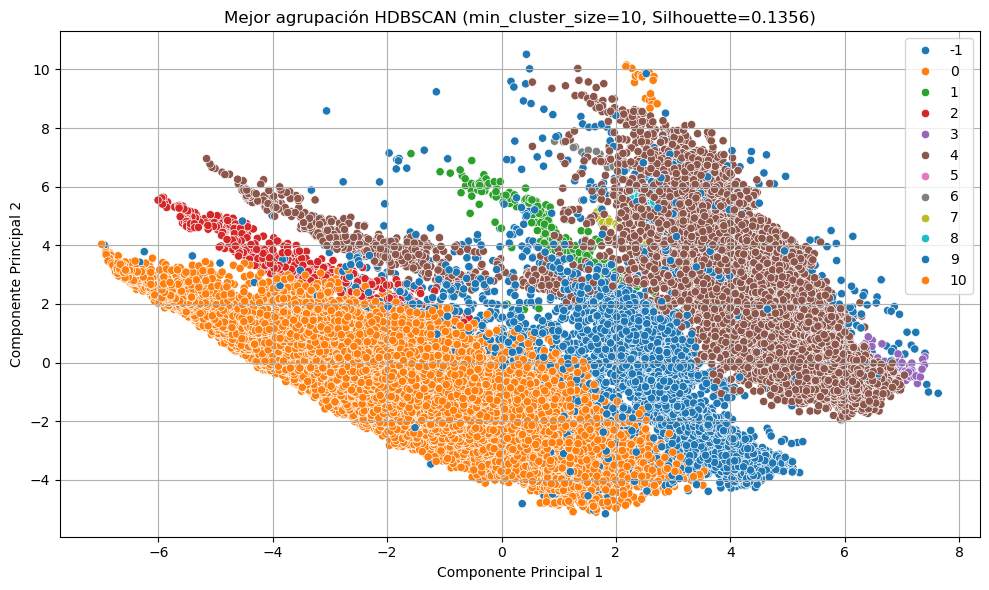


📊 Resultados finales de Silhouette Score:
 - min_cluster_size=3: Silhouette Score = -0.0117
 - min_cluster_size=5: Silhouette Score = 0.0356
 - min_cluster_size=7: Silhouette Score = 0.1069
 - min_cluster_size=10: Silhouette Score = 0.1356

✅ El mejor valor de min_cluster_size fue 10 con un Silhouette Score de 0.1356


In [76]:
# Valores a evaluar para min_cluster_size
min_cluster_sizes = [3, 5, 7, 10]
scores = {}
best_score = -1
best_model = None
best_labels = None
best_min_size = None

# Evaluar distintos valores de min_cluster_size
for size in min_cluster_sizes:
    start_time = time.time()
    model = hdbscan.HDBSCAN(min_cluster_size=size)
    labels = model.fit_predict(X_pca_8d)
    end_time = time.time()

    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)

    print(f"\n⏳ min_cluster_size={size} - Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

    if len(set(labels)) > 1 and -1 in labels and len(set(labels)) > 2:
        # HDBSCAN puede asignar -1 a puntos como "ruido"
        score = silhouette_score(X_pca_8d[labels != -1], labels[labels != -1])
        print(f"📈 Silhouette Score para min_cluster_size={size}: {score:.4f}")
        scores[size] = score

        if score > best_score:
            best_score = score
            best_model = model
            best_labels = labels
            best_min_size = size
    elif len(set(labels)) > 1:
        score = silhouette_score(X_pca_8d, labels)
        print(f"📈 Silhouette Score para min_cluster_size={size} (sin ruido): {score:.4f}")
        scores[size] = score

        if score > best_score:
            best_score = score
            best_model = model
            best_labels = labels
            best_min_size = size
    else:
        print("⚠️ HDBSCAN detectó solo 1 clúster (o solo ruido), no se calcula Silhouette Score.")

# Visualizar mejor clustering
if best_labels is not None:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=X_pca_8d[:, 0], y=X_pca_8d[:, 1], hue=best_labels, palette="tab10", legend="full")
    plt.title(f"Mejor agrupación HDBSCAN (min_cluster_size={best_min_size}, Silhouette={best_score:.4f})")
    plt.xlabel("Componente Principal 1")
    plt.ylabel("Componente Principal 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
else:
    print("\n❌ No se encontró una configuración con más de un clúster válido.")

# Mostrar todos los resultados
print("\n📊 Resultados finales de Silhouette Score:")
for size, score in scores.items():
    print(f" - min_cluster_size={size}: Silhouette Score = {score:.4f}")

if best_min_size is not None:
    print(f"\n✅ El mejor valor de min_cluster_size fue {best_min_size} con un Silhouette Score de {best_score:.4f}")



🔍 Ejecutando Clustering Espectral con K=2...


C:\Users\aless\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



📊 Silhouette Score para K=2: 0.3721
⏳ Tiempo de ejecución para K=2: 1 minutos y 12.24 segundos


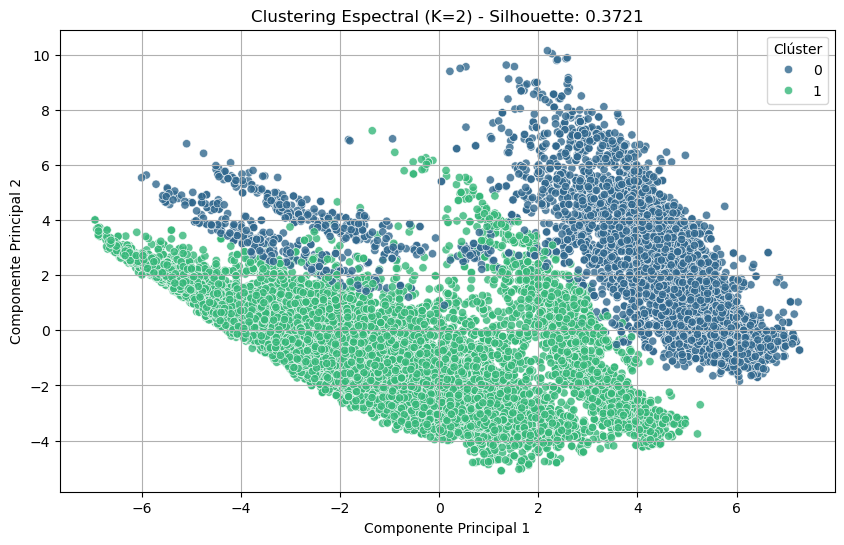


🔍 Ejecutando Clustering Espectral con K=3...


C:\Users\aless\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



📊 Silhouette Score para K=3: 0.1842
⏳ Tiempo de ejecución para K=3: 1 minutos y 2.00 segundos


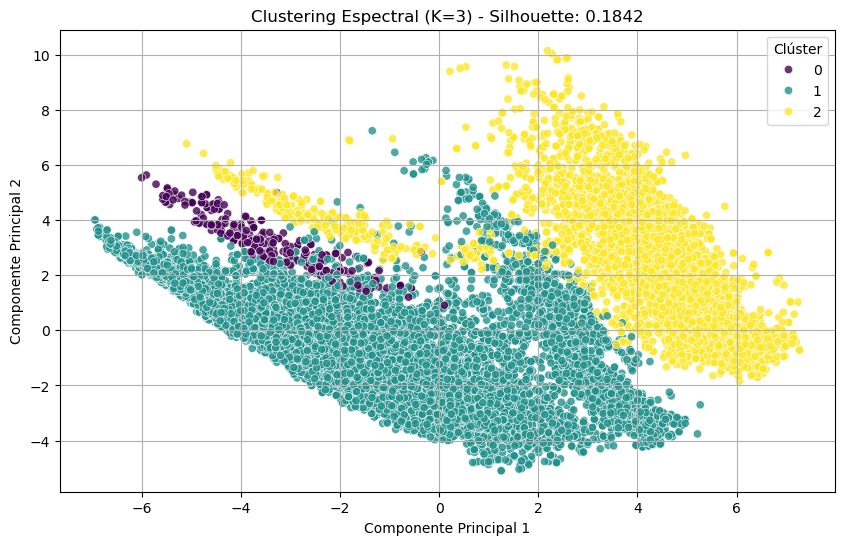


🔍 Ejecutando Clustering Espectral con K=4...


C:\Users\aless\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



📊 Silhouette Score para K=4: 0.1897
⏳ Tiempo de ejecución para K=4: 0 minutos y 54.74 segundos


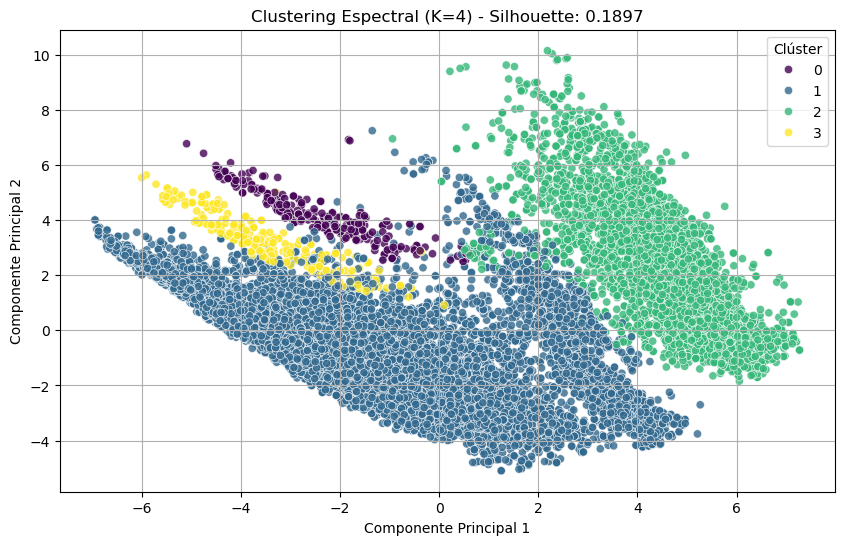

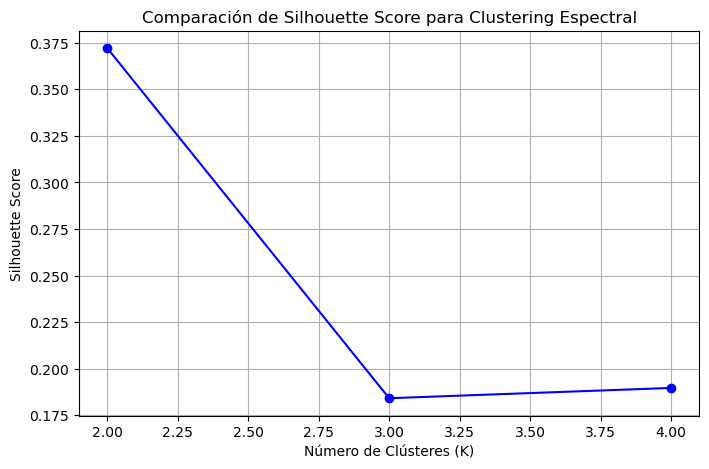

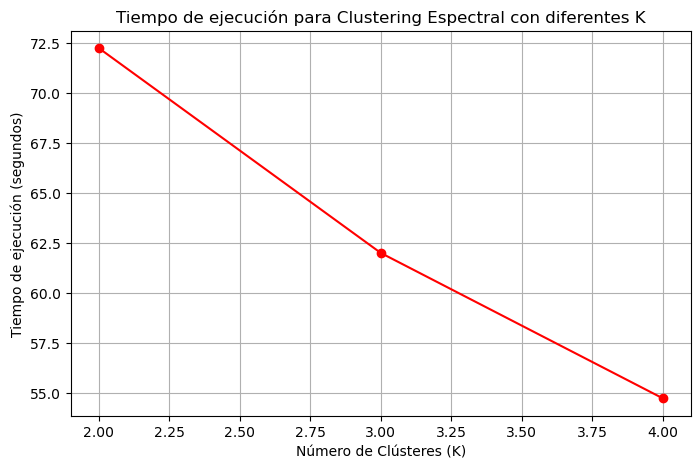

In [30]:
#Clustering Espectral

import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import SpectralClustering
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.utils import resample

# 📌 Reducción de dimensionalidad antes del clustering
pca = PCA(n_components=7, random_state=42)
X_pca_2d = pca.fit_transform(X_pca_8d)

# 📌 Submuestreo si el dataset es muy grande
X_sampled = resample(X_pca_2d, n_samples=25000, random_state=42)  # Reducimos el tamaño para mayor eficiencia

# 📌 Definir valores de K a probar
k_values = [2, 3, 4]
silhouette_scores = {}
time_results = {}

# 📌 Iterar sobre cada valor de K
for k in k_values:
    print(f"\n🔍 Ejecutando Clustering Espectral con K={k}...")
    start_time = time.time()  # Iniciar tiempo
    
    # 📌 Aplicar Clustering Espectral
    spectral = SpectralClustering(n_clusters=k, affinity='nearest_neighbors', assign_labels="kmeans", random_state=42)
    labels_spectral = spectral.fit_predict(X_sampled)
    
    # 📌 Calcular Silhouette Score
    silhouette = silhouette_score(X_sampled, labels_spectral)
    silhouette_scores[k] = silhouette
    print(f"📊 Silhouette Score para K={k}: {silhouette:.4f}")
    
    # 📌 Calcular tiempo total
    end_time = time.time()
    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)
    time_results[k] = elapsed_time
    print(f"⏳ Tiempo de ejecución para K={k}: {int(minutes)} minutos y {seconds:.2f} segundos")
    
    # 📌 Graficar los clústeres obtenidos
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=X_sampled[:, 0], y=X_sampled[:, 1], hue=labels_spectral, palette="viridis", alpha=0.8)
    plt.xlabel("Componente Principal 1")
    plt.ylabel("Componente Principal 2")
    plt.title(f"Clustering Espectral (K={k}) - Silhouette: {silhouette:.4f}")
    plt.legend(title="Clúster")
    plt.grid()
    plt.show()

# 📌 Graficar la comparación de Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(silhouette_scores.keys(), silhouette_scores.values(), marker='o', linestyle='-', color='blue')
plt.xlabel("Número de Clústeres (K)")
plt.ylabel("Silhouette Score")
plt.title("Comparación de Silhouette Score para Clustering Espectral")
plt.grid()
plt.show()

# 📌 Graficar la comparación de tiempos de ejecución
plt.figure(figsize=(8, 5))
plt.plot(time_results.keys(), time_results.values(), marker='o', linestyle='-', color='red')
plt.xlabel("Número de Clústeres (K)")
plt.ylabel("Tiempo de ejecución (segundos)")
plt.title("Tiempo de ejecución para Clustering Espectral con diferentes K")
plt.grid()
plt.show()



📊 **DBSCAN** - Silhouette Score: -0.2297


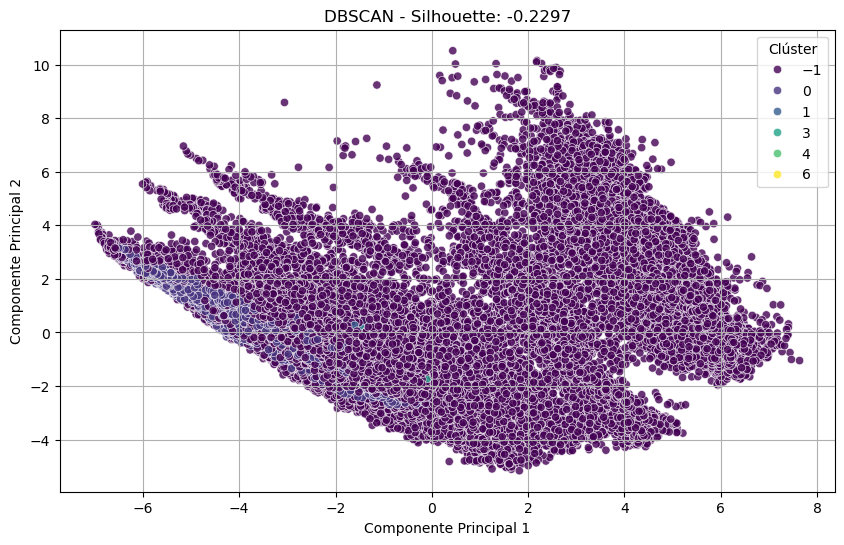

⏳ Tiempo de ejecución: 0 minutos y 40.75 segundos


In [32]:
#DBSCAN
# DBSCAN
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

start_time = time.time()  # Iniciar tiempo

# 📌 Aplicar DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=25)
labels_dbscan = dbscan.fit_predict(X_pca_8d)

# 📌 Calcular Silhouette Score (si hay más de 1 clúster)
num_clusters = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)  # Excluye outliers (-1)
if num_clusters > 1:
    silhouette_dbscan = silhouette_score(X_pca_8d, labels_dbscan)
    print(f"\n📊 **DBSCAN** - Silhouette Score: {silhouette_dbscan:.4f}")
else:
    silhouette_dbscan = -1  # No se puede calcular si hay solo 1 clúster
    print("\n⚠️ **DBSCAN no generó múltiples clústeres, no se puede calcular Silhouette Score**")

# 📌 Graficar los clústeres obtenidos
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca_8d[:, 0], y=X_pca_8d[:, 1], hue=labels_dbscan, palette="viridis", alpha=0.8)
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.title(f"DBSCAN - Silhouette: {silhouette_dbscan:.4f}" if silhouette_dbscan != -1 else "DBSCAN - Sin Clústeres")
plt.legend(title="Clúster")
plt.grid()
plt.show()

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")




📊 **Mean Shift** - Silhouette Score: 0.3136


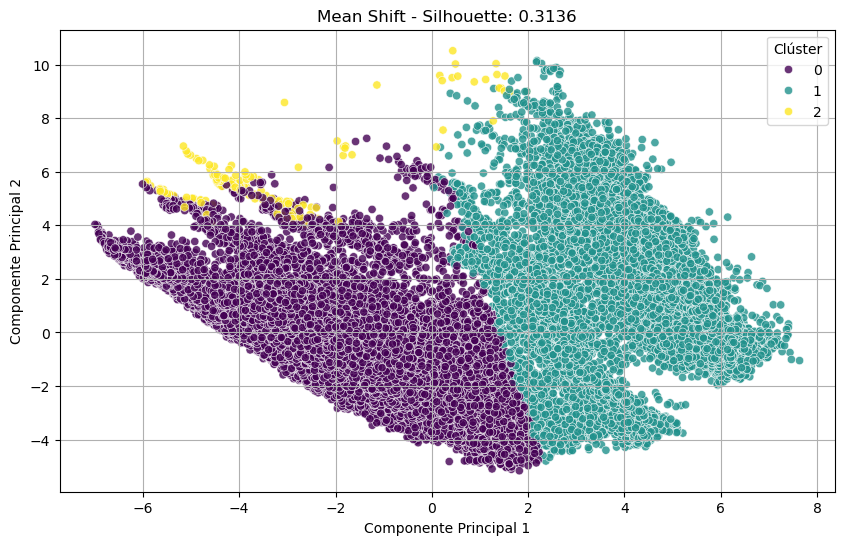

⏳ Tiempo de ejecución: 18 minutos y 1.92 segundos


In [33]:
#Mean Shift
from sklearn.cluster import MeanShift

start_time = time.time()  # Iniciar tiempo

# 📌 Aplicar Mean Shift
mean_shift = MeanShift()
labels_meanshift = mean_shift.fit_predict(X_pca_8d)

# 📌 Calcular Silhouette Score
silhouette_meanshift = silhouette_score(X_pca_8d, labels_meanshift)
print(f"\n📊 **Mean Shift** - Silhouette Score: {silhouette_meanshift:.4f}")

# 📌 Graficar los clústeres obtenidos
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca_2d[:, 0], y=X_pca_2d[:, 1], hue=labels_meanshift, palette="viridis", alpha=0.8)
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.title(f"Mean Shift - Silhouette: {silhouette_meanshift:.4f}")
plt.legend(title="Clúster")
plt.grid()
plt.show()

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")


K=2: Silhouette Score = 0.3803 | ⏳ Tiempo: 28 min 28.15 s
K=3: Silhouette Score = 0.2960 | ⏳ Tiempo: 30 min 4.80 s
K=4: Silhouette Score = 0.2845 | ⏳ Tiempo: 40 min 9.37 s
K=5: Silhouette Score = 0.2817 | ⏳ Tiempo: 42 min 46.70 s

✅ Mejor número de clústeres: K=2 con Silhouette Score = 0.3803


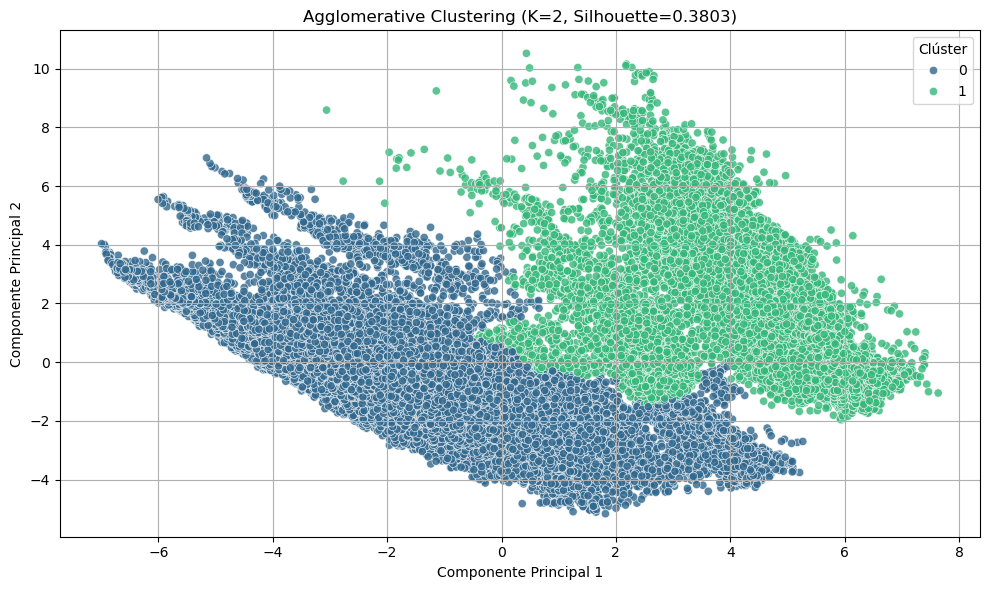

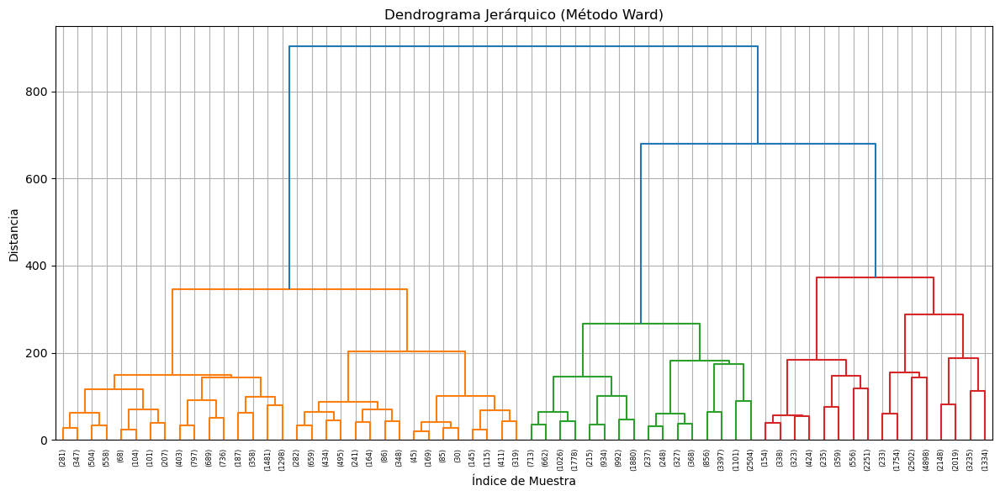


📊 Resumen de resultados:
 - K=2: Silhouette Score = 0.3803 | Tiempo = 28 min 28.15 s
 - K=3: Silhouette Score = 0.2960 | Tiempo = 30 min 4.80 s
 - K=4: Silhouette Score = 0.2845 | Tiempo = 40 min 9.37 s
 - K=5: Silhouette Score = 0.2817 | Tiempo = 42 min 46.70 s


In [77]:
# Lista de valores de K a evaluar
k_values = [2, 3, 4, 5]
silhouette_scores = {}
execution_times = {}
best_score = -1
best_k = None
best_labels = None

# Evaluar Agglomerative Clustering para cada K
for k in k_values:
    start_k = time.time()  # ⏱️ Iniciar tiempo para este K
    clustering = AgglomerativeClustering(n_clusters=k)
    labels = clustering.fit_predict(X_pca_8d)
    score = silhouette_score(X_pca_8d, labels)
    end_k = time.time()  # ⏱️ Fin de tiempo para este K

    elapsed_k = end_k - start_k
    minutes, seconds = divmod(elapsed_k, 60)

    silhouette_scores[k] = score
    execution_times[k] = elapsed_k
    print(f"K={k}: Silhouette Score = {score:.4f} | ⏳ Tiempo: {int(minutes)} min {seconds:.2f} s")

    if score > best_score:
        best_score = score
        best_k = k
        best_labels = labels

# 📌 Mejor K según Silhouette Score
print(f"\n✅ Mejor número de clústeres: K={best_k} con Silhouette Score = {best_score:.4f}")

# 📊 Visualización del clustering con mejor K en 2D
best_model = AgglomerativeClustering(n_clusters=best_k)
best_labels_2d = best_model.fit_predict(X_pca_2d)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca_2d[:, 0], y=X_pca_2d[:, 1], hue=best_labels_2d,
                palette="viridis", alpha=0.8)
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.title(f"Agglomerative Clustering (K={best_k}, Silhouette={best_score:.4f})")
plt.legend(title="Clúster")
plt.grid()
plt.tight_layout()
plt.show()

# 🌳 Dendrograma jerárquico usando 'ward'
plt.figure(figsize=(12, 6))
linked = linkage(X_pca_8d, method="ward")
dendrogram(linked, truncate_mode="level", p=5)
plt.xlabel("Índice de Muestra")
plt.ylabel("Distancia")
plt.title("Dendrograma Jerárquico (Método Ward)")
plt.grid()
plt.tight_layout()
plt.show()

# 📋 Mostrar resumen final
print("\n📊 Resumen de resultados:")
for k in k_values:
    k_minutes, k_seconds = divmod(execution_times[k], 60)
    print(f" - K={k}: Silhouette Score = {silhouette_scores[k]:.4f} | Tiempo = {int(k_minutes)} min {k_seconds:.2f} s")

El mejor resultado obtenido fue con KMeans (K=3, Silhouette Score = 0.3066), pero el bajo valor indica que los clusters no están bien definidos. Para mejorar la clusterización, se probará con t-SNE para determinar se se logra una mejor clusterización

**Aplicar t-SNE en la reduccion de dimensionalidad**


📊 **Silhouette Score con t-SNE y KMeans**: 0.3843


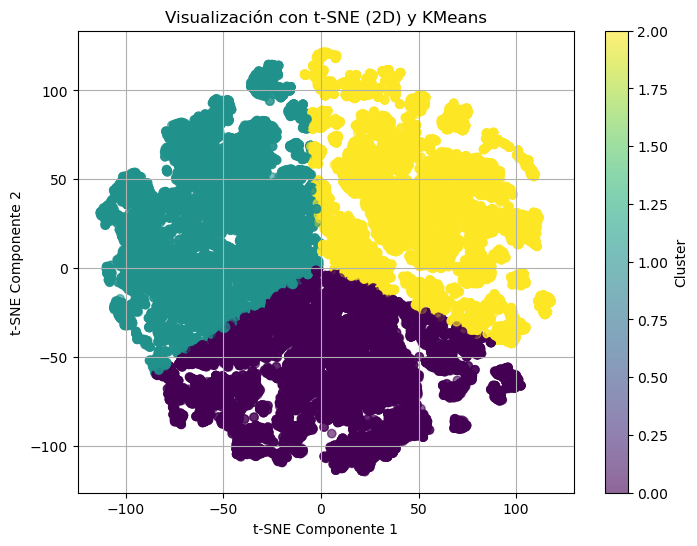

⏳ Tiempo de ejecución: 6 minutos y 38.87 segundos


In [34]:
#t-SNE con 2 componentes principales y visualización de 3 clusters 

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


start_time = time.time()  # Iniciar tiempo

# 📌 Aplicar t-SNE para reducir a 2D
tsne_2d = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne_2d = tsne_2d.fit_transform(X)

# 📌 Aplicar KMeans sobre los datos transformados con t-SNE
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
labels_tsne = kmeans.fit_predict(X_tsne_2d)

# 📌 Evaluar con Silhouette Score
silhouette_tsne = silhouette_score(X_tsne_2d, labels_tsne)
print(f"\n📊 **Silhouette Score con t-SNE y KMeans**: {silhouette_tsne:.4f}")

# 📌 Graficar los datos transformados con t-SNE y colorear por clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne_2d[:, 0], X_tsne_2d[:, 1], c=labels_tsne, cmap="viridis", alpha=0.6)
plt.title("Visualización con t-SNE (2D) y KMeans")
plt.xlabel("t-SNE Componente 1")
plt.ylabel("t-SNE Componente 2")
plt.colorbar(label="Cluster")  # Agregar una barra de colores para identificar los clusters
plt.grid()
plt.show()

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")


Dimensiones de X_tsne_3d: (52148, 3)
Silhouette Score con t-SNE (3D) y KMeans: 0.2888


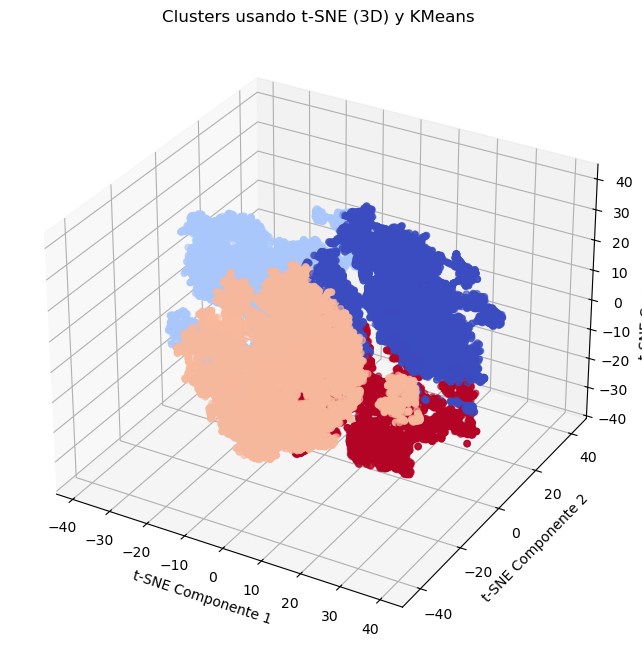

⏳ Tiempo de ejecución: 24 minutos y 20.37 segundos


In [35]:
#t-SNE con 3 componentes principales y visualización de 4 clusters 


start_time = time.time()  # Iniciar tiempo

# Aplicar t-SNE para reducir a 3D
tsne_3d = TSNE(n_components=3, perplexity=30, random_state=42)
X_tsne_3d = tsne_3d.fit_transform(X)

# Verificar la forma de los datos transformados
print("Dimensiones de X_tsne_3d:", X_tsne_3d.shape)

# Aplicar KMeans sobre los datos transformados con t-SNE (3D)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
labels_tsne_3d = kmeans.fit_predict(X_tsne_3d)

# Evaluar con Silhouette Score
silhouette_tsne_3d = silhouette_score(X_tsne_3d, labels_tsne_3d)
print(f"Silhouette Score con t-SNE (3D) y KMeans: {silhouette_tsne_3d:.4f}")

#a partir de aqui se puede poner el coloreo
#OJO BORRAR

# Graficar en 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_tsne_3d[:, 0], X_tsne_3d[:, 1], X_tsne_3d[:, 2], c=labels_tsne_3d, cmap='coolwarm', alpha=0.6)
ax.set_title("Clusters usando t-SNE (3D) y KMeans")
ax.set_xlabel("t-SNE Componente 1")
ax.set_ylabel("t-SNE Componente 2")
ax.set_zlabel("t-SNE Componente 3")
plt.show()

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

Dimensiones de X_tsne_3d: (52148, 3)
Silhouette Score con t-SNE (3D) y KMeans: 0.2718


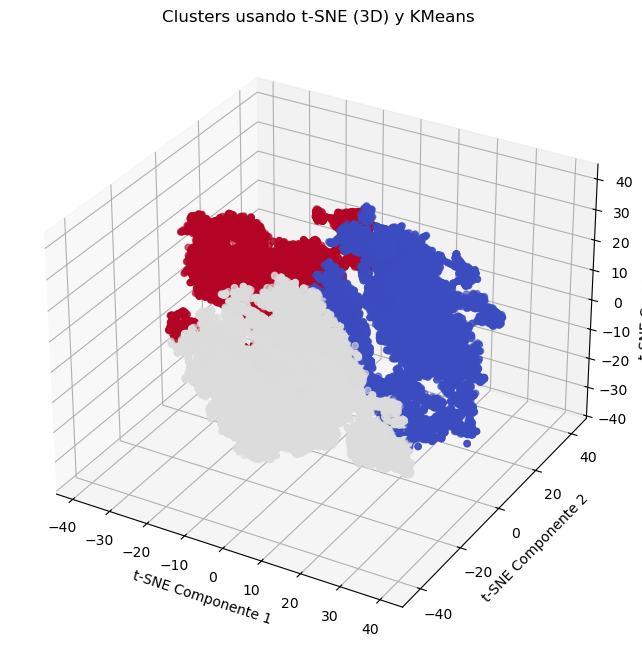

⏳ Tiempo de ejecución: 24 minutos y 13.83 segundos


In [36]:
#t-SNE con 3 componentes principales y visualización de 3 clusters 


start_time = time.time()  # Iniciar tiempo

# Aplicar t-SNE para reducir a 3D
tsne_3d = TSNE(n_components=3, perplexity=30, random_state=42)
X_tsne_3d = tsne_3d.fit_transform(X)

# Verificar la forma de los datos transformados
print("Dimensiones de X_tsne_3d:", X_tsne_3d.shape)

# Aplicar KMeans sobre los datos transformados con t-SNE (3D)
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
labels_tsne_3d = kmeans.fit_predict(X_tsne_3d)

# Evaluar con Silhouette Score
silhouette_tsne_3d = silhouette_score(X_tsne_3d, labels_tsne_3d)
print(f"Silhouette Score con t-SNE (3D) y KMeans: {silhouette_tsne_3d:.4f}")

#a partir de aqui se puede poner el coloreo
#OJO BORRAR

# Graficar en 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_tsne_3d[:, 0], X_tsne_3d[:, 1], X_tsne_3d[:, 2], c=labels_tsne_3d, cmap='coolwarm', alpha=0.6)
ax.set_title("Clusters usando t-SNE (3D) y KMeans")
ax.set_xlabel("t-SNE Componente 1")
ax.set_ylabel("t-SNE Componente 2")
ax.set_zlabel("t-SNE Componente 3")
plt.show()

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

# ***T-sne con gridseachcv***


In [ ]:
#Fuente: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html


start_time = time.time()  # Iniciar tiempo

# Definir los valores a probar en GridSearch. Se realiza la prueba con 648 modelos diferentes
param_grid = {
    "perplexity": [40,50,60],
    "early_exaggeration": [2, 5, 10],
    "learning_rate": [5, 10, 50,100],
    "init": ["pca", "random"],
    "angle": [0.1, 0.2, 0.3],
    "k": [3, 4]  # Número de clusters para KMeans
}

# Generar todas las combinaciones de parámetros
grid = list(ParameterGrid(param_grid))

# Variables para almacenar la mejor configuración
best_silhouette = -1
best_params = None
best_labels = None
best_X_tsne = None

# Iterar sobre todas las combinaciones de hiperparámetros
for params in grid:
    try:
        # Aplicar t-SNE con los parámetros actuales
        tsne = TSNE(
            n_components=3,
            perplexity=params["perplexity"],
            early_exaggeration=params["early_exaggeration"],
            learning_rate=params["learning_rate"],
            init=params["init"],
            angle=params["angle"],
            random_state=42
        )
        X_tsne = tsne.fit_transform(X)  # Transformar los datos

        # Aplicar KMeans sobre los datos transformados con t-SNE
        kmeans = KMeans(n_clusters=params["k"], random_state=42, n_init=10)
        labels = kmeans.fit_predict(X_tsne)

        # Calcular el Silhouette Score
        silhouette = silhouette_score(X_tsne, labels)

        # Guardar la mejor combinación de parámetros
        if silhouette > best_silhouette:
            best_silhouette = silhouette
            best_params = params
            best_labels = labels
            best_X_tsne = X_tsne

    except Exception as e:
        print(f"Error con los parámetros {params}: {e}")

# Mostrar los mejores parámetros y el mejor Silhouette Score
print(f"\n📊 Mejor combinación de parámetros:")
print(best_params)
print(f"Silhouette Score: {best_silhouette:.4f}")

# Graficar la mejor clusterización en 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(best_X_tsne[:, 0], best_X_tsne[:, 1], best_X_tsne[:, 2], c=best_labels, cmap='coolwarm', alpha=0.6)
ax.set_title(f"Mejor Clusterización con t-SNE y KMeans (Silhouette: {best_silhouette:.4f})")
ax.set_xlabel("t-SNE Componente 1")
ax.set_ylabel("t-SNE Componente 2")
ax.set_zlabel("t-SNE Componente 3")
plt.show()

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

✅ Mejor combinación de parámetros:
{'angle': 0.2, 'early_exaggeration': 5, 'init': 'pca', 'k': 3, 'learning_rate': 10, 'perplexity': 50}
Silhouette Score: 0.3837

El modelo obtenido con Silhouette Score de 0.3837 es el mejor hasta ahora, indicando una separación de clusters moderada. La configuración óptima utiliza k=3, learning_rate=10, perplexity=50, early_exaggeration=5 e init='pca', lo que sugiere que una tasa de aprendizaje baja y una menor exageración inicial han estabilizado el clustering. Aunque es superior a otros modelos evaluados, el resultado sigue en un rango medio de calidad,


📊 Parámetros evaluados:
{'perplexity': 50, 'early_exaggeration': 5, 'learning_rate': 10, 'init': 'pca', 'angle': 0.2, 'k': 3}
Silhouette Score: 0.3837


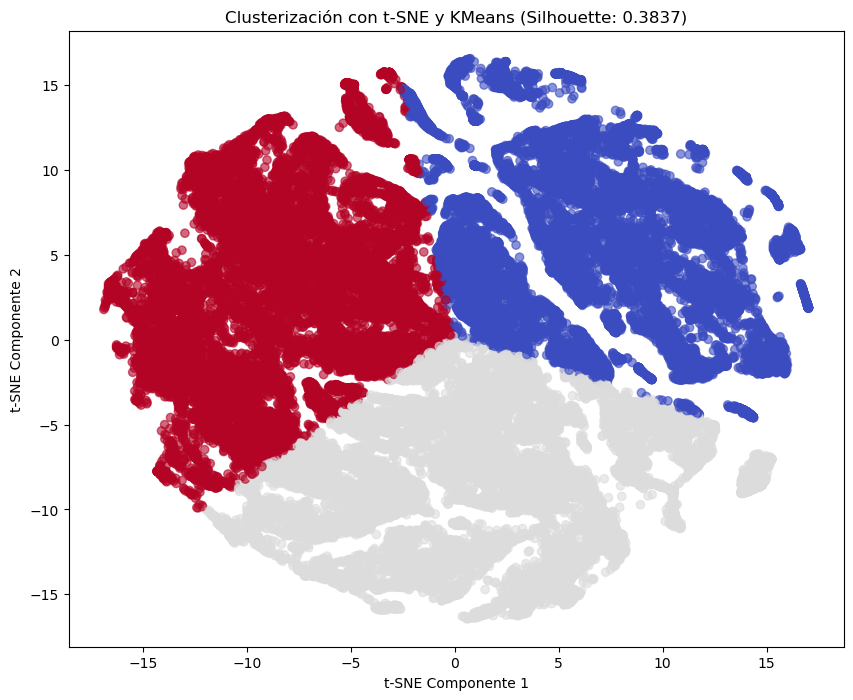

⏳ Tiempo de ejecución: 23 minutos y 38.58 segundos


In [73]:
# Iniciar tiempo
start_time = time.time()

# Parámetros fijos
params = {
    "perplexity": 50,
    "early_exaggeration": 5,
    "learning_rate": 10,
    "init": "pca",
    "angle": 0.2,
    "k": 3
}

try:
    # Aplicar t-SNE con los parámetros definidos
    tsne = TSNE(
        n_components=2,
        perplexity=params["perplexity"],
        early_exaggeration=params["early_exaggeration"],
        learning_rate=params["learning_rate"],
        init=params["init"],
        angle=params["angle"],
        random_state=42
    )
    X_tsne = tsne.fit_transform(X)  # Transformar los datos

    # Aplicar KMeans sobre los datos transformados con t-SNE
    kmeans = KMeans(n_clusters=params["k"], random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_tsne)

    # Calcular el Silhouette Score
    silhouette = silhouette_score(X_tsne, labels)

    # Mostrar resultados
    print(f"\n📊 Parámetros evaluados:")
    print(params)
    print(f"Silhouette Score: {silhouette:.4f}")

    # Graficar la clusterización
    plt.figure(figsize=(10, 8))
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='coolwarm', alpha=0.6)
    plt.title(f"Clusterización con t-SNE y KMeans (Silhouette: {silhouette:.4f})")
    plt.xlabel("t-SNE Componente 1")
    plt.ylabel("t-SNE Componente 2")
    plt.show()

except Exception as e:
    print(f"Error al procesar los parámetros {params}: {e}")

# Calcular tiempo de ejecución
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

# **Análisis de la variable cluster_type_id y su relevancia en la producción de energía o en el mantenimiento predictivo**

El análisis de la variable cluster_type_id es crucial para comprender su influencia en la operación del generador eólico. Actualmente, se desconoce si esta variable está relacionada con la producción de energía, representa estados específicos de operación (como mantenimiento, parada o producción) o si está influenciada por factores externos. Dado que el proceso de clusterización basado en t-SNE ha identificado una segmentación moderadamente definida con un Silhouette Score de 0.4100, es conveniente evaluar si cluster_type_id puede aportar información relevante para mejorar la clasificación y predicción del comportamiento del generador. Para ello, se analizará su distribución, su relación con otras variables clave y su impacto en los patrones de producción de energía. Este estudio permitirá determinar si cluster_type_id puede utilizarse como una variable explicativa en modelos de predicción o si requiere una redefinición de su significado en función de los patrones operativos identificados.

Valores únicos de 'status_type_id': [0 5 3]

Frecuencia de cada valor:
status_type_id
0    39149
3      864
5    12135
Name: count, dtype: int64


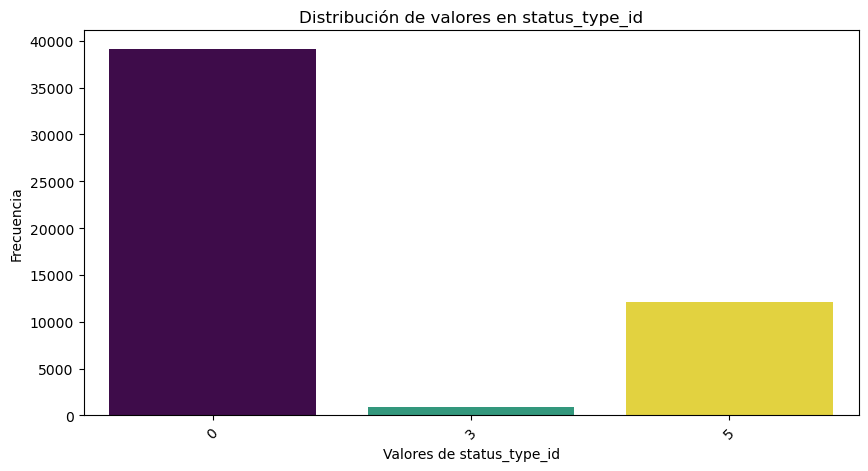

In [19]:
# 📌 Copiar el dataset original para evitar modificaciones directas
df = train.copy()

# 📌 Analizar valores únicos de 'status_type_id'
valores_unicos = df['status_type_id'].unique()
conteo_valores = df['status_type_id'].value_counts().sort_index()

# 📌 Mostrar los valores únicos y su frecuencia
print("Valores únicos de 'status_type_id':", valores_unicos)
print("\nFrecuencia de cada valor:")
print(conteo_valores)

# 📌 Visualización de la distribución de 'status_type_id'
plt.figure(figsize=(10,5))
sns.barplot(x=conteo_valores.index, y=conteo_valores.values, hue=conteo_valores.index, palette="viridis", legend=False)
plt.xlabel("Valores de status_type_id")
plt.ylabel("Frecuencia")
plt.title("Distribución de valores en status_type_id")
plt.xticks(rotation=45)
plt.show()


# **Relación entre status_type_id y la producción de energía**

La variable status_type_id presenta tres categorías distintas (0, 3 y 5) con una distribución desigual, lo que sugiere que puede estar relacionada con diferentes estados operativos del generador eólico. Sin embargo, para confirmar su impacto en la generación de energía, es necesario realizar un análisis detallado de su correlación con sensor_50, que representa la producción energética. Si existe una relación clara entre ciertos valores de status_type_id y caídas en la generación, esta variable podría utilizarse como un indicador clave para el mantenimiento predictivo y la identificación de fallas en las turbinas.

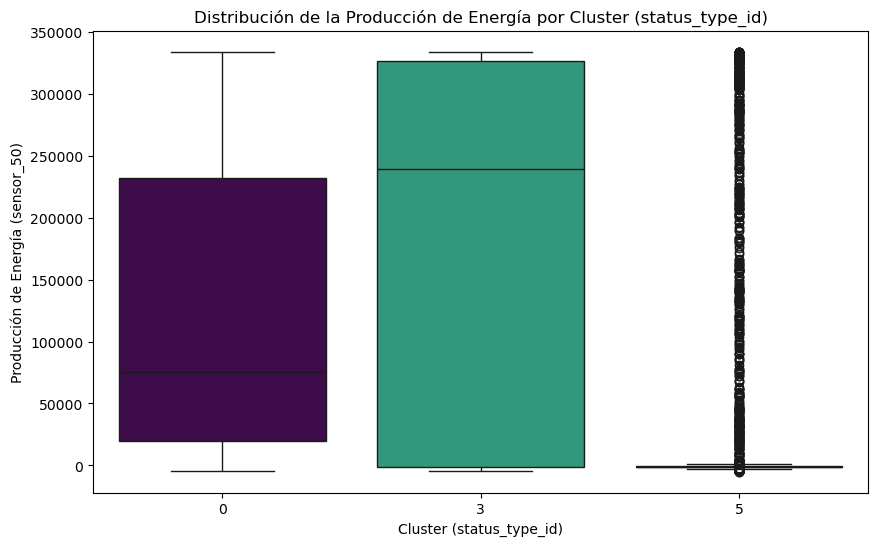

,count,mean,std,min,25%,50%,75%,max
status_type_id,,,,,,,,
0,39149.0,124311.383560,120322.373265,-4818.0,19506.00,75674.0,232020.0,334355.0
3,864.0,187882.466435,138863.555944,-4659.0,-985.75,239134.5,326640.5,333831.0
5,12135.0,10560.410218,55265.150103,-5027.0,-1537.00,-932.0,-565.0,333819.0


In [20]:
# 1️⃣ Cargar los datos
df = train.copy()  

    
# 2️⃣ Graficar los clusters en función de la producción de energía
plt.figure(figsize=(10, 6))
sns.boxplot(x="status_type_id", y="sensor_50", data=df, hue="status_type_id", palette="viridis", legend=False)

# 3️⃣ Etiquetas de la gráfica
plt.xlabel("Cluster (status_type_id)")
plt.ylabel("Producción de Energía (sensor_50)")
plt.title("Distribución de la Producción de Energía por Cluster (status_type_id)")
plt.show()

df.groupby("status_type_id")["sensor_50"].mean().sort_values(ascending=False)
df.groupby("status_type_id")["sensor_50"].describe()


El análisis de la producción de energía (sensor_50) en función de status_type_id sugiere que existen **tres clusters** claramente diferenciados: El clúster más productivo es **status_type_id = 3**, con una media de 187.882 kW, aunque representa una minoría en la muestra (864 registros). El clúster parcialmente productivo o en transición es **status_type_id = 0**, con una producción media de 124.311 kW y una alta variabilidad, abarcando la mayoría de los datos (39,149 registros), lo que indica que incluye turbinas operativas y en transición. Finalmente, el clúster no productivo es **status_type_id = 5**, con una media de 10.560 kW y valores mayormente negativos, lo que sugiere turbinas apagadas, en mantenimiento o con fallas operativas. La gran cantidad de datos en status_type_id = 0 requiere un análisis más detallado para identificar posibles subcategorías dentro de este grupo, ya que, podría estar asociado a períodos de mantenimiento o fallas en los aerogeneradores. Esta información es clave para analizar el rendimiento del parque eólico y tomar decisiones estratégicas sobre su operación.

En el análisis de datos para la predicción del estado operativo de un aerogenerador, es esencial explorar la relación entre la velocidad del viento y la producción de energía, ya que estas variables pueden ser determinantes para clasificar el estado del generador. El siguiente código permite visualizar mediante un diagrama de dispersión cómo varía la generación de energía (sensor_50) en función de la velocidad del viento (wind_speed_3_avg), distinguiendo los diferentes estados operativos del generador a través de la variable status_type_id. Esta representación gráfica es clave para identificar patrones que podrían ayudar a predecir las distintas clases presentes en los datos, revelando cómo las condiciones del viento influyen en el comportamiento del generador. De esta manera, se pueden detectar estados anómalos o transiciones críticas que podrían indicar fallos inminentes, disminución de rendimiento o necesidad de mantenimiento. Este análisis es un primer paso hacia la construcción de modelos de clasificación que permitan anticipar el estado del generador y optimizar su operación en función de las condiciones ambientales.

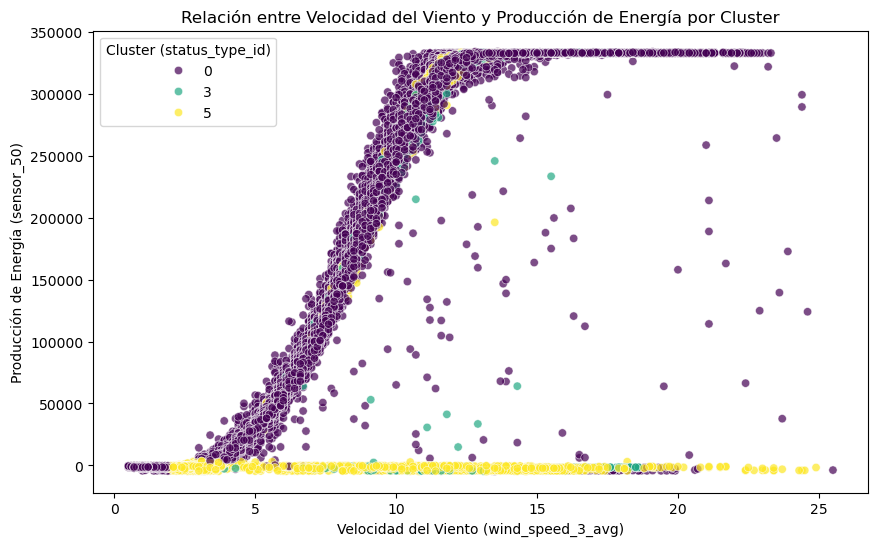

In [21]:
# 1️⃣ Cargar los datos
df = train.copy()

# 2️⃣ Graficar la relación entre velocidad del viento y producción de energía por cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df["wind_speed_3_avg"], y=df["sensor_50"], hue=df["status_type_id"], palette="viridis", alpha=0.7)

# 3️⃣ Etiquetas y título
plt.xlabel("Velocidad del Viento (wind_speed_3_avg)")
plt.ylabel("Producción de Energía (sensor_50)")
plt.title("Relación entre Velocidad del Viento y Producción de Energía por Cluster")
plt.legend(title="Cluster (status_type_id)")

# 4️⃣ Mostrar gráfico
plt.show()

La imagen muestra la relación entre la velocidad del viento (wind_speed_3_avg) y la producción de energía (sensor_50), segmentada en tres grupos de status_type_id (0, 3 y 5). Se observa que el cluster 0 (puntos morados) representa la mayor producción de energía y sigue una tendencia típica de generación eólica, donde la producción aumenta con la velocidad del viento hasta alcanzar un límite de saturación alrededor de 10-12 m/s. El cluster 3 (puntos verdes) también presenta una relación similar, pero con menor representatividad, lo que podría indicar un estado de operación específico o con restricciones. El cluster 5 (puntos amarillos), en cambio, se mantiene mayormente en valores cercanos a cero, lo que sugiere estados de baja o nula producción, posiblemente asociados con periodos de mantenimiento, fallo o baja disponibilidad operativa. Sin embargo, la presencia de algunos puntos dispersos con valores máximos de producción en este grupo indica que status_type_id = 5 no representa exclusivamente un estado inactivo, sino que puede abarcar momentos transitorios o anomalías en el registro de datos. Esto refuerza la necesidad de un análisis más detallado para comprender mejor la clasificación operativa del generador y su impacto en la producción de energía.

# **Separar el dataset para el análisis**

Separar el dataset en dos grupos (**productivo** e **improductivo**) es conveniente para mejorar la precisión del modelo predictivo de producción de energía eólica. Los datos del cluster improductivo (5) pueden corresponder a periodos de inactividad, mantenimiento o condiciones de viento insuficientes, lo que introduciría ruido en el entrenamiento del modelo si se mezclan con los clusters productivos (0 y 3). Al segmentar los datos, se puede entrenar un modelo específico para predecir la producción de energía en condiciones operativas normales y otro para analizar los factores que llevan a la no generación. Además, el **cluster improductivo** puede ser **útil para desarrollar un modelo de mantenimiento predictivo**, permitiendo identificar patrones en los datos que indiquen cuándo un generador en máxima producción podría entrar en estado de inactividad a pesar de que las condiciones de viento sean favorables. Esto facilitaría la detección temprana de fallos o necesidades de mantenimiento, optimizando la disponibilidad operativa de los aerogeneradores.

In [23]:
#Separación del dataset original en productivo e improductivo

df=train.copy()

# Obtener los dos clusters con mayor producción de energía
top_clusters = df.groupby("status_type_id")["sensor_50"].mean().nlargest(2).index

# Filtrar el dataset para incluir solo esos dos clusters
cluster_productivo = df[df["status_type_id"].isin(top_clusters)]

#Filtrar el dataset improductivo
# Obtener el cluster con menor producción de energía
cluster_improductivo = df[df["status_type_id"] == df.groupby("status_type_id")["sensor_50"].mean().idxmin()]

In [24]:
print("Los clusteres productivo son: ",cluster_productivo["status_type_id"].unique())  # Ver los clusters productivos seleccionados
print("El cluster improductivo es: ",cluster_improductivo["status_type_id"].unique())  # Ver el cluster improductivo seleccionado

Los clusteres productivo son:  [0 3]
El cluster improductivo es:  [5]


# **Clusterizacion de ambos datasets 

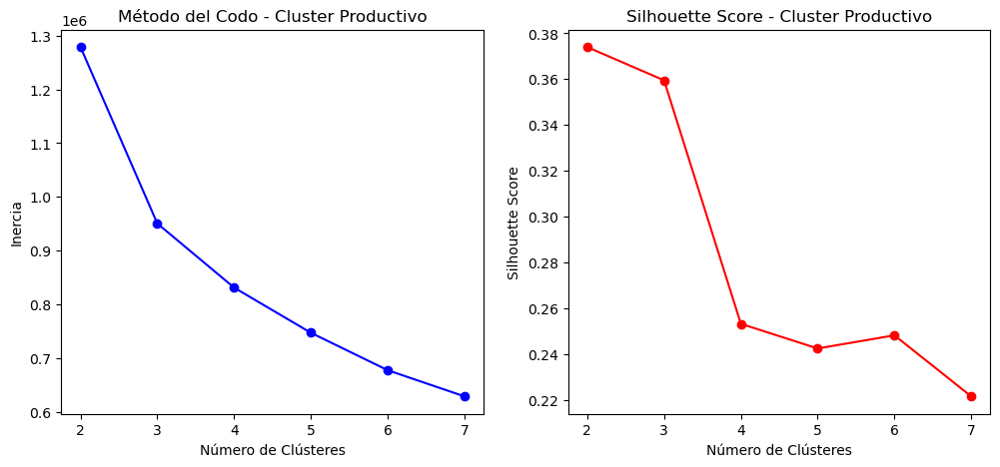

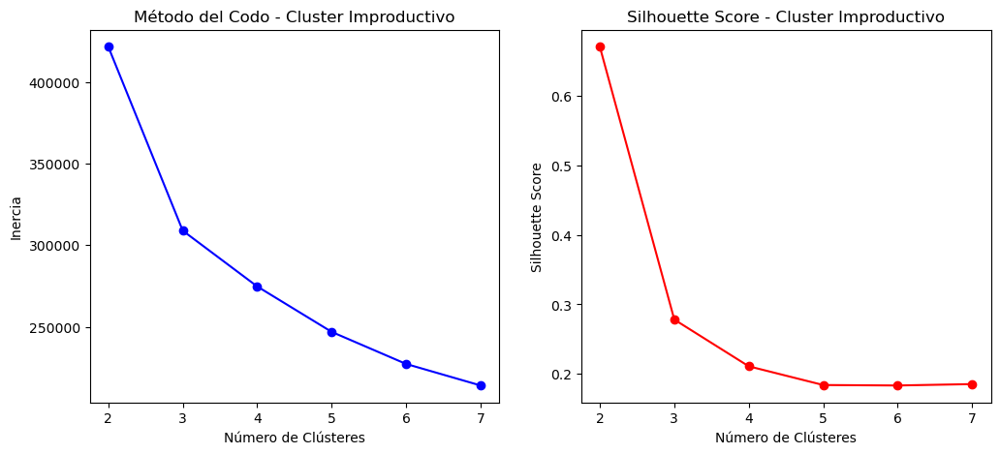

⏳ Tiempo de ejecución: 2 minutos y 47.45 segundos


In [61]:
# 📌 Función para analizar el número óptimo de clústeres

start_time = time.time()  # Iniciar tiempo

def analizar_clusters(df, nombre_cluster):
    # 📌 Seleccionar solo las características numéricas excluyendo columnas no relevantes
    features = df.drop(columns=["time_stamp", "status_type_id", "train_test"], errors="ignore")  
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    # 📌 Método del codo para encontrar el número óptimo de clústeres
    inertia = []
    silhouette_scores = []
    K_range = range(2, 8)  # Evaluamos desde 2 hasta 8 clústeres

    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=5)
        kmeans.fit(features_scaled)
        inertia.append(kmeans.inertia_)  # Suma de los errores cuadráticos
        silhouette_scores.append(silhouette_score(features_scaled, kmeans.labels_))  

    # 📌 Gráficos de evaluación de clústeres
    plt.figure(figsize=(12, 5))

    # 📌 Gráfico del Método del Codo
    plt.subplot(1, 2, 1)
    plt.plot(K_range, inertia, marker='o', linestyle='-', color='b')
    plt.xlabel('Número de Clústeres')
    plt.ylabel('Inercia')
    plt.title(f'Método del Codo - {nombre_cluster}')

    # 📌 Gráfico del Silhouette Score
    plt.subplot(1, 2, 2)
    plt.plot(K_range, silhouette_scores, marker='o', linestyle='-', color='r')
    plt.xlabel('Número de Clústeres')
    plt.ylabel('Silhouette Score')
    plt.title(f'Silhouette Score - {nombre_cluster}')

    plt.show()

# 📌 Aplicar análisis a cada dataset
analizar_clusters(cluster_productivo, "Cluster Productivo")
analizar_clusters(cluster_improductivo, "Cluster Improductivo")

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

Para el Cluster Productivo, el método del codo sugiere que el mejor número de clústeres podría ser K=3, ya que a partir de este punto la reducción de la inercia comienza a estabilizarse. Además, dado que el Silhouette Score cae abruptamente después de K=3, la mejor opción parece ser K=3, ya que equilibra una segmentación clara y una reducción eficiente de la inercia.

Para el Cluster Improductivo, el método del codo también muestra que la reducción de la inercia comienza a estabilizarse en K=3, lo que indicaría un punto adecuado para segmentación. Sin embargo, el Silhouette Score es máximo en K=2, y decrece drásticamente con valores superiores, lo que sugiere que la estructura de los clústeres es más clara en esta opción de K=2. 


🔍 Evaluando: Cluster Productivo con K = 4
📊 Variabilidad explicada por PCA:
- Componente Principal 1: 59.62%
- Componente Principal 2: 12.03%
- Componente Principal 3: 9.08%
- Componente Principal 4: 3.77%
- Componente Principal 5: 2.75%
- Componente Principal 6: 2.01%
- Componente Principal 7: 1.83%
- Componente Principal 8: 1.80%
- Variabilidad total explicada: 92.90%
📈 Silhouette Score: 0.2532



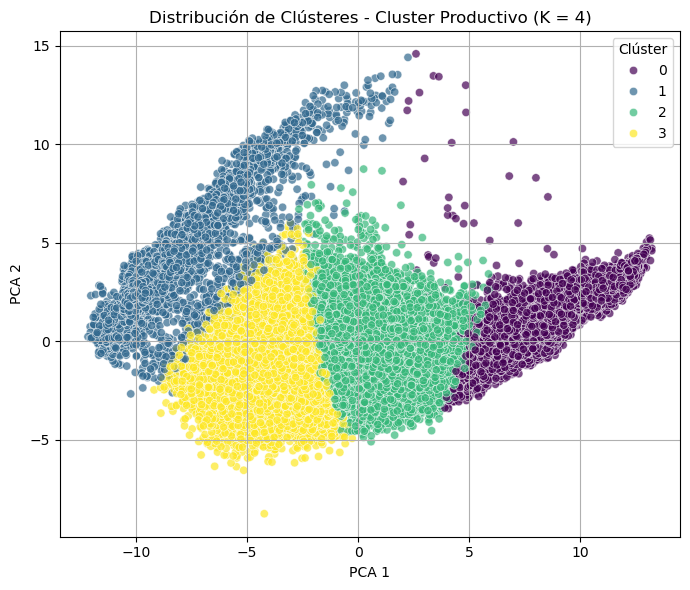


🔍 Evaluando: Cluster Productivo con K = 3
📊 Variabilidad explicada por PCA:
- Componente Principal 1: 59.62%
- Componente Principal 2: 12.03%
- Componente Principal 3: 9.08%
- Componente Principal 4: 3.77%
- Componente Principal 5: 2.75%
- Componente Principal 6: 2.01%
- Componente Principal 7: 1.83%
- Componente Principal 8: 1.80%
- Variabilidad total explicada: 92.90%
📈 Silhouette Score: 0.3595



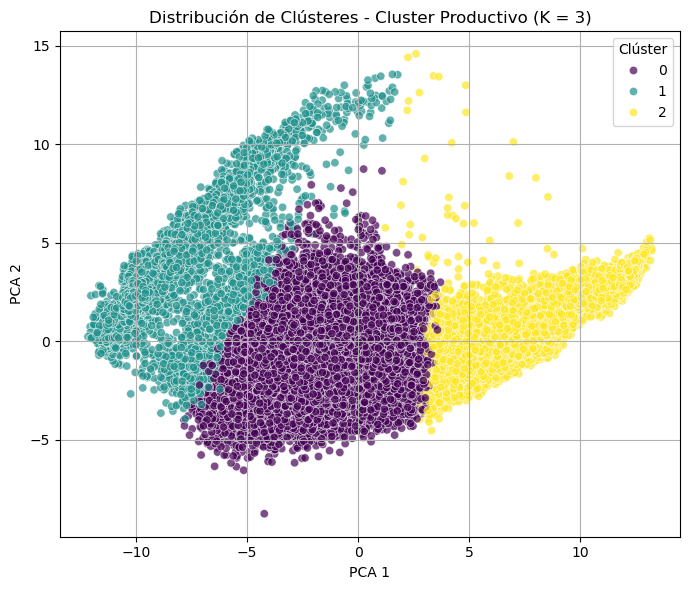


🔍 Evaluando: Cluster Productivo con K = 2
📊 Variabilidad explicada por PCA:
- Componente Principal 1: 59.62%
- Componente Principal 2: 12.03%
- Componente Principal 3: 9.08%
- Componente Principal 4: 3.77%
- Componente Principal 5: 2.75%
- Componente Principal 6: 2.01%
- Componente Principal 7: 1.83%
- Componente Principal 8: 1.80%
- Variabilidad total explicada: 92.90%
📈 Silhouette Score: 0.3742



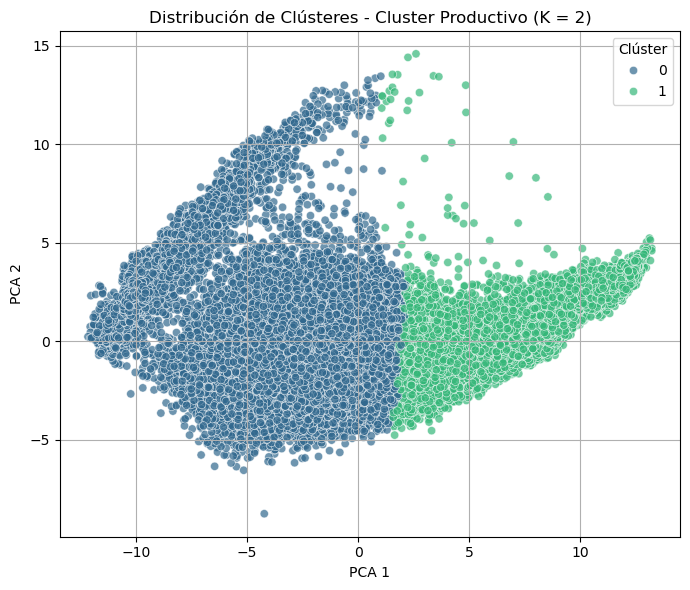


🔍 Evaluando: Cluster Improductivo con K = 2
📊 Variabilidad explicada por PCA:
- Componente Principal 1: 52.50%
- Componente Principal 2: 14.08%
- Componente Principal 3: 8.37%
- Componente Principal 4: 4.45%
- Componente Principal 5: 3.83%
- Componente Principal 6: 2.66%
- Componente Principal 7: 2.17%
- Componente Principal 8: 1.98%
- Variabilidad total explicada: 90.04%
📈 Silhouette Score: 0.6702



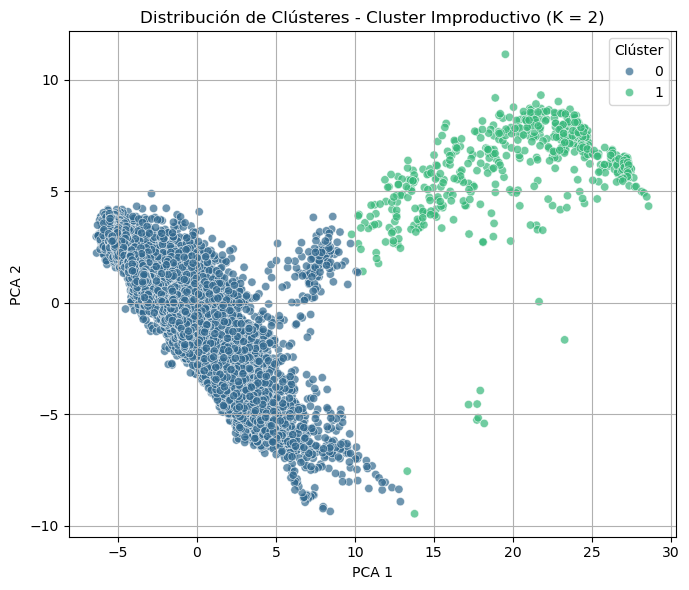


🔍 Evaluando: Cluster Improductivo con K = 3
📊 Variabilidad explicada por PCA:
- Componente Principal 1: 52.50%
- Componente Principal 2: 14.08%
- Componente Principal 3: 8.37%
- Componente Principal 4: 4.45%
- Componente Principal 5: 3.83%
- Componente Principal 6: 2.66%
- Componente Principal 7: 2.17%
- Componente Principal 8: 1.98%
- Variabilidad total explicada: 90.04%
📈 Silhouette Score: 0.2782



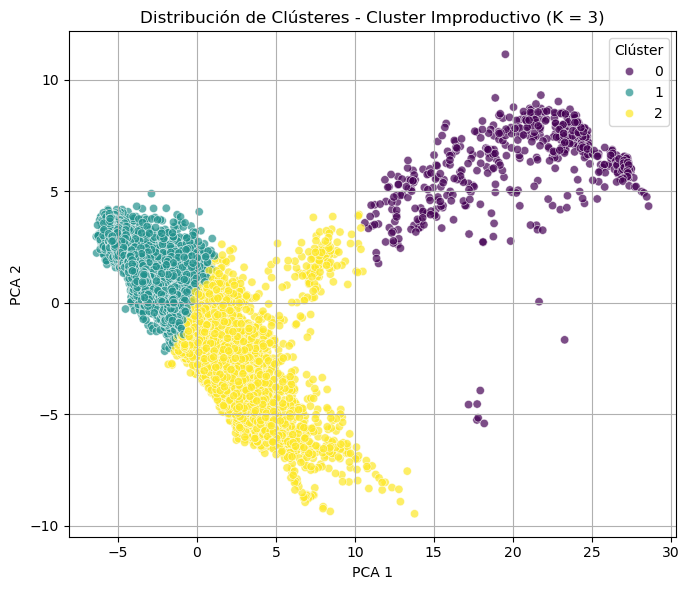

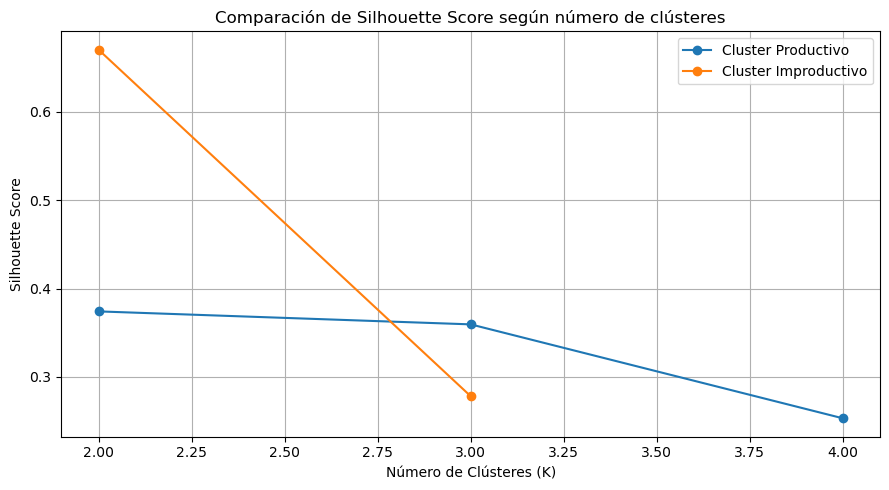


⏳ Tiempo total de ejecución: 1 minutos y 25.80 segundos


In [84]:
# 📌 Evaluación de los clusters con diferentes K y graficar el Silhouette Scores

# ⏳ Iniciar temporizador
start_time = time.time()

# 📦 Lista para almacenar resultados de cada modelo
resultados_kmeans = []

# 📌 Función para aplicar K-Means y visualizar resultados + métrica de precisión
def aplicar_kmeans(df, nombre_cluster, n_clusters):
    print(f"\n🔍 Evaluando: {nombre_cluster} con K = {n_clusters}")

    # Seleccionar características numéricas (excluyendo campos no relevantes)
    features = df.drop(columns=["time_stamp", "status_type_id"], errors="ignore")

    # Normalizar (escalar) los datos
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    # PCA para reducción de dimensionalidad
    pca = PCA(n_components=min(8, features.shape[1]), random_state=42)
    pca_features = pca.fit_transform(features_scaled)

    # Variabilidad explicada por PCA
    explained_variance = pca.explained_variance_ratio_
    total_explained_variance = np.sum(explained_variance)

    print(f"📊 Variabilidad explicada por PCA:")
    for i, var in enumerate(explained_variance[:8]):
        print(f"- Componente Principal {i+1}: {var * 100:.2f}%")
    print(f"- Variabilidad total explicada: {total_explained_variance * 100:.2f}%")

    # DataFrame con las 2 primeras componentes principales para visualización
    pca_df = pd.DataFrame(pca_features[:, :2], columns=["pca_1", "pca_2"])
    df = df.reset_index(drop=True)
    df = pd.concat([df, pca_df], axis=1)

    # Aplicar K-Means sobre los datos escalados
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    df["cluster_kmeans"] = kmeans.fit_predict(features_scaled)

    # 📈 Calcular Silhouette Score
    score = silhouette_score(features_scaled, df["cluster_kmeans"])
    print(f"📈 Silhouette Score: {score:.4f}\n")

    # Guardar resultado para la gráfica final
    resultados_kmeans.append({
        "Grupo": nombre_cluster,
        "K": n_clusters,
        "Silhouette_Score": score
    })

    # Visualización de los clústeres
    plt.figure(figsize=(7, 6))
    sns.scatterplot(data=df, x="pca_1", y="pca_2", hue="cluster_kmeans", palette="viridis", alpha=0.7)
    plt.title(f"Distribución de Clústeres - {nombre_cluster} (K = {n_clusters})")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.legend(title="Clúster")
    plt.grid()
    plt.tight_layout()
    plt.show()

# 📌 Aplicar K-Means con distintos valores de K
aplicar_kmeans(cluster_productivo, "Cluster Productivo", n_clusters=4)
aplicar_kmeans(cluster_productivo, "Cluster Productivo", n_clusters=3)
aplicar_kmeans(cluster_productivo, "Cluster Productivo", n_clusters=2)

aplicar_kmeans(cluster_improductivo, "Cluster Improductivo", n_clusters=2)
aplicar_kmeans(cluster_improductivo, "Cluster Improductivo", n_clusters=3)

# ✅ Convertir resultados en DataFrame
df_resultados = pd.DataFrame(resultados_kmeans)

# 📊 Gráfica comparativa de Silhouette Scores
plt.figure(figsize=(9, 5))
for grupo in df_resultados['Grupo'].unique():
    datos = df_resultados[df_resultados['Grupo'] == grupo]
    plt.plot(datos["K"], datos["Silhouette_Score"], marker='o', label=grupo)

plt.title("Comparación de Silhouette Score según número de clústeres")
plt.xlabel("Número de Clústeres (K)")
plt.ylabel("Silhouette Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ⏱️ Medir tiempo de ejecución
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"\n⏳ Tiempo total de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

El análisis de la segmentación mediante K-Means sugiere que el conjunto de datos correspondiente al estado productivo del generador podría dividirse en dos o tres clústeres distintos, lo cual se observa en la distribución de los puntos en el espacio reducido por PCA. Sin embargo, debido al bajo Silhouette Score obtenido en las evaluaciones previas, esta segmentación no puede considerarse completamente fiable, ya que los clústeres podrían no estar claramente diferenciados y existir cierto solapamiento entre ellos. En contraste, el análisis del estado improductivo muestra una estructura más definida con dos clústeres diferenciados, lo que indica que esta segmentación es más representativa de la distribución real de los datos. Además, la mayor precisión obtenida en la métrica de Silhouette Score refuerza la validez de esta clasificación, sugiriendo que las condiciones de inactividad del generador pueden categorizarse de manera más clara en dos grupos distintos.


🔹 Seleccionando características para predecir Estado del Generador

✅ Estado del Generador - Mejores características (RFE):
  - sensor_0_avg: Temperatura ambiente (°C)
  - wind_speed_3_avg: Velocidad media del viento (m/s)
  - sensor_6_avg: Temp. en el controlador del buje (°C)
  - sensor_7_avg: Temp. en parte superior de la góndola (°C)
  - sensor_8_avg: Temp. en bobinas de choque VCS (°C)
  - sensor_13_avg: Temp. cojinete 2 generador (°C)
  - sensor_41_avg: Temperatura del aceite del grupo hidráulico (°C)
  - sensor_42_avg: Dirección de la góndola (°)
  - sensor_50: Potencia activa total (Wh)
  - temperatura_promedio_transformador: Descripción no disponible


100%|===================| 52035/52148 [02:52<00:00]        


✅ Estado del Generador - Mejores características (SHAP):
  - sensor_50: Potencia activa total (Wh)
  - wind_speed_3_avg: Velocidad media del viento (m/s)
  - sensor_13_avg: Temp. cojinete 2 generador (°C)
  - temperatura_promedio_transformador: Descripción no disponible
  - sensor_43_avg: Temperatura de la góndola (°C)
  - sensor_8_avg: Temp. en bobinas de choque VCS (°C)
  - sensor_0_avg: Temperatura ambiente (°C)
  - sensor_42_avg: Dirección de la góndola (°)
  - sensor_6_avg: Temp. en el controlador del buje (°C)
  - sensor_12_avg: Temp. aceite caja de cambios (°C)


C:\Users\aless\AppData\Local\Temp\ipykernel_25348\796876636.py:62: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




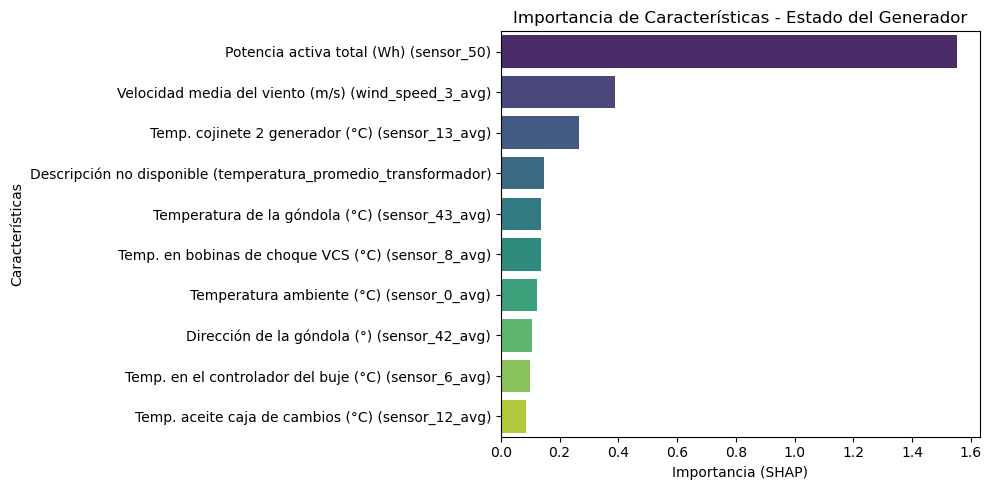


🔹 Seleccionando características para predecir Producción de Energía

✅ Producción de Energía - Mejores características (RFE):
  - sensor_0_avg: Temperatura ambiente (°C)
  - sensor_2_avg: Dirección relativa del viento (°)
  - wind_speed_3_avg: Velocidad media del viento (m/s)
  - sensor_5_avg: Ángulo medio del rotor (°)
  - sensor_6_avg: Temp. en el controlador del buje (°C)
  - sensor_42_avg: Dirección de la góndola (°)
  - sensor_43_avg: Temperatura de la góndola (°C)
  - sensor_48: Pot. reactiva - generador en delta (VArh)
  - sensor_52_avg: RPM promedio del rotor (rpm)
  - temperatura_promedio_transformador: Descripción no disponible


100%|===================| 52066/52148 [04:18<00:00]        


✅ Producción de Energía - Mejores características (SHAP):
  - sensor_52_avg: RPM promedio del rotor (rpm)
  - wind_speed_3_avg: Velocidad media del viento (m/s)
  - sensor_48: Pot. reactiva - generador en delta (VArh)
  - sensor_22_avg: Factor de potencia medio
  - sensor_5_avg: Ángulo medio del rotor (°)
  - sensor_0_avg: Temperatura ambiente (°C)
  - sensor_10_avg: Temp. en el agua de refrigeración VCS (°C)
  - sensor_41_avg: Temperatura del aceite del grupo hidráulico (°C)
  - sensor_8_avg: Temp. en bobinas de choque VCS (°C)
  - temperatura_promedio_transformador: Descripción no disponible


C:\Users\aless\AppData\Local\Temp\ipykernel_25348\796876636.py:62: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




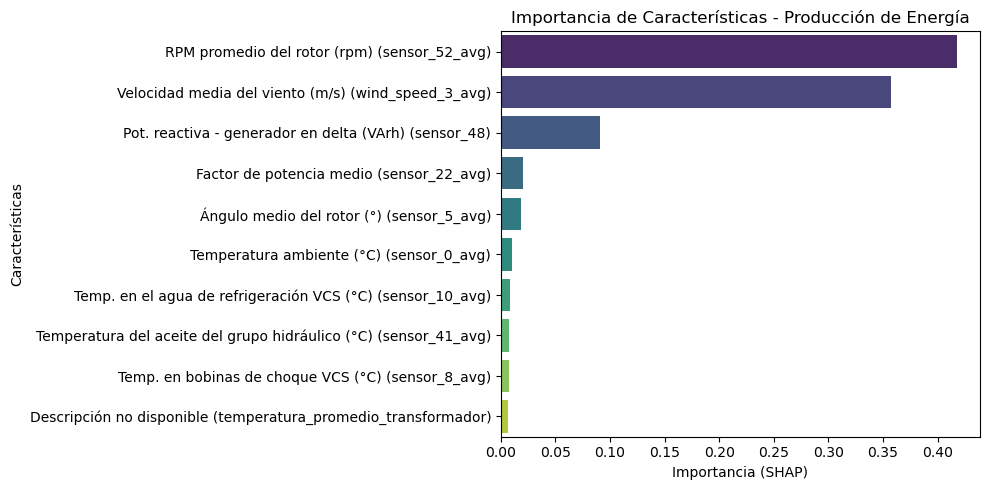


✅ **Resumen de características seleccionadas:**

🔹 Estado Generador RFE:
  - sensor_0_avg: Temperatura ambiente (°C)
  - wind_speed_3_avg: Velocidad media del viento (m/s)
  - sensor_6_avg: Temp. en el controlador del buje (°C)
  - sensor_7_avg: Temp. en parte superior de la góndola (°C)
  - sensor_8_avg: Temp. en bobinas de choque VCS (°C)
  - sensor_13_avg: Temp. cojinete 2 generador (°C)
  - sensor_41_avg: Temperatura del aceite del grupo hidráulico (°C)
  - sensor_42_avg: Dirección de la góndola (°)
  - sensor_50: Potencia activa total (Wh)
  - temperatura_promedio_transformador: Descripción no disponible

🔹 Estado Generador SHAP:
  - sensor_50: Potencia activa total (Wh)
  - wind_speed_3_avg: Velocidad media del viento (m/s)
  - sensor_13_avg: Temp. cojinete 2 generador (°C)
  - temperatura_promedio_transformador: Descripción no disponible
  - sensor_43_avg: Temperatura de la góndola (°C)
  - sensor_8_avg: Temp. en bobinas de choque VCS (°C)
  - sensor_0_avg: Temperatura ambiente

In [34]:
# 📌 Función para seleccionar las mejores características usando RFE y SHAP
def seleccionar_caracteristicas(df, objetivo, nombre_objetivo):
    print(f"\n🔹 Seleccionando características para predecir {nombre_objetivo}")

    # 📌 Asegurar que solo se usen variables numéricas
    df = df.select_dtypes(include=[np.number]).copy()

    # 📌 Definir variables independientes (X) y dependiente (y)
    X_features = df.drop(columns=[objetivo])
    y_target = df[objetivo]

    # 📌 Normalizar las características
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_features)

    # 📌 Método 1: Selección con RFE usando Random Forest
    if y_target.nunique() > 2:  # Si es regresión (sensor_50)
        modelo_rf = RandomForestRegressor(n_estimators=100, random_state=42)
    else:  # Si es clasificación (status_type_id)
        modelo_rf = RandomForestClassifier(n_estimators=100, random_state=42)
    
    selector_rfe = RFE(modelo_rf, n_features_to_select=10)
    selector_rfe.fit(X_scaled, y_target)
    selected_features_rfe = X_features.columns[selector_rfe.support_]

    print(f"\n✅ {nombre_objetivo} - Mejores características (RFE):")
    for feature in selected_features_rfe:
        descripcion = descripcion_variables.get(feature, "Descripción no disponible")
        print(f"  - {feature}: {descripcion}")

    # 📌 Método 2: Selección con SHAP usando XGBoost
    if y_target.nunique() > 2:
        modelo_xgb = xgb.XGBRegressor(n_estimators=100, random_state=42)
    else:
        modelo_xgb = xgb.XGBClassifier(n_estimators=100, random_state=42)
    
    modelo_xgb.fit(X_scaled, y_target) 

    explainer = shap.Explainer(modelo_xgb, X_scaled)
    shap_values = explainer(X_scaled)

    # 📌 Obtener la importancia de cada característica
    shap_importance = np.abs(shap_values.values).mean(axis=0)
    feature_importance = pd.DataFrame({
        "Feature": X_features.columns,
        "Importance": shap_importance
    })
    feature_importance = feature_importance.sort_values(by="Importance", ascending=False).head(10)

    print(f"\n✅ {nombre_objetivo} - Mejores características (SHAP):")
    for feature in feature_importance["Feature"]:
        descripcion = descripcion_variables.get(feature, "Descripción no disponible")
        print(f"  - {feature}: {descripcion}")

    # 📌 Añadir descripciones para las etiquetas del gráfico
    feature_importance["Descripción"] = feature_importance["Feature"].apply(
        lambda x: f"{descripcion_variables.get(x, 'Descripción no disponible')} ({x})"
    )

    # 📌 Gráfica de Importancia de Características
    plt.figure(figsize=(10, 5))
    sns.barplot(x=feature_importance["Importance"], y=feature_importance["Descripción"], palette="viridis")
    plt.title(f"Importancia de Características - {nombre_objetivo}")
    plt.xlabel("Importancia (SHAP)")
    plt.ylabel("Características")
    plt.tight_layout()
    plt.show()

    return selected_features_rfe, feature_importance["Feature"].values


# 📌 Aplicar selección de características para ambos objetivos
mejores_features_status_rfe, mejores_features_status_shap = seleccionar_caracteristicas(X, "status_type_id", "Estado del Generador")
mejores_features_sensor_rfe, mejores_features_sensor_shap = seleccionar_caracteristicas(X, "sensor_50", "Producción de Energía")

# 📌 Guardar las mejores características en un diccionario
mejores_features = {
    "Estado Generador RFE": mejores_features_status_rfe,
    "Estado Generador SHAP": mejores_features_status_shap,
    "Producción Energía RFE": mejores_features_sensor_rfe,
    "Producción Energía SHAP": mejores_features_sensor_shap,
}

# 📌 Mostrar resumen con descripciones
print("\n✅ **Resumen de características seleccionadas:**")
for key, variables in mejores_features.items():
    print(f"\n🔹 {key}:")
    for var in variables:
        descripcion = descripcion_variables.get(var, "Descripción no disponible")
        print(f"  - {var}: {descripcion}")


# **Análisis de las mejores caracteristicas del dataset**

La selección de características es una etapa crucial en la construcción de modelos de aprendizaje automático, ya que permite identificar las variables más relevantes para mejorar la precisión del modelo, reducir el sobreajuste y disminuir el costo computacional del entrenamiento (Guyon & Elisseeff, 2003). En este estudio, se implementan dos métodos de selección de características: Recursive Feature Elimination (RFE) y SHAP (SHapley Additive Explanations), aplicados a los datos provenientes de un parque eólico con el objetivo de mejorar la clasificación de los estados productivos e improductivos de los aerogeneradores.

    Recursive Feature Elimination (RFE) El algoritmo RFE, basado en la metodología de Random Forest, selecciona iterativamente las características más relevantes eliminando progresivamente aquellas que tienen menor impacto en la predicción. Este método ha demostrado ser efectivo en tareas de clasificación en entornos de alta dimensionalidad, ya que evalúa la importancia de cada variable en función de su contribución al rendimiento del modelo (Kohavi & John, 1997).

    SHAP (SHapley Additive Explanations) El método SHAP proporciona una interpretación más profunda de la importancia de las características al asignarles valores de contribución basados en la teoría de juegos de Shapley (Lundberg & Lee, 2017). Este enfoque permite cuantificar de manera precisa la relevancia de cada variable en la toma de decisiones del modelo, ofreciendo interpretabilidad en modelos de clasificación complejos como XGBoost.

En este trabajo, ambos métodos se aplican a los datos del parque eólico, diferenciando entre estados productivos e improductivos. Se seleccionan las diez características más importantes en cada conjunto de datos, garantizando así la optimización de los modelos de predicción.

Referencias Guyon, I., & Elisseeff, A. (2003). An Introduction to Variable and Feature Selection. Journal of Machine Learning Research, 3, 1157–1182.

Kohavi, R., & John, G. H. (1997). Wrappers for feature subset selection. Artificial Intelligence, 97(1-2), 273–324.

Lundberg, S. M., & Lee, S. I. (2017). A Unified Approach to Interpreting Model Predictions. Advances in Neural Information Processing Systems (NeurIPS), 30, 4765–4774.

In [35]:
# 📌 Guardar las mejores características en un DataFrame
mejores_features_df = pd.DataFrame({
    "Estado_Generador_RFE": list(mejores_features_status_rfe),
    "Estado_Generador_SHAP": list(mejores_features_status_shap),
    "Producción_Energía_RFE": list(mejores_features_sensor_rfe),
    "Producción_Energía_SHAP": list(mejores_features_sensor_shap)
})

# 📌 Guardar en un archivo CSV
csv_filename = "mejores_caracteristicas.csv"
mejores_features_df.to_csv(csv_filename, index=False, encoding='utf-8')

print(f"\n✅ Características guardadas en {csv_filename}")


✅ Características guardadas en mejores_caracteristicas.csv


# **3.-Recuperar mejores caracteristicas**

In [25]:
# 📌 Nombre del archivo CSV donde se guardaron las mejores características
csv_filename = "mejores_caracteristicas.csv"

# 📌 Cargar las características desde el CSV
mejores_features_df = pd.read_csv(csv_filename)

# 📌 Convertir las columnas en listas para mantener el formato original
mejores_features_status_rfe2 = mejores_features_df["Estado_Generador_RFE"].dropna().tolist()
mejores_features_status_shap2 = mejores_features_df["Estado_Generador_SHAP"].dropna().tolist()
mejores_features_sensor_rfe2 = mejores_features_df["Producción_Energía_RFE"].dropna().tolist()
mejores_features_sensor_shap2 = mejores_features_df["Producción_Energía_SHAP"].dropna().tolist()

# 📌 Crear un diccionario con las características recuperadas
mejores_features_recuperadas = {
    "Estado Generador RFE": mejores_features_status_rfe2,
    "Estado Generador SHAP": mejores_features_status_shap2,
    "Producción Energía RFE": mejores_features_sensor_rfe2,
    "Producción Energía SHAP": mejores_features_sensor_shap2,
}

# 📌 Mostrar las características recuperadas
print("\n✅ **Características recuperadas desde el archivo CSV:**")
for key, value in mejores_features_recuperadas.items():
    print(f"{key}: {value}")



✅ **Características recuperadas desde el archivo CSV:**
Estado Generador RFE: ['sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg', 'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg', 'sensor_50', 'temperatura_promedio_transformador']
Estado Generador SHAP: ['sensor_50', 'wind_speed_3_avg', 'sensor_13_avg', 'temperatura_promedio_transformador', 'sensor_43_avg', 'sensor_8_avg', 'sensor_0_avg', 'sensor_42_avg', 'sensor_6_avg', 'sensor_12_avg']
Producción Energía RFE: ['sensor_0_avg', 'sensor_2_avg', 'wind_speed_3_avg', 'sensor_5_avg', 'sensor_6_avg', 'sensor_42_avg', 'sensor_43_avg', 'sensor_48', 'sensor_52_avg', 'temperatura_promedio_transformador']
Producción Energía SHAP: ['sensor_52_avg', 'wind_speed_3_avg', 'sensor_48', 'sensor_22_avg', 'sensor_5_avg', 'sensor_0_avg', 'sensor_10_avg', 'sensor_41_avg', 'sensor_8_avg', 'temperatura_promedio_transformador']


# **Objetivo 2. Prueba preliminar de modelo de predicción de producción de energía con todo el dataset**

Utilizar un 70% de los datos para entrenar permite al modelo tener acceso a una cantidad significativa de ejemplos, lo cual es esencial para aprender patrones representativos y evitar el subajuste. Al mismo tiempo, reservar un 30% para validación ofrece una muestra amplia y variada que facilita una evaluación fiable de la capacidad generalizadora del modelo (Géron, 2019).

Reducción del sesgo de validación:
Una proporción mayor (como 80/20) puede resultar en un conjunto de validación demasiado pequeño en contextos con datasets limitados o desequilibrios de clases, aumentando la varianza en la estimación del rendimiento. El 30% ayuda a mitigar este riesgo y mejora la estabilidad estadística de las métricas obtenidas (Han, Kamber & Pei, 2011).

Uso común en escenarios exploratorios:
En estudios donde se busca comparar modelos o explorar múltiples configuraciones de algoritmos (como clustering, clasificación o predicción en parques eólicos), una división 70/30 es una práctica estándar en la literatura, dado que facilita una evaluación más robusta durante el ajuste de hiperparámetros o técnicas de validación cruzada (Kelleher, Mac Carthy & Korvir, 2015).

Géron, A. (2019). Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (2nd ed.). O'Reilly Media.

Han, J., Kamber, M., & Pei, J. (2011). Data Mining: Concepts and Techniques (3rd ed.). Elsevier.

Kelleher, J. D., Mac Carthy, M., & Korvir, B. (2015). Fundamentals of Machine Learning for Predictive Data Analytics: Algorithms, Worked Examples, and Case Studies. MIT Press.


🔹 Evaluando modelo con variables: ['wind_speed_3_avg']


🔍 Probando modelo: LinearRegression
📊 R² (desnormalizado): 0.7522
✅ MAE: 37184.5464
✅ MSE: 3572341030.3258
✅ RMSE: 59769.0642
⏳ Tiempo de ejecución: 0 minutos y 0.04 segundos

🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
📊 R² (desnormalizado): 0.8482
✅ MAE: 16463.8031
✅ MSE: 2187844731.2773
✅ RMSE: 46774.4025
⏳ Tiempo de ejecución: 0 minutos y 15.72 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
📊 R² (desnormalizado): 0.8482
✅ MAE: 16549.2467
✅ MSE: 2188307059.6124
✅ RMSE: 46779.3444
⏳ Tiempo de ejecución: 0 minutos y 3.71 segundos

✅ **Mejor modelo seleccionado:** RandomForest con R² = 0.8482


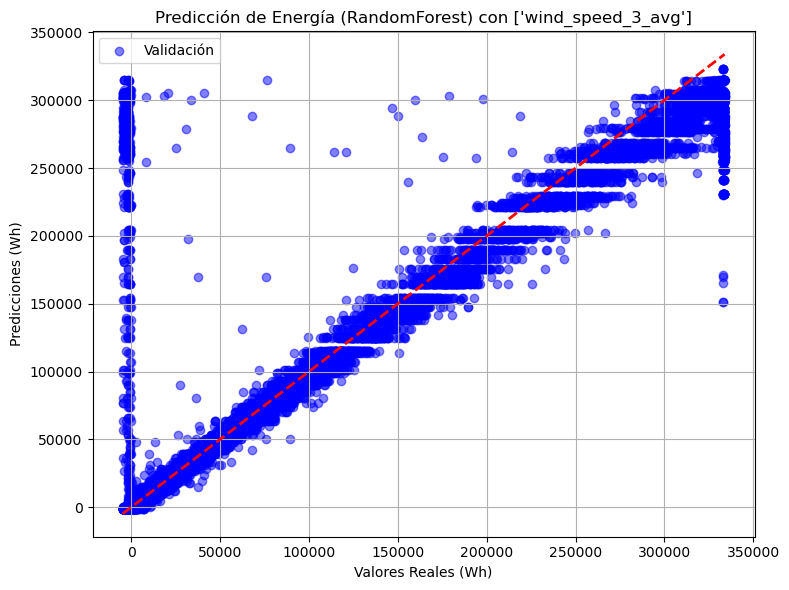


💾 Mejor modelo guardado como 'modelo_generacion_energia_wind_speed_3_avg.pkl'
🏆 Modelo: RandomForest con R² = 0.8482
📌 Variables usadas: ['wind_speed_3_avg']

🔹 Evaluando modelo con variables: ['wind_speed_3_avg', 'sensor_0_avg']


🔍 Probando modelo: LinearRegression
📊 R² (desnormalizado): 0.7570
✅ MAE: 37042.5704
✅ MSE: 3502962259.1358
✅ RMSE: 59185.8282
⏳ Tiempo de ejecución: 0 minutos y 0.03 segundos

🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
📊 R² (desnormalizado): 0.8701
✅ MAE: 14597.2647
✅ MSE: 1871838425.3436
✅ RMSE: 43264.7481
⏳ Tiempo de ejecución: 0 minutos y 24.68 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
📊 R² (desnormalizado): 0.8710
✅ MAE: 14823.7545
✅ MSE: 1859460094.9827
✅ RMSE: 43121.4575
⏳ Tiempo de ejecución: 0 minutos y 6.82 segundos

✅ **Mejor mode

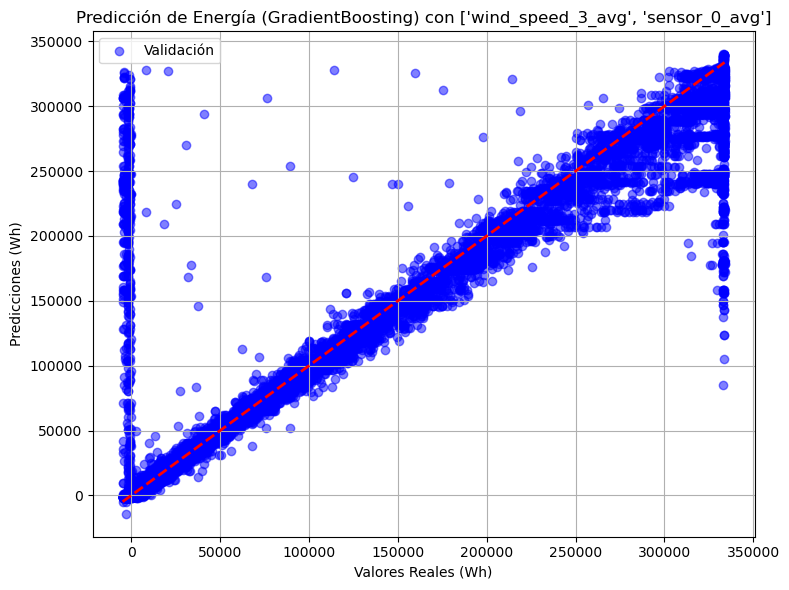


💾 Mejor modelo guardado como 'modelo_generacion_energia_wind_speed_3_avg_sensor_0_avg.pkl'
🏆 Modelo: GradientBoosting con R² = 0.8710
📌 Variables usadas: ['wind_speed_3_avg', 'sensor_0_avg']

🔹 Evaluando modelo con variables: ['wind_speed_3_avg', 'sensor_5_avg', 'sensor_0_avg']


🔍 Probando modelo: LinearRegression
📊 R² (desnormalizado): 0.8274
✅ MAE: 41278.7642
✅ MSE: 2487347046.1006
✅ RMSE: 49873.3100
⏳ Tiempo de ejecución: 0 minutos y 0.17 segundos

🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
📊 R² (desnormalizado): 0.9981
✅ MAE: 3020.1953
✅ MSE: 27094069.5887
✅ RMSE: 5205.1964
⏳ Tiempo de ejecución: 0 minutos y 48.34 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
📊 R² (desnormalizado): 0.9981
✅ MAE: 3012.6190
✅ MSE: 26953013.9594
✅ RMSE: 5191.6292
⏳ Tiempo de ejecución: 

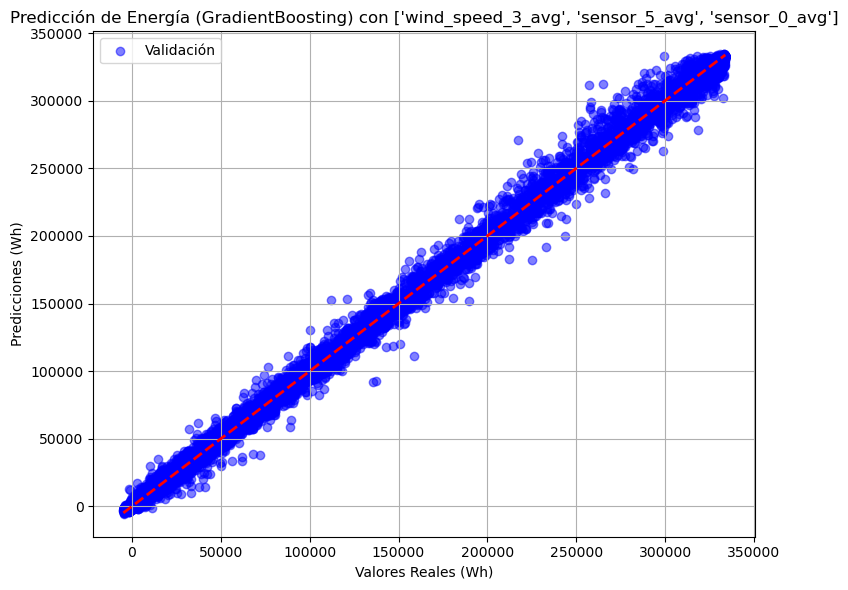


💾 Mejor modelo guardado como 'modelo_generacion_energia_wind_speed_3_avg_sensor_5_avg_sensor_0_avg.pkl'
🏆 Modelo: GradientBoosting con R² = 0.9981
📌 Variables usadas: ['wind_speed_3_avg', 'sensor_5_avg', 'sensor_0_avg']

🔹 Evaluando modelo con variables: ['sensor_52_avg', 'wind_speed_3_avg', 'sensor_48', 'sensor_22_avg', 'sensor_5_avg', 'sensor_0_avg', 'sensor_10_avg', 'sensor_41_avg', 'sensor_8_avg']


🔍 Probando modelo: LinearRegression
📊 R² (desnormalizado): 0.8992
✅ MAE: 29477.8965
✅ MSE: 1452575792.6288
✅ RMSE: 38112.6723
⏳ Tiempo de ejecución: 0 minutos y 0.04 segundos

🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
📊 R² (desnormalizado): 0.9985
✅ MAE: 2554.7139
✅ MSE: 20953891.9608
✅ RMSE: 4577.5421
⏳ Tiempo de ejecución: 2 minutos y 42.66 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.1, 'max_depth': 5, 'n

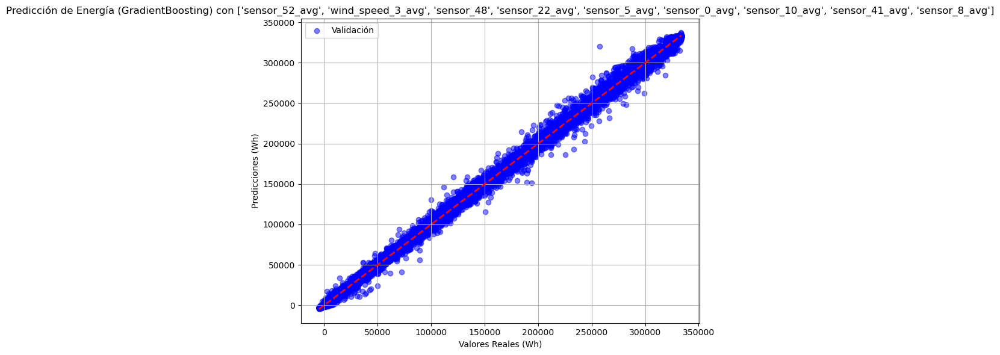


💾 Mejor modelo guardado como 'modelo_generacion_energia_sensor_52_avg_wind_speed_3_avg_sensor_48_sensor_22_avg_sensor_5_avg_sensor_0_avg_sensor_10_avg_sensor_41_avg_sensor_8_avg.pkl'
🏆 Modelo: GradientBoosting con R² = 0.9986
📌 Variables usadas: ['sensor_52_avg', 'wind_speed_3_avg', 'sensor_48', 'sensor_22_avg', 'sensor_5_avg', 'sensor_0_avg', 'sensor_10_avg', 'sensor_41_avg', 'sensor_8_avg']

✅ Resultados exportados a 'resultados_modelos_energia.csv'


In [75]:
# ========================
# 📌 Evaluación de modelos 
# ========================

# Cargar el scaler
scaler_y = joblib.load("scaler_estado.pkl")

# Lista de columnas utilizadas para escalar (orden original)
columnas_escaladas = list(columnas_numericas)

# Lista para almacenar resultados
resultados_modelos = []


# Función principal
def evaluar_modelo(dataset, variables, variable_objetivo):
    print(f"\n🔹 Evaluando modelo con variables: {variables}\n")

    # División de variables
    X = dataset[variables].copy()
    y = dataset[[variable_objetivo]].copy()

    # División en entrenamiento y validación
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, shuffle=True)

    # Modelos e hiperparámetros
    modelos = {
        "LinearRegression": LinearRegression(),
        "RandomForest": RandomForestRegressor(random_state=42),
        "GradientBoosting": GradientBoostingRegressor(random_state=42)
    }

    param_grids = {
        "LinearRegression": {},
        "RandomForest": {
            "n_estimators": [100],
            "max_depth": [10, 20, None],
            "min_samples_split": [2, 5],
            "min_samples_leaf": [1, 2]
        },
        "GradientBoosting": {
            "n_estimators": [100],
            "learning_rate": [0.01, 0.1],
            "max_depth": [3, 5]
        }
    }

    mejor_modelo = None
    mejor_r2 = -np.inf
    mejor_nombre = None

    for nombre_modelo, modelo in modelos.items():
        print(f"\n🔍 Probando modelo: {nombre_modelo}")
        start_time = time.time()

        if param_grids[nombre_modelo]:
            grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="r2", n_jobs=-1)
            grid_search.fit(X_train, y_train.values.ravel())
            modelo_opt = grid_search.best_estimator_
            print(f"✅ Mejor configuración de {nombre_modelo}: {grid_search.best_params_}")
        else:
            modelo.fit(X_train, y_train.values.ravel())
            modelo_opt = modelo

        # Predicciones normalizadas
        y_val_pred = modelo_opt.predict(X_val)

        # Preparar y_val para desnormalización
        y_val_df = pd.DataFrame(np.zeros((y_val.shape[0], len(columnas_escaladas))), columns=columnas_escaladas)
        y_val_df[variable_objetivo] = y_val.values.flatten()
        y_val_real = scaler_y.inverse_transform(y_val_df)[:, columnas_escaladas.index(variable_objetivo)]

        y_pred_df = pd.DataFrame(np.zeros((y_val_pred.shape[0], len(columnas_escaladas))), columns=columnas_escaladas)
        y_pred_df[variable_objetivo] = y_val_pred
        y_val_pred_desnorm = scaler_y.inverse_transform(y_pred_df)[:, columnas_escaladas.index(variable_objetivo)]

        # Métricas con datos desnormalizados
        r2_val = r2_score(y_val_real, y_val_pred_desnorm)
        mae_val = mean_absolute_error(y_val_real, y_val_pred_desnorm)
        mse_val = mean_squared_error(y_val_real, y_val_pred_desnorm)
        rmse_val = np.sqrt(mse_val)

        print(f"📊 R² (desnormalizado): {r2_val:.4f}")
        print(f"✅ MAE: {mae_val:.4f}")
        print(f"✅ MSE: {mse_val:.4f}")
        print(f"✅ RMSE: {rmse_val:.4f}")

        if r2_val > mejor_r2:
            mejor_r2 = r2_val
            mejor_modelo = modelo_opt
            mejor_nombre = nombre_modelo
            mejor_variables =variables

        elapsed_time = time.time() - start_time
        minutes, seconds = divmod(elapsed_time, 60)
        print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

        resultados_modelos.append({
            "Modelo": nombre_modelo,
            "Variables": ", ".join(variables),
            "R²": r2_val,
            "MAE": mae_val,
            "MSE": mse_val,
            "RMSE": rmse_val
        })

    # Gráfico final
    print(f"\n✅ **Mejor modelo seleccionado:** {mejor_nombre} con R² = {mejor_r2:.4f}")

    y_val_pred = mejor_modelo.predict(X_val)
    y_pred_df[variable_objetivo] = y_val_pred
    y_val_pred_desnorm = scaler_y.inverse_transform(y_pred_df)[:, columnas_escaladas.index(variable_objetivo)]

    plt.figure(figsize=(8, 6))
    plt.scatter(y_val_real, y_val_pred_desnorm, alpha=0.5, color="blue", label="Validación")
    plt.plot([min(y_val_real), max(y_val_real)], [min(y_val_real), max(y_val_real)], "--", color="red", lw=2)
    plt.xlabel("Valores Reales (Wh)")
    plt.ylabel("Predicciones (Wh)")
    plt.title(f"Predicción de Energía ({mejor_nombre}) con {variables}")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()
    
    # 📌 Guardar el mejor modelo conseguido para este conjunto de variables
    nombre_modelo_archivo = "modelo_generacion_energia_" + "_".join(variables) + ".pkl"
    joblib.dump({
    "modelo": mejor_modelo,
    "variables": variables
    }, nombre_modelo_archivo)
    print(f"\n💾 Mejor modelo guardado como '{nombre_modelo_archivo}'")
    print(f"🏆 Modelo: {mejor_nombre} con R² = {mejor_r2:.4f}")
    print(f"📌 Variables usadas: {variables}")

# ========================
# 📌 Pruebas con diferentes combinaciones de variables
# ========================

variable_velocidad = ["wind_speed_3_avg"]
variables_ambientales = ["wind_speed_3_avg", "sensor_0_avg"]
variables_ambientales_pala = ["wind_speed_3_avg", "sensor_5_avg", "sensor_0_avg"]
#variables_temperatura = ["sensor_0_avg", "wind_speed_3_avg", "sensor_6_avg", "sensor_7_avg", "sensor_8_avg", "sensor_13_avg"]
#variable_mejores_caracteristicas = ['sensor_0_avg', 'sensor_2_avg', 'wind_speed_3_avg', 'sensor_5_avg', 'sensor_6_avg', 'sensor_13_avg', 'sensor_42_avg', 'sensor_43_avg', 'sensor_48']
variable_mejores_caracteristicas_shap = ['sensor_52_avg', 'wind_speed_3_avg', 'sensor_48', 'sensor_22_avg', 'sensor_5_avg', 'sensor_0_avg', 'sensor_10_avg', 'sensor_41_avg', 'sensor_8_avg']

# 📌 Ejecutar evaluaciones
evaluar_modelo(dataset_normalizado, variable_velocidad, "sensor_50")
evaluar_modelo(dataset_normalizado, variables_ambientales, "sensor_50")
evaluar_modelo(dataset_normalizado, variables_ambientales_pala, "sensor_50")
#evaluar_modelo(dataset_normalizado, variables_temperatura, "sensor_50")
#evaluar_modelo(dataset_normalizado, variable_mejores_caracteristicas, "sensor_50")
evaluar_modelo(dataset_normalizado, variable_mejores_caracteristicas_shap, "sensor_50")

# 📌 Crear DataFrame con los resultados
df_resultados = pd.DataFrame(resultados_modelos)
df_resultados.to_csv("resultados_modelos_energia.csv", index=False)
print("\n✅ Resultados exportados a 'resultados_modelos_energia.csv'")



In [ ]:
# 📌 Gráfico comparativo de R² para los diferentes modelos y conjuntos de variables

# 📌 Agregar una columna con el nombre del conjunto de variables en lugar de la lista completa
df_resultados["Grupo de Variables"] = df_resultados["Variables"].map({
    ", ".join(variable_velocidad): "variable_velocidad",
    ", ".join(variables_ambientales): "variables_ambientales",
    ", ".join(variables_ambientales_pala): "variables_ambientales_pala",
#    ", ".join(variables_temperatura): "variables_temperatura",
#    ", ".join(variable_mejores_caracteristicas): "variable_mejores_caracteristicas",
    ", ".join(variable_mejores_caracteristicas2): "variable_mejores_caracteristicas_shap"
})

# 📌 Crear el gráfico
plt.figure(figsize=(12, 10))
barplot = sns.barplot(data=df_resultados, x="Grupo de Variables", y="R²", hue="Modelo", palette="viridis")

# 📌 Añadir anotaciones encima de cada barra con más espacio
for container in barplot.containers:
    for bar in container:
        height = bar.get_height()
        barplot.annotate(f"{height:.4f}",
                         xy=(bar.get_x() + bar.get_width() / 2, height),
                         xytext=(0, 0),  # Aumenta el espacio vertical
                         textcoords="offset points",
                         ha='center', va='bottom',
                         fontsize=13, rotation=45, color='black')

# 📌 Ajustes finales
plt.xticks(rotation=45, ha="right")
plt.xlabel("Conjunto de Variables")
plt.ylabel("R² Score")
plt.title("Comparación de Modelos según Conjunto de Variables")
plt.legend(title="Modelo")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

El modelo de regresión optimizado utilizando Gradient Boosting obtuvo un R² de 0.9982, lo que indica una precisión excepcional en la predicción de la generación de energía. Comparado con Random Forest (R² = 0.9981) y Regresión Lineal (R² = 0.8274), Gradient Boosting mostró un rendimiento superior, confirmando su capacidad para capturar relaciones no lineales en los datos. Las métricas de error reflejan esta alta precisión, con un MAE de 0.0250, un MSE de 0.0018, y un RMSE de 0.0429, evidenciando que las predicciones son muy cercanas a los valores reales. En cuanto a la importancia de las variables, wind_speed_3_avg (velocidad del viento) resultó ser el factor más influyente en la predicción con un 81.7% de importancia, seguido por sensor_5_avg (ángulo de paso) con un 18.1%, mientras que sensor_0_avg (temperatura ambiente) tuvo una contribución mínima (0.1%). Estos resultados sugieren que la velocidad del viento y el ángulo de paso son las variables clave en la generación de energía del parque eólico, mientras que la temperatura ambiente tiene un impacto insignificante en la predicción.

# **4.-Recuperar mejor modelo para predecir la generación eolica**

In [26]:
# 📌 Cargar el modelo desde el archivo
#mejor_modelo_generacion_energia = joblib.load("modelo_generacion_energia_wind_speed_3_avg_sensor_5_avg_sensor_0_avg.pkl")
modelo_guardado = joblib.load("modelo_generacion_energia_wind_speed_3_avg_sensor_5_avg_sensor_0_avg.pkl")
mejor_modelo_generacion_energia = modelo_guardado["modelo"]
variables_ambientales = modelo_guardado["variables"]

print("✅ Modelo cargado correctamente desde el disco.")

# 📌 Verificar el tipo de modelo cargado
print(f"📊 Tipo de modelo cargado: {type(mejor_modelo_generacion_energia)}")

✅ Modelo cargado correctamente desde el disco.
📊 Tipo de modelo cargado: <class 'sklearn.ensemble._gb.GradientBoostingRegressor'>


# **Predicción de producción de energía a 2 semanas**

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
DEBUG:cmdstanpy:input tempfile: C:\Users\aless\AppData\Local\Temp\tmpxi1_97qw\orj_6d75.json
DEBUG:cmdstanpy:input tempfile: C:\Users\aless\AppData\Local\Temp\tmpxi1_97qw\flj97efi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\aless\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=67965', 'data', 'file=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\orj_6d75.json', 'init=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\flj97efi.json', 'output', 'file=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\prophet_modelwvt8l1xu\\prophet_model-20250428130917.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:09:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmds

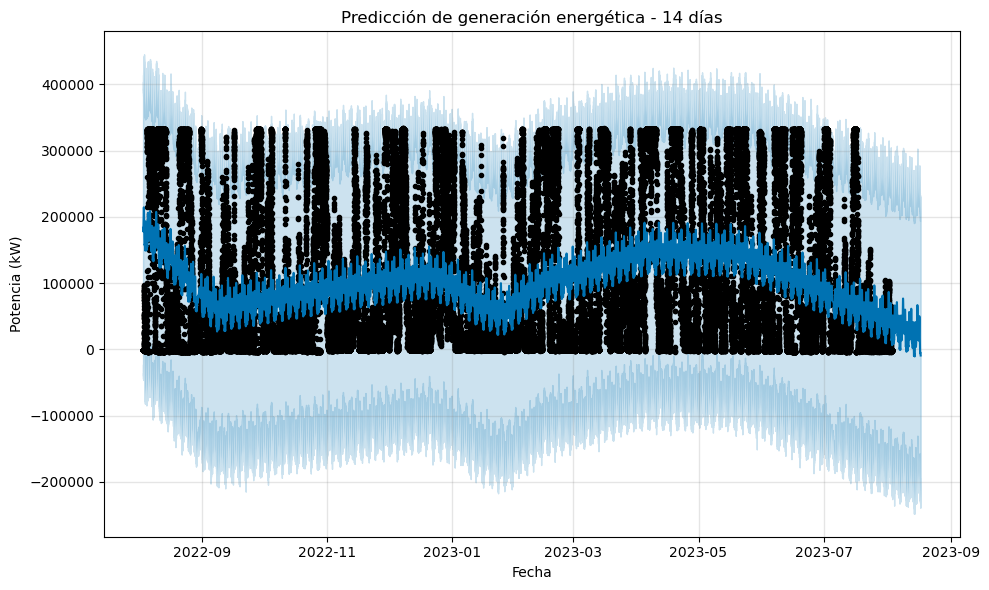

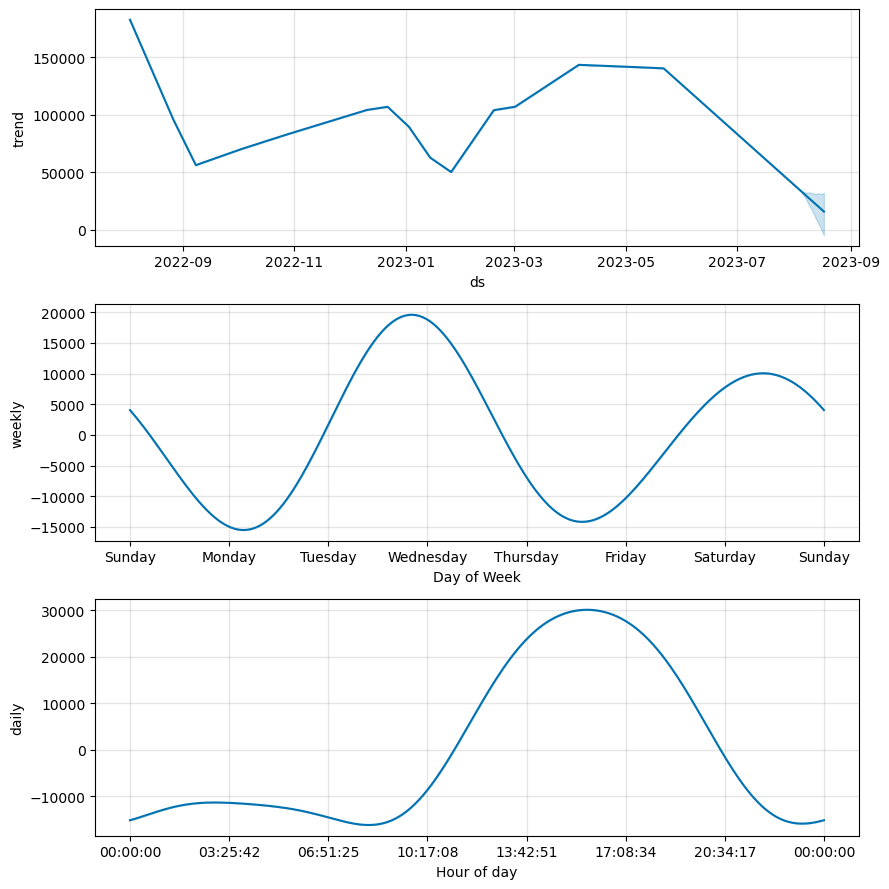

In [34]:
# Con prophet y a 14 días
#Referencia APA:
#Hyndman, R. J., & Athanasopoulos, G. (2021). Forecasting: principles and practice (3rd ed.). OTexts. https://otexts.com/fpp3/


# 1. Cargar datos
df = pd.read_csv("dataset_reducido_sin_normalizar.csv", parse_dates=['time_stamp'])
df = df.sort_values('time_stamp')

# 2. Preprocesar para Prophet
# Suavizar ligeramente
df['sensor_50_suavizada'] = df['sensor_50'].rolling(window=6, min_periods=1).mean()

# Preparar DataFrame con columnas 'ds' y 'y'
df_prophet = df[['time_stamp', 'sensor_50_suavizada']].rename(columns={'time_stamp': 'ds', 'sensor_50_suavizada': 'y'})
df_prophet.dropna(inplace=True)

# 3. Crear y ajustar modelo
model = Prophet(
    daily_seasonality=True,
    weekly_seasonality=True,
    yearly_seasonality=False,
    interval_width=0.95
)
model.fit(df_prophet)

# 4. Crear fechas futuras: 14 días hacia adelante cada 10 minutos
future = model.make_future_dataframe(periods=14*24*6, freq='10min')  # 6 datos por hora
forecast = model.predict(future)

# 5. Visualización general
fig1 = model.plot(forecast)
plt.title("Predicción de generación energética - 14 días")
plt.xlabel("Fecha")
plt.ylabel("Potencia (kW)")
plt.tight_layout()
plt.show()

# 6. Visualización de componentes (tendencia y estacionalidad)
fig2 = model.plot_components(forecast)
plt.tight_layout()
plt.show()



# **Prueba en la prediccion de la generación eolica para otros datasets nunvca visto por el modelo durante el entrenamiento, que corresponde a otros generadores eolicos del parque eolico**

**Predicción de valores de la energía eolica en diferentes dataset, nunca visto por el algoritmo de ML**

In [ ]:
# 📌 Función para cargar datasets según el rango especificado
def upload_files(file_name, index_fields=None):
    df = pd.read_csv(file_name, sep=';', index_col=index_fields)
    return df

# 📌 Cargar el modelo entrenado desde el disco

modelo_guardado = joblib.load("modelo_generacion_energia_wind_speed_3_avg_sensor_5_avg_sensor_0_avg.pkl")
mejor_modelo_generacion_energia = modelo_guardado["modelo"]
variables_ambientales = modelo_guardado["variables"]

print("\n✅ Modelo cargado correctamente desde el disco.")

# 📌 Especificar el rango de datasets a evaluar
inicio = 0   # Número inicial del dataset (ej. 0.csv)
fin = 8     # Número final del dataset (ej. 10.csv)

# 📌 Listas para almacenar resultados
resultados = []
fig, axes = plt.subplots(2, 5, figsize=(25, 10))  # Crear subgráficos en una cuadrícula 2x5

for i, dataset_num in enumerate(range(inicio, fin+1)):
    try:
        # 📌 Cargar el dataset
        file_name = f"{dataset_num}.csv"
        nuevo_dataset = upload_files(file_name)
        print(f"\n📂 Evaluando {file_name}")

        # 📌 Verificar que las variables existan en el dataset
        for var in variables_ambientales:
            if var not in nuevo_dataset.columns:
                raise ValueError(f"❌ La variable {var} no se encuentra en {file_name}.")

        # 📌 Definir variables predictoras (X) y variable objetivo (y)
        X_nuevo = nuevo_dataset[variables_ambientales]
        y_nuevo = nuevo_dataset["sensor_50"].values.reshape(-1, 1)  # Convertir a matriz 2D para normalización

        # 📌 Normalizar los datos antes de la predicción
        scaler_X = StandardScaler()
        scaler_y = StandardScaler()

        X_nuevo_scaled = scaler_X.fit_transform(X_nuevo)
        y_nuevo_scaled = scaler_y.fit_transform(y_nuevo)

        # 📌 Convertir de nuevo a DataFrame con nombres de columnas para evitar warnings
        X_nuevo_scaled_df = pd.DataFrame(X_nuevo_scaled, columns=variables_ambientales)

        # 📌 Realizar predicciones con el nuevo dataset normalizado
        y_nuevo_pred_scaled = mejor_modelo_generacion_energia.predict(X_nuevo_scaled_df)

        # 📌 Asegurar que las predicciones tengan la forma correcta antes de desnormalizar
        y_nuevo_pred_scaled = np.array(y_nuevo_pred_scaled).reshape(-1, 1)

        # 📌 Desnormalizar las predicciones para compararlas con los valores reales
        y_nuevo_pred = scaler_y.inverse_transform(y_nuevo_pred_scaled).flatten()

        # 📌 Evaluación del modelo en este dataset
        mae = mean_absolute_error(y_nuevo, y_nuevo_pred)
        mse = mean_squared_error(y_nuevo, y_nuevo_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_nuevo, y_nuevo_pred)

        resultados.append([file_name, mae, mse, rmse, r2])

        # 📌 Graficar predicciones vs valores reales en la cuadrícula de subplots
        ax = axes[i // 5, i % 5]  # Posición en la cuadrícula
        ax.scatter(y_nuevo, y_nuevo_pred, alpha=0.5, color="blue", label="Predicciones")
        ax.plot([y_nuevo.min(), y_nuevo.max()], [y_nuevo.min(), y_nuevo.max()], "--", color="red", lw=2)
        ax.set_xlabel("Valores Reales")
        ax.set_ylabel("Predicciones")
        ax.tick_params(axis='x', labelrotation=45)        # Inclinación de las etiquetas del eje X
        ax.set_title(f"Evaluación en {file_name}\nR²={r2:.4f}, MAE={mae:.2f}")
        ax.legend()
        ax.grid()

    except Exception as e:
        print(f"⚠️ Error procesando {file_name}: {e}")

# 📌 Mostrar los gráficos
plt.tight_layout()
plt.show()

# 📌 Convertir los resultados a un DataFrame
df_resultados = pd.DataFrame(resultados, columns=["Dataset", "MAE", "MSE", "RMSE", "R²"])

# 📌 Mostrar las estadísticas de cada dataset
print("\n📊 **Resultados de la Evaluación en Múltiples Datasets:**")
print(df_resultados)

# 📌 Guardar los resultados en un archivo CSV para referencia futura
df_resultados.to_csv("resultados_modelo_generacion.csv", index=False)
print("\n✅ Resultados guardados en 'resultados_modelo_generacion.csv'")


# **Entrenamiento del estado del generador sin balanceo de clases


🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
📊 Precisión en Validación para RandomForest: 0.9463
⏳ Tiempo de ejecución: 4 minutos y 54.14 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}
📊 Precisión en Validación para GradientBoosting: 0.9455
⏳ Tiempo de ejecución: 8 minutos y 29.73 segundos

✅ **Mejor modelo seleccionado:** RandomForest con Accuracy = 0.9463

📊 **Reporte de Clasificación:**
              precision    recall  f1-score   support

           0       0.96      0.97      0.97     11790
           3       0.64      0.21      0.31       251
           5       0.91      0.91      0.91      3604

    accuracy                           0.95     15645
   macro avg       0.84      0.70      0.73     15645
weighted avg       0.94      0.95      0.94     15645



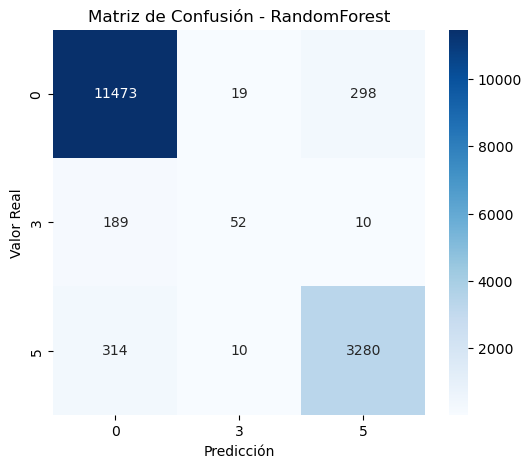

In [76]:
variables_ambientales = ["sensor_0_avg", "wind_speed_3_avg", "sensor_5_avg"]  

# 📌 **Conversión de status_type_id a categórico**
X = X_normalizado[variables_ambientales + ["status_type_id"]]

y = X.pop("status_type_id").astype(str)  # Convertir a categórico

# 📌 **División en conjunto de entrenamiento (70%) y validación (30%)**
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, shuffle=True)

# 📌 **Definir modelos y sus hiperparámetros**
modelos = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42)
}

param_grids = {
    "RandomForest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [10, 20, 30, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "GradientBoosting": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    }
}

# 📌 **Buscar el mejor modelo con GridSearchCV usando validación cruzada**
mejor_modelo = None
mejor_acc = 0
mejor_nombre = None

for nombre_modelo, modelo in modelos.items():
    print(f"\n🔍 Probando modelo: {nombre_modelo}")

    start_time = time.time()  # Iniciar tiempo


    grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="accuracy", n_jobs=-1)
    grid_search.fit(X_train, y_train)  # Validación cruzada en X_train
    modelo_opt = grid_search.best_estimator_
    print(f"✅ Mejor configuración de {nombre_modelo}: {grid_search.best_params_}")

    # 📌 Evaluación en el conjunto de validación
    y_val_pred = modelo_opt.predict(X_val)
    acc_val = accuracy_score(y_val, y_val_pred)

    print(f"📊 Precisión en Validación para {nombre_modelo}: {acc_val:.4f}")

    # 📌 Calcular tiempo total
    end_time = time.time()
    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)
    print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

    if acc_val > mejor_acc:
        mejor_acc = acc_val
        mejor_modelo = modelo_opt
        mejor_nombre = nombre_modelo

print(f"\n✅ **Mejor modelo seleccionado:** {mejor_nombre} con Accuracy = {mejor_acc:.4f}")

# 📌 **Evaluación final en conjunto de validación (X_val)**
y_val_pred = mejor_modelo.predict(X_val)

print("\n📊 **Reporte de Clasificación:**")
print(classification_report(y_val, y_val_pred))

# 📌 **Matriz de Confusión**
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_val, y_val_pred), annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title(f"Matriz de Confusión - {mejor_nombre}")
plt.show()

Los resultados obtenidos en la clasificación del estado del generador muestran que el modelo RandomForest alcanzó una precisión global del 94.63 %, sin embargo, al analizar las métricas individuales para cada clase, se observa que la clase con etiqueta "3" presenta un desempeño significativamente inferior en comparación con las demás, con un recall de solo 21 % y un f1-score de 31 %. Esto indica que el modelo tiene dificultades para identificar correctamente esta categoría, lo que puede deberse a un desbalance en los datos o a la presencia de características poco representativas para su diferenciación. Dado que previamente se realizó un proceso de selección de características con RFE y SHAP, es recomendable entrenar un nuevo modelo utilizando únicamente las variables más relevantes identificadas en dicho análisis. Esto permitirá reducir el ruido en los datos, mejorar la capacidad predictiva del modelo y optimizar su rendimiento en la clasificación de todas las clases, evitando sesgos hacia las categorías mayoritarias.

In [52]:
mejor_modelo_estado_ambiental=mejor_modelo


🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
📊 Precisión en Validación para RandomForest: 0.9847
⏳ Tiempo de ejecución: 8 minutos y 54.95 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 200}
📊 Precisión en Validación para GradientBoosting: 0.9883
⏳ Tiempo de ejecución: 21 minutos y 3.57 segundos

✅ **Mejor modelo seleccionado:** GradientBoosting con Accuracy = 0.9883

📊 **Reporte de Clasificación:**
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     11790
           3       0.91      0.85      0.88       251
           5       0.98      0.98      0.98      3604

    accuracy                           0.99     15645
   macro avg       0.96      0.94      0.95     15645
weighted avg       0.99      0.99      0.99     15645



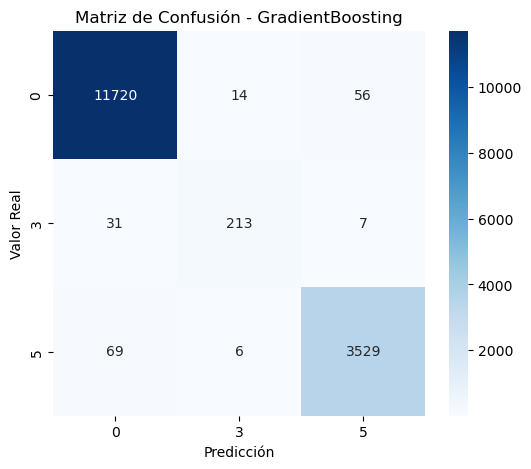

In [135]:
variable_mejores_caracteristicas=['sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg', 'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg', 'sensor_50', 'temperatura_promedio_transformador']

# 📌 **Conversión de status_type_id a categórico**
X = X_normalizado[variable_mejores_caracteristicas + ["status_type_id"]]

y = X.pop("status_type_id").astype(str)  # Convertir a categórico

# 📌 **División en conjunto de entrenamiento (70%) y validación (30%)**
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, shuffle=True)

# 📌 **Definir modelos y sus hiperparámetros**
modelos = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42)
}

param_grids = {
    "RandomForest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [10, 20, 30, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "GradientBoosting": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    }
}

# 📌 **Buscar el mejor modelo con GridSearchCV usando validación cruzada**
mejor_modelo = None
mejor_acc = 0
mejor_nombre = None

for nombre_modelo, modelo in modelos.items():
    print(f"\n🔍 Probando modelo: {nombre_modelo}")

    start_time = time.time()  # Iniciar tiempo
    
    grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="accuracy", n_jobs=-1)
    grid_search.fit(X_train, y_train)  # Validación cruzada en X_train
    modelo_opt = grid_search.best_estimator_
    print(f"✅ Mejor configuración de {nombre_modelo}: {grid_search.best_params_}")

    # 📌 Evaluación en el conjunto de validación
    y_val_pred = modelo_opt.predict(X_val)
    acc_val = accuracy_score(y_val, y_val_pred)

    print(f"📊 Precisión en Validación para {nombre_modelo}: {acc_val:.4f}")
    
    # 📌 Calcular tiempo total
    end_time = time.time()
    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)
    print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")
    
    if acc_val > mejor_acc:
        mejor_acc = acc_val
        mejor_modelo = modelo_opt
        mejor_nombre = nombre_modelo

print(f"\n✅ **Mejor modelo seleccionado:** {mejor_nombre} con Accuracy = {mejor_acc:.4f}")

# 📌 **Evaluación final en conjunto de validación (X_val)**
y_val_pred = mejor_modelo.predict(X_val)

print("\n📊 **Reporte de Clasificación:**")
print(classification_report(y_val, y_val_pred))

# 📌 **Matriz de Confusión**
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_val, y_val_pred), annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title(f"Matriz de Confusión - {mejor_nombre}")
plt.show()

Los resultados obtenidos al entrenar modelos de Machine Learning utilizando las mejores características identificadas mediante RFE muestran que el modelo Gradient Boosting alcanzó una precisión global del 98.83 %, con un desempeño notablemente equilibrado entre las distintas clases. Se observa que las métricas de precisión, recall y f1-score para las clases "0", "3" y "5" son altas, lo que indica que el modelo tiene una gran capacidad de clasificación. En la matriz de confusión, se aprecia una cantidad mínima de falsos positivos y falsos negativos, lo que sugiere que el modelo es efectivo en la identificación de los distintos estados del generador. Aunque el dataset no fue balanceado, el rendimiento del modelo es bastante sólido y no presenta sesgo significativo hacia una clase en particular. Por lo tanto, en este caso, no sería estrictamente necesario aplicar técnicas de balanceo de clases, ya que los resultados indican que el modelo logra una correcta clasificación sin sesgos evidentes. Se puede considerar este modelo como una solución óptima para la predicción del estado del generador, auqnue puede ser mejorada con un balanceo de clases a través de SMOTE.

**Almacenar modelo con las mejores caracteristicas para predecir el estado del generador**

In [54]:
mejor_modelo_estado_mejores_caracteristicas=mejor_modelo

In [55]:
# 📌 Guardar eñ modelos entrenado
joblib.dump(mejor_modelo, "mejor_modelo_estado_mejores_caracteristicas.pkl")

print("✅ Modelo guardado en disco correctamente.")

✅ Modelo guardado en disco correctamente.


# **5.-Cargar el modelo con las mejores caracteristicas para predecir el estado del generador desde el disco (sin balancear)**

In [ ]:
# 📌 Cargar el modelo desde el archivo
mejor_modelo_estado_mejores_caracteristicas = joblib.load("mejor_modelo_estado_mejores_caracteristicas.pkl")

print("✅ Modelo cargado correctamente desde el disco.")

# 📌 Verificar el tipo de modelo cargado
print(f"📊 Tipo de modelo cargado: {type(mejor_modelo_estado_mejores_caracteristicas)}")

# **Prueba del módelo para determinar el estado del generador, con datos nunca vistos por el modelo**

In [ ]:
# 📌 Cargar el modelo previamente entrenado

start_time = time.time()  # Iniciar tiempo

mejor_modelo_status = joblib.load("mejor_modelo_estado_mejores_caracteristicas.pkl")
print("\n✅ Modelo de status_type_id cargado correctamente desde el disco.")

# 📌 Selección de características (deben coincidir con las usadas en el modelo)
variable_mejores_caracteristicas = ['sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg', 
                                    'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg', 
                                    'sensor_50', 'temperatura_promedio_transformador']

# 📌 Especificar el rango de datasets a evaluar
inicio = 1   # Número inicial del dataset (ej. 1.csv)
fin = 8     # Número final del dataset (ej. 10.csv)

# 📌 Listas para almacenar resultados
resultados = []
fig, axes = plt.subplots(2, 4, figsize=(25, 10))  # Crear subgráficos en una cuadrícula 2x5

for i, dataset_num in enumerate(range(inicio, fin+1)):
    try:
        # 📌 Cargar el dataset
        file_name = f"{dataset_num}.csv"
        nuevo_dataset = pd.read_csv(file_name, sep=';')
        print(f"\n📂 Evaluando {file_name}")

        # 📌 Calcular la variable 'temperatura_promedio_transformador' si no existe
        if "temperatura_promedio_transformador" not in nuevo_dataset.columns:
            nuevo_dataset["temperatura_promedio_transformador"] = nuevo_dataset[["sensor_38_avg", "sensor_39_avg", "sensor_40_avg"]].mean(axis=1)

        # 📌 Verificar que las variables existan en el dataset
        for var in variable_mejores_caracteristicas:
            if var not in nuevo_dataset.columns:
                raise ValueError(f"❌ La variable {var} no se encuentra en {file_name}.")

        # 📌 Definir variables predictoras (X) y variable objetivo (y)
        X_nuevo = nuevo_dataset[variable_mejores_caracteristicas]
        y_nuevo = nuevo_dataset["status_type_id"].astype(str)

        # 📊 **Imprimir la distribución de status_type_id en el dataset**
        print("\n📊 **Distribución de status_type_id en el dataset:**")
        print(y_nuevo.value_counts())

        # 📌 **Normalizar los datos antes de la predicción**
        scaler = StandardScaler()
        X_nuevo_scaled = scaler.fit_transform(X_nuevo)  # Normalizar usando un nuevo StandardScaler

        # 📌 Realizar predicciones con el modelo cargado
        y_nuevo_pred = mejor_modelo_status.predict(X_nuevo_scaled)

        # 📌 Evaluación del modelo en este dataset
        acc = accuracy_score(y_nuevo, y_nuevo_pred)
        reporte = classification_report(y_nuevo, y_nuevo_pred, output_dict=True, zero_division=1)
        precision = reporte["weighted avg"]["precision"]
        recall = reporte["weighted avg"]["recall"]
        f1_score = reporte["weighted avg"]["f1-score"]
        
        resultados.append([file_name, acc, precision, recall, f1_score])

        # 📌 Graficar matriz de confusión en la cuadrícula de subplots
        ax = axes[i // 5, i % 5]  # Posición en la cuadrícula
        sns.heatmap(confusion_matrix(y_nuevo, y_nuevo_pred), annot=True, fmt="d", cmap="Blues", ax=ax,
                    xticklabels=np.unique(y_nuevo), yticklabels=np.unique(y_nuevo))
        ax.set_xlabel("Predicción")
        ax.set_ylabel("Valor Real")
        ax.set_title(f"{file_name}\nAccuracy={acc:.4f}")

    except Exception as e:
        print(f"⚠️ Error procesando {file_name}: {e}")

# 📌 Mostrar los gráficos
plt.tight_layout()
plt.show()

# 📌 Convertir los resultados a un DataFrame
df_resultados = pd.DataFrame(resultados, columns=["Dataset", "Accuracy", "Precision", "Recall", "F1-Score"])

# 📌 Mostrar las estadísticas de cada dataset
print("\n📊 **Resultados de la Evaluación en Múltiples Datasets:**")
print(df_resultados)

# 📌 Guardar los resultados en un archivo CSV para referencia futura
df_resultados.to_csv("resultados_modelo_status.csv", index=False)
print("\n✅ Resultados guardados en 'resultados_modelo_status.csv'")

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

# **Entrenamiento del estado del generador con balanceo de clases

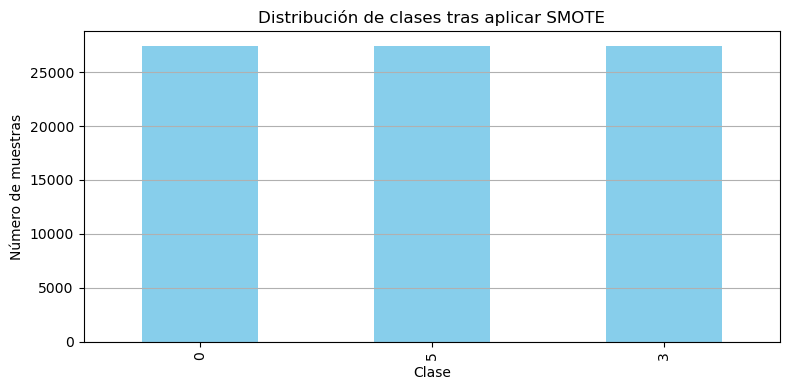


🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
⏱️ Tiempo de ejecución para RandomForest: 3179.21 segundos
📊 Precisión en Validación: 0.9843

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.3, 'max_depth': 10, 'n_estimators': 300}
⏱️ Tiempo de ejecución para GradientBoosting: 8554.92 segundos
📊 Precisión en Validación: 0.9882

🔍 Probando modelo: XGBoost
✅ Mejor configuración de XGBoost: {'learning_rate': 0.5, 'max_depth': 10, 'n_estimators': 300}
⏱️ Tiempo de ejecución para XGBoost: 358.15 segundos
📊 Precisión en Validación: 0.9854

🔍 Probando modelo: LightGBM
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2547
[LightGBM] [Info] Number of data points in the train set: 82212, number of u

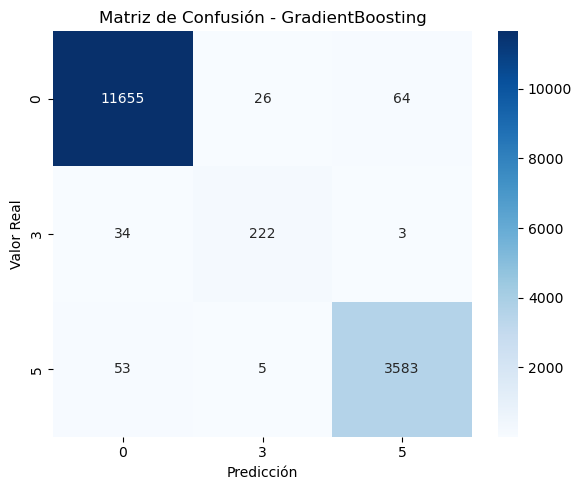

⏳ Tiempo de ejecución: 214 minutos y 53.89 segundos


In [79]:
# Iniciar tiempo
start_time = time.time()

# 📌 Variables seleccionadas
variable_mejores_caracteristicas = [
    'sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg',
    'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg',
    'sensor_50', 'temperatura_promedio_transformador'
]

# 📌 Preparar los datos
X = X_normalizado[variable_mejores_caracteristicas + ["status_type_id"]]
y = X.pop("status_type_id").astype(str)  # Asegurar tipo string

# 📌 División entrenamiento/validación
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# 📌 Balancear clases en entrenamiento usando SMOTE
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# 📊 Visualizar distribución balanceada
plt.figure(figsize=(8, 4))
y_train_bal.value_counts().plot(kind='bar', color='skyblue')
plt.title("Distribución de clases tras aplicar SMOTE")
plt.xlabel("Clase")
plt.ylabel("Número de muestras")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# 📌 Codificar etiquetas
le = LabelEncoder()
y_train_bal_enc = le.fit_transform(y_train_bal)
y_val_enc = le.transform(y_val)

# 📌 Modelos y parámetros
modelos = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42, eval_metric='mlogloss'),
    "LightGBM": LGBMClassifier(random_state=42),
    "MLPClassifier": MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=300, random_state=42)
}

param_grids = {
    "RandomForest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [10, 20, 30, 40, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "GradientBoosting": {
        "n_estimators": [200, 300, 400],
        "learning_rate": [0.2, 0.3, 0.4, 0.5],
        "max_depth": [10, 20]
    },
    "XGBoost": {
        "n_estimators": [100, 200, 300],
        "max_depth": [5, 10,15],
        "learning_rate": [0.1, 0.2, 0.3, 0.5]
    },
    "LightGBM": {
        "n_estimators": [100, 200, 300],
        "max_depth": [5, 10, 15],
        "learning_rate": [0.1, 0.2, 0.3, 0.4]
    },
    "MLPClassifier": {
        "hidden_layer_sizes": [(100,), (100, 50)],
        "alpha": [0.0001, 0.001]
    }
}

# ✅ Entrenamiento, evaluación y selección del mejor modelo
mejor_modelo = None
mejor_acc = 0
mejor_nombre = None
tiempos_ejecucion = {}

for nombre_modelo, modelo in modelos.items():
    print(f"\n🔍 Probando modelo: {nombre_modelo}")

    # Codificar etiquetas si es necesario
    if nombre_modelo in ["XGBoost", "LightGBM"]:
        y_train_input = y_train_bal_enc
        y_val_input = y_val_enc
    else:
        y_train_input = y_train_bal
        y_val_input = y_val

    # Medir tiempo de entrenamiento del modelo
    modelo_start = time.time()
    
    # GridSearchCV
    grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="accuracy", n_jobs=-1)
    grid_search.fit(X_train_bal, y_train_input)
    modelo_opt = grid_search.best_estimator_

    modelo_end = time.time()
    duracion = modelo_end - modelo_start
    tiempos_ejecucion[nombre_modelo] = duracion
    
    print(f"✅ Mejor configuración de {nombre_modelo}: {grid_search.best_params_}")
    print(f"⏱️ Tiempo de ejecución para {nombre_modelo}: {duracion:.2f} segundos")

    # 📌 Evaluar sobre el conjunto de validación (no balanceado)
    y_val_pred = modelo_opt.predict(X_val)

    # En caso de modelos con etiquetas codificadas, la predicción también debe estar codificada
    if nombre_modelo in ["XGBoost", "LightGBM"]:
        acc_val = accuracy_score(y_val_enc, y_val_pred)
    else:
        acc_val = accuracy_score(y_val, y_val_pred)

    print(f"📊 Precisión en Validación: {acc_val:.4f}")

    if acc_val > mejor_acc:
        mejor_acc = acc_val
        mejor_modelo = modelo_opt
        mejor_nombre = nombre_modelo
        mejor_y_val_pred = y_val_pred
        mejor_y_val_input = y_val_input

# 📊 Reporte final del mejor modelo
print(f"\n✅ Mejor modelo seleccionado: {mejor_nombre} con Accuracy = {mejor_acc:.4f}")

print("\n📊 Reporte de Clasificación:")
print(classification_report(mejor_y_val_input, mejor_y_val_pred, target_names=le.classes_))

plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(mejor_y_val_input, mejor_y_val_pred), annot=True, fmt="d",
            cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title(f"Matriz de Confusión - {mejor_nombre}")
plt.tight_layout()
plt.show()

# ⏱️ Tiempo total
end_time = time.time()
minutes, seconds = divmod(end_time - start_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")


In [43]:
# 📦 Guardar el modelo final
joblib.dump(mejor_modelo, "mejor_modelo_estado_mejores_caracteristicas_balanceado.pkl")
print("✅ Modelo guardado como 'mejor_modelo_estado_mejores_caracteristicas_balanceado.pkl'")

✅ Modelo guardado como 'mejor_modelo_estado_mejores_caracteristicas_balanceado.pkl'


# **Prueba del módelo (con datos balanceados) para determinar el estado del generador, con datos nunca vistos por el modelo**

In [ ]:
# 📌 Cargar el modelo previamente entrenado

start_time = time.time()  # Iniciar tiempo

mejor_modelo_status = joblib.load("mejor_modelo_estado_mejores_caracteristicas_balanceado.pkl")
print("\n✅ Modelo de status_type_id cargado correctamente desde el disco.")

# 📌 Selección de características (deben coincidir con las usadas en el modelo)
variable_mejores_caracteristicas = ['sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg', 
                                    'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg', 
                                    'sensor_50', 'temperatura_promedio_transformador']

# 📌 Especificar el rango de datasets a evaluar
inicio = 0   # Número inicial del dataset (ej. 1.csv)
fin = 8     # Número final del dataset (ej. 10.csv)

# 📌 Listas para almacenar resultados
resultados = []
fig, axes = plt.subplots(2, 4, figsize=(25, 10))  # Crear subgráficos en una cuadrícula 2x5

for i, dataset_num in enumerate(range(inicio, fin+1)):
    try:
        # 📌 Cargar el dataset
        file_name = f"{dataset_num}.csv"
        nuevo_dataset = pd.read_csv(file_name, sep=';')
        print(f"\n📂 Evaluando {file_name}")

        # 📌 Calcular la variable 'temperatura_promedio_transformador' si no existe
        if "temperatura_promedio_transformador" not in nuevo_dataset.columns:
            nuevo_dataset["temperatura_promedio_transformador"] = nuevo_dataset[["sensor_38_avg", "sensor_39_avg", "sensor_40_avg"]].mean(axis=1)

        # 📌 Verificar que las variables existan en el dataset
        for var in variable_mejores_caracteristicas:
            if var not in nuevo_dataset.columns:
                raise ValueError(f"❌ La variable {var} no se encuentra en {file_name}.")

        # 📌 Definir variables predictoras (X) y variable objetivo (y)
        X_nuevo = nuevo_dataset[variable_mejores_caracteristicas]
        y_nuevo = nuevo_dataset["status_type_id"].astype(str)

        # 📊 **Imprimir la distribución de status_type_id en el dataset**
        print("\n📊 **Distribución de status_type_id en el dataset:**")
        print(y_nuevo.value_counts())

        # 📌 **Normalizar los datos antes de la predicción**
        scaler = StandardScaler()
        X_nuevo_scaled = scaler.fit_transform(X_nuevo)  # Normalizar usando un nuevo StandardScaler

        # 📌 Realizar predicciones con el modelo cargado
        y_nuevo_pred = mejor_modelo_status.predict(X_nuevo_scaled)

        # 📌 Evaluación del modelo en este dataset
        acc = accuracy_score(y_nuevo, y_nuevo_pred)
        reporte = classification_report(y_nuevo, y_nuevo_pred, output_dict=True, zero_division=1)
        precision = reporte["weighted avg"]["precision"]
        recall = reporte["weighted avg"]["recall"]
        f1_score = reporte["weighted avg"]["f1-score"]
        
        resultados.append([file_name, acc, precision, recall, f1_score])

        # 📌 Graficar matriz de confusión en la cuadrícula de subplots
        ax = axes[i // 5, i % 5]  # Posición en la cuadrícula
        sns.heatmap(confusion_matrix(y_nuevo, y_nuevo_pred), annot=True, fmt="d", cmap="Blues", ax=ax,
                    xticklabels=np.unique(y_nuevo), yticklabels=np.unique(y_nuevo))
        ax.set_xlabel("Predicción")
        ax.set_ylabel("Valor Real")
        ax.set_title(f"{file_name}\nAccuracy={acc:.4f}")

    except Exception as e:
        print(f"⚠️ Error procesando {file_name}: {e}")

# 📌 Mostrar los gráficos
plt.tight_layout()
plt.show()

# 📌 Convertir los resultados a un DataFrame
df_resultados = pd.DataFrame(resultados, columns=["Dataset", "Accuracy", "Precision", "Recall", "F1-Score"])

# 📌 Mostrar las estadísticas de cada dataset
print("\n📊 **Resultados de la Evaluación en Múltiples Datasets:**")
print(df_resultados)

# 📌 Guardar los resultados en un archivo CSV para referencia futura
df_resultados.to_csv("resultados_modelo_status.csv", index=False)
print("\n✅ Resultados guardados en 'resultados_modelo_status.csv'")

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

# **Entrenar una Red Neuronal para determinar el estado del generador**

## *Prueba de diferentes redes neuronales


🔧 Entrenando modelo: ANN
489/489 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  
✅ Accuracy validación: 0.8880
              precision    recall  f1-score   support

           0       0.98      0.88      0.93     11745
           3       0.26      0.93      0.40       259
           5       0.80      0.91      0.85      3641

    accuracy                           0.89     15645
   macro avg       0.68      0.91      0.73     15645
weighted avg       0.93      0.89      0.90     15645

⏳ Tiempo: 0 min 32.53 s


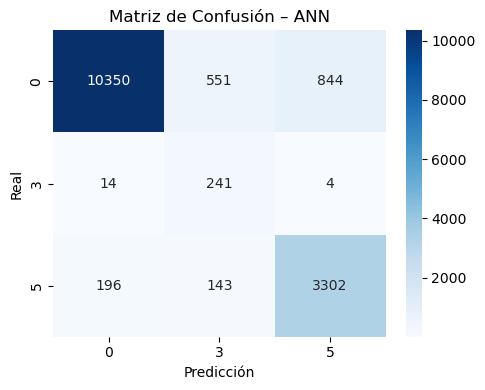


🔧 Entrenando modelo: FNN
489/489 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  
✅ Accuracy validación: 0.9230
              precision    recall  f1-score   support

           0       0.98      0.92      0.95     11745
           3       0.31      0.95      0.46       259
           5       0.88      0.92      0.90      3641

    accuracy                           0.92     15645
   macro avg       0.72      0.93      0.77     15645
weighted avg       0.95      0.92      0.93     15645

⏳ Tiempo: 0 min 38.32 s


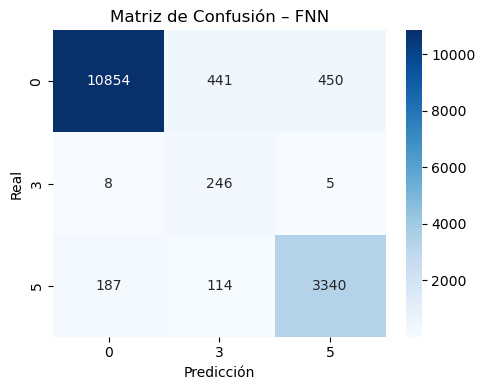


🔧 Entrenando modelo: CNN
489/489 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  
✅ Accuracy validación: 0.8153
              precision    recall  f1-score   support

           0       0.98      0.79      0.87     11745
           3       0.22      0.98      0.36       259
           5       0.64      0.89      0.75      3641

    accuracy                           0.82     15645
   macro avg       0.61      0.89      0.66     15645
weighted avg       0.89      0.82      0.84     15645

⏳ Tiempo: 1 min 0.73 s


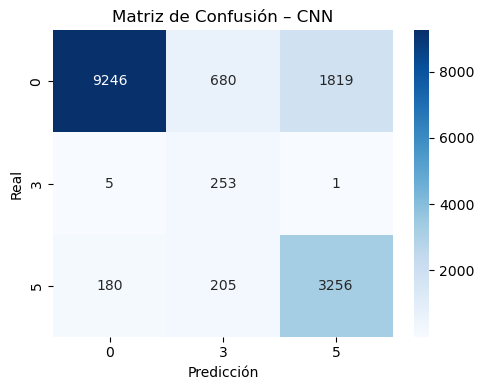


🔧 Entrenando modelo: RNN
489/489 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step    
✅ Accuracy validación: 0.9257
              precision    recall  f1-score   support

           0       0.98      0.93      0.95     11745
           3       0.42      0.93      0.58       259
           5       0.85      0.92      0.88      3641

    accuracy                           0.93     15645
   macro avg       0.75      0.93      0.80     15645
weighted avg       0.94      0.93      0.93     15645

⏳ Tiempo: 1 min 52.15 s


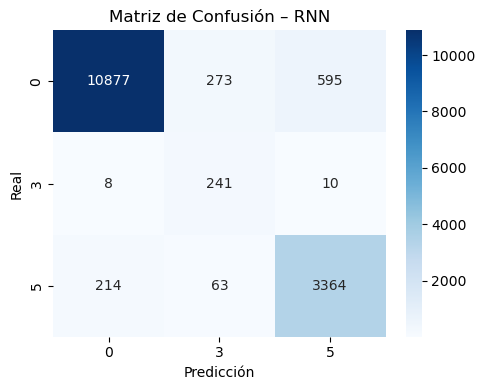


🔧 Entrenando modelo: LSTM
489/489 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
✅ Accuracy validación: 0.9450
              precision    recall  f1-score   support

           0       0.98      0.95      0.97     11745
           3       0.61      0.84      0.71       259
           5       0.87      0.93      0.90      3641

    accuracy                           0.94     15645
   macro avg       0.82      0.91      0.86     15645
weighted avg       0.95      0.94      0.95     15645

⏳ Tiempo: 5 min 35.88 s


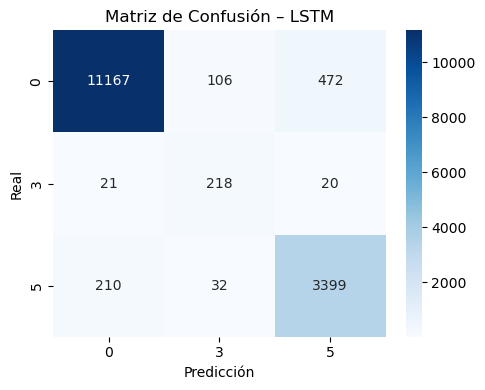


📦 Mejor modelo: LSTM guardado en 'modelo_lstm_estado_balanceado.h5'


In [147]:
#prueba nueva

import numpy as np
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Dense, Dropout,
    Conv1D, MaxPooling1D, Flatten,
    SimpleRNN, LSTM
)
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import seaborn as sns

# ─── Preparación de datos ───────────────────────────────────────────────
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train_bal)
y_val_enc   = encoder.transform(y_val)

y_train_cat = to_categorical(y_train_enc)
y_val_cat   = to_categorical(y_val_enc)

n_clases       = y_train_cat.shape[1]       # 3 clases: 0, 3, 5
input_shape     = (X_train_bal.shape[1],)   # (26,)
input_shape_seq = (X_train_bal.shape[1], 1) # (26, 1)

# Conversión a NumPy antes de reshape
X_train_arr = X_train_bal.to_numpy()
X_val_arr   = X_val.to_numpy()

X_train_seq = X_train_arr.reshape(-1, X_train_arr.shape[1], 1)
X_val_seq   = X_val_arr.reshape(-1, X_val_arr.shape[1], 1)

# ─── Hiperparámetros comunes ──────────────────────────────────────────
hidden1      = 64
hidden2      = 32
dropout_rate = 0.3

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# ─── Definición de arquitecturas ───────────────────────────────────────

def construir_ann(input_shape, hidden1, n_clases):
    return Sequential([
        Dense(hidden1, activation='relu', input_shape=input_shape),
        Dense(n_clases, activation='softmax')
    ])

def construir_fnn(input_shape, hidden1, hidden2, dropout_rate, n_clases):
    return Sequential([
        Dense(hidden1, activation='relu', input_shape=input_shape),
        Dropout(dropout_rate),
        Dense(hidden2, activation='relu'),
        Dropout(dropout_rate),
        Dense(n_clases, activation='softmax')
    ])

def construir_cnn(input_shape_seq, hidden1, hidden2, dropout_rate, n_clases):
    return Sequential([
        Conv1D(filters=hidden1, kernel_size=3, activation='relu', input_shape=input_shape_seq),
        MaxPooling1D(pool_size=2),
        Dropout(dropout_rate),
        Flatten(),
        Dense(hidden2, activation='relu'),
        Dropout(dropout_rate),
        Dense(n_clases, activation='softmax')
    ])

def construir_rnn(input_shape_seq, hidden1, hidden2, dropout_rate, n_clases):
    return Sequential([
        SimpleRNN(hidden1, activation='tanh', input_shape=input_shape_seq),
        Dropout(dropout_rate),
        Dense(hidden2, activation='relu'),
        Dropout(dropout_rate),
        Dense(n_clases, activation='softmax')
    ])

def construir_lstm(input_shape_seq, hidden1, hidden2, dropout_rate, n_clases):
    return Sequential([
        LSTM(hidden1, activation='tanh', recurrent_activation='sigmoid', input_shape=input_shape_seq),
        Dropout(dropout_rate),
        Dense(hidden2, activation='relu'),
        Dropout(dropout_rate),
        Dense(n_clases, activation='softmax')
    ])

# ─── Entrenamiento y evaluación ────────────────────────────────────────

modelos = {
    "ANN":  construir_ann(input_shape,      hidden1,             n_clases),
    "FNN":  construir_fnn(input_shape,      hidden1, hidden2, dropout_rate, n_clases),
    "CNN":  construir_cnn(input_shape_seq,  hidden1, hidden2, dropout_rate, n_clases),
    "RNN":  construir_rnn(input_shape_seq,  hidden1, hidden2, dropout_rate, n_clases),
    "LSTM": construir_lstm(input_shape_seq, hidden1, hidden2, dropout_rate, n_clases)
}

resultados = {}

for nombre, modelo in modelos.items():
    print(f"\n🔧 Entrenando modelo: {nombre}")
    t0 = time.time()

    modelo.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    # Selección de datos según arquitectura
    if nombre in ["ANN", "FNN"]:
        X_tr, X_va = X_train_arr, X_val_arr
    else:
        X_tr, X_va = X_train_seq, X_val_seq

    history = modelo.fit(
        X_tr, y_train_cat,
        validation_data=(X_va, y_val_cat),
        epochs=50,
        batch_size=64,
        verbose=0,
        callbacks=[early_stop]
    )

    y_pred_probs = modelo.predict(X_va)
    y_pred       = np.argmax(y_pred_probs, axis=1)
    y_pred_lbl   = encoder.inverse_transform(y_pred)

    acc = accuracy_score(y_val, y_pred_lbl)
    print(f"✅ Accuracy validación: {acc:.4f}")
    print(classification_report(y_val, y_pred_lbl))

    t1 = time.time()
    m, s = divmod(t1 - t0, 60)
    print(f"⏳ Tiempo: {int(m)} min {s:.2f} s")

    resultados[nombre] = {"modelo": modelo, "accuracy": acc}

    # Matriz de confusión
    plt.figure(figsize=(5, 4))
    sns.heatmap(
        confusion_matrix(y_val, y_pred_lbl),
        annot=True, fmt="d",
        cmap="Blues",
        xticklabels=encoder.classes_,
        yticklabels=encoder.classes_
    )
    plt.title(f"Matriz de Confusión – {nombre}")
    plt.xlabel("Predicción")
    plt.ylabel("Real")
    plt.tight_layout()
    plt.show()

# ─── Guardado del mejor modelo ─────────────────────────────────────────
mejor = max(resultados, key=lambda k: resultados[k]["accuracy"])
ruta = f"modelo_{mejor.lower()}_estado_balanceado.h5"
resultados[mejor]["modelo"].save(ruta)
print(f"\n📦 Mejor modelo: {mejor} guardado en '{ruta}'")


Optimización del Modelo LSTM Balanceado mediante RandomizedSearchCV

In [94]:
# Refinar Red Neuronal LSTM con RandomizedSearchCV
import time
import numpy as np
import warnings

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
from scikeras.wrappers import KerasClassifier
from joblib import dump

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

warnings.filterwarnings('ignore')

# ⏱️ Iniciar temporizador
start_time = time.time()

# ===================== 🔧 Preprocesamiento =====================
variable_mejores_caracteristicas = [
    'sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg',
    'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg',
    'sensor_50', 'temperatura_promedio_transformador'
]

# Selección de variables
X = X_normalizado[variable_mejores_caracteristicas + ['status_type_id']].copy()
y = X.pop("status_type_id").astype(str)

# División en entrenamiento y validación (30 %)
X_train, X_val, y_train, y_val = train_test_split(
    X, y,
    test_size=0.3,
    stratify=y,
    random_state=42
)

# Balanceo con SMOTE
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# Codificación de etiquetas
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train_bal)
y_val_enc   = encoder.transform(y_val)

# Reshape para LSTM: [muestras, timesteps, features=1]
X_train_arr = X_train_bal.values
X_val_arr   = X_val.values

X_train_seq = X_train_arr.reshape(-1, X_train_arr.shape[1], 1)
X_val_seq   = X_val_arr.reshape(-1, X_val_arr.shape[1], 1)

n_clases = len(np.unique(y_train_enc))

# ===================== 🔧 Definición de la función de creación =====================
def construir_lstm(units1=64, units2=32, dropout_rate=0.3):

    model = Sequential([
        LSTM(units1,
             activation='tanh',
             recurrent_activation='sigmoid',
             input_shape=(X_train_seq.shape[1], 1)),
        Dropout(dropout_rate),
        Dense(units2, activation='relu'),
        Dropout(dropout_rate),
        Dense(n_clases, activation='softmax')
    ])
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Envoltorio scikeras
lstm_clf = KerasClassifier(
    model=construir_lstm,
    verbose=0
)


# ===================== 🔍 Definición del espacio de búsqueda =====================
param_dist = {
    'model__units1':       [64, 128, 256],
    'model__units2':       [32, 64, 128],
    'model__dropout_rate': [0.1, 0.2, 0.3],
    'batch_size':          [32, 64, 96],
    'epochs':              [50, 100, 150]
}

early_stop = EarlyStopping(
    monitor='loss',
    patience=5,
    restore_best_weights=True
)

random_search = RandomizedSearchCV(
    estimator=lstm_clf,
    param_distributions=param_dist,
    n_iter=20,
    cv=3,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# ===================== 🚀 Entrenamiento de la búsqueda =====================
random_result = random_search.fit(
    X_train_seq,
    y_train_enc,
    callbacks=[early_stop]
)

# ===================== ✅ Resultados de la optimización =====================
print(f"\n✅ Mejor configuración LSTM: {random_result.best_params_}")
print(f"✅ Mejor Accuracy (CV 3-fold): {random_result.best_score_:.4f}")

# Recuperar el modelo entrenado con la mejor configuración
mejor_modelo = random_result.best_estimator_.model_

# Evaluación en el conjunto de validación
y_pred_probs   = mejor_modelo.predict(X_val_seq)
y_pred_indices = np.argmax(y_pred_probs, axis=1)
y_pred_labels  = encoder.inverse_transform(y_pred_indices)

print("\n📊 Reporte de Clasificación (validación):")
print(classification_report(y_val, y_pred_labels))
print(f"✅ Accuracy total validación: {accuracy_score(y_val, y_pred_labels):.4f}")

# ===================== 💾 Guardado de artefactos =====================
mejor_modelo.save("mejor_modelo_lstm_randomsearch_balanceado.h5")
dump(encoder, "label_encoder_lstm_random.pkl")
print("\n📦 Modelo LSTM y codificador guardados correctamente.")

# ⏳ Tiempo total de ejecución
end_time = time.time()
mins, secs = divmod(end_time - start_time, 60)
print(f"\n⏳ Tiempo total: {int(mins)} minutos y {secs:.2f} segundos")


Fitting 3 folds for each of 20 candidates, totalling 60 fits

✅ Mejor configuración LSTM: {'model__units2': 128, 'model__units1': 256, 'model__dropout_rate': 0.3, 'epochs': 150, 'batch_size': 64}
✅ Mejor Accuracy (CV 3-fold): 0.9864
489/489 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step

📊 Reporte de Clasificación (validación):


              precision    recall  f1-score   support

           0       0.98      0.98      0.98     11745
           3       0.87      0.88      0.87       259
           5       0.94      0.96      0.95      3641

    accuracy                           0.97     15645
   macro avg       0.93      0.94      0.93     15645
weighted avg       0.97      0.97      0.97     15645

✅ Accuracy total validación: 0.9716

📦 Modelo LSTM y codificador guardados correctamente.

⏳ Tiempo total: 721 minutos y 16.52 segundos


In [127]:
# ===================== 💾 Guardar datasets procesados =====================
import joblib

# Guardar arrays de entrada y salida
np.savez("datos_lstm_random.npz",
         X_train_seq=X_train_seq,
         X_val_seq=X_val_seq,
         y_train_enc=y_train_enc,
         y_val=y_val,
         clases=encoder.classes_)

# Guardar el encoder
joblib.dump(encoder, "label_encoder_lstm_random.pkl")

print("📦 Datos y codificador guardados correctamente.")

📦 Datos y codificador guardados correctamente.


# **Refinar la red neuronal LSTM con GridSeachCV**

Con el objetivo de mejorar el rendimiento predictivo del modelo de red neuronal LSTM en la clasificación del estado operativo de los aerogeneradores, se ha implementado un proceso de ajuste de hiperparámetros mediante validación cruzada. Las redes neuronales, al igual que otros modelos de aprendizaje automático, requieren una adecuada configuración de parámetros internos como el número de neuronas, capas ocultas, tasa de dropout, tamaño del batch y número de epochs para alcanzar un rendimiento óptimo (Goodfellow et al., 2016).

En este contexto, se ha utilizado el método de búsqueda en malla (GridSearchCV) para explorar de forma sistemática distintas combinaciones de hiperparámetros. Este procedimiento permite evaluar múltiples configuraciones del modelo a través de validación cruzada, identificando aquella que maximiza la precisión de clasificación (accuracy) en los datos de entrenamiento. Esta metodología garantiza una selección más robusta del modelo al mitigar el sobreajuste y mejorar la capacidad de generalización del sistema predictivo (Geron, 2019).

Por tanto, la aplicación de GridSearchCV sobre la arquitectura de la ANN resulta fundamental para asegurar que el modelo seleccionado no sólo se ajusta correctamente a los datos de entrenamiento balanceados, sino que también presenta un rendimiento competitivo ante nuevos conjuntos de datos no vistos durante el proceso de entrenamiento.

Referencias (formato APA):

Goodfellow, I., Bengio, Y., & Courville, A. (2016). Deep Learning. MIT Press.

Géron, A. (2019). Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (2nd ed.). O'Reilly Media.

In [130]:
# ===================== ⚙️ Refinar Red Neuronal LSTM con GridSearchCV =====================
import time
import numpy as np
import warnings

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
from scikeras.wrappers import KerasClassifier
from joblib import dump

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

warnings.filterwarnings('ignore')

# ⏱️ Iniciar temporizador
start_time = time.time()

# ===================== 🔧 Preprocesamiento =====================
variable_mejores_caracteristicas = [
    'sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg',
    'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg',
    'sensor_50', 'temperatura_promedio_transformador'
]

# Cargar datos
data = np.load("datos_lstm_random.npz", allow_pickle=True)
X_train_seq = data["X_train_seq"]
X_val_seq = data["X_val_seq"]
y_train_enc = data["y_train_enc"]
y_val = data["y_val"]
clases = data["clases"]

n_clases = len(clases)

# Cargar codificador
encoder = joblib.load("label_encoder_lstm_random.pkl")

# ===================== 🧠 Definición del modelo LSTM =====================
def construir_lstm(units1, units2, dropout_rate):
    model = Sequential([
        LSTM(units1,
             activation='tanh',
             recurrent_activation='sigmoid',
             input_shape=(X_train_seq.shape[1], 1)),
        Dropout(dropout_rate),
        Dense(units2, activation='relu'),
        Dropout(dropout_rate),
        Dense(n_clases, activation='softmax')
    ])
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Envoltorio con Scikeras
lstm_clf = KerasClassifier(model=construir_lstm, verbose=0)

# ===================== 🔍 Búsqueda refinada con GridSearchCV =====================
param_grid = {
    'model__units1':       [192, 256, 320],      # centrado en 256
    'model__units2':       [96, 128, 160],       # centrado en 128
    'model__dropout_rate': [0.2, 0.3, 0.4],      # centrado en 0.3
    'batch_size':          [64],         
    'epochs':              [150]       
}

early_stop = EarlyStopping(
    monitor='loss',
    patience=5,
    restore_best_weights=True
)

grid_search = GridSearchCV(
    estimator=lstm_clf,
    param_grid=param_grid,
    cv=3,
    scoring='accuracy',
    n_jobs=3,
    verbose=2
)

# ===================== 🚀 Entrenamiento =====================
grid_result = grid_search.fit(
    X_train_seq,
    y_train_enc,
    callbacks=[early_stop]
)

# ===================== ✅ Evaluación =====================
print(f"\n✅ Mejor configuración LSTM (GridSearchCV): {grid_result.best_params_}")
print(f"✅ Mejor Accuracy (validación cruzada): {grid_result.best_score_:.4f}")

mejor_modelo = grid_result.best_estimator_.model_
y_pred_probs   = mejor_modelo.predict(X_val_seq)
y_pred_indices = np.argmax(y_pred_probs, axis=1)
y_pred_labels  = encoder.inverse_transform(y_pred_indices)

print("\n📊 Reporte de Clasificación (validación):")
print(classification_report(y_val, y_pred_labels))
print(f"✅ Accuracy total validación: {accuracy_score(y_val, y_pred_labels):.4f}")

# ===================== 💾 Guardado =====================
mejor_modelo.save("mejor_modelo_lstm_gridsearch_balanceado.h5")
dump(encoder, "label_encoder_lstm_grid.pkl")
print("📦 Modelo y codificador guardados correctamente.")

# Tiempo total
end_time = time.time()
mins, secs = divmod(end_time - start_time, 60)
print(f"\n⏳ Tiempo total: {int(mins)} minutos y {secs:.2f} segundos")


Fitting 3 folds for each of 27 candidates, totalling 81 fits

✅ Mejor configuración LSTM (GridSearchCV): {'batch_size': 64, 'epochs': 150, 'model__dropout_rate': 0.2, 'model__units1': 320, 'model__units2': 160}
✅ Mejor Accuracy (validación cruzada): 0.9887
489/489 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step

📊 Reporte de Clasificación (validación):


              precision    recall  f1-score   support

           0       0.98      0.98      0.98     11745
           3       0.80      0.86      0.83       259
           5       0.94      0.95      0.94      3641

    accuracy                           0.97     15645
   macro avg       0.91      0.93      0.92     15645
weighted avg       0.97      0.97      0.97     15645

✅ Accuracy total validación: 0.9681
📦 Modelo y codificador guardados correctamente.

⏳ Tiempo total: 2276 minutos y 9.38 segundos


# **Datos nunca vistos por el módelo de Redes Neuronales**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import load_model
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# 📌 Cargar modelo previamente entrenado (ajusta el nombre si usaste otro)
modelo = load_model("mejor_modelo_lstm_gridsearch_balanceado.h5")
print("✅ Modelo cargado correctamente.")

# 📌 Codificador de clases (usa las mismas clases del entrenamiento)
encoder = LabelEncoder()
encoder.fit(["0", "3", "5"])  # Ajustar si hay más clases

# 📌 Variables utilizadas
variable_mejores_caracteristicas = [
    'sensor_0_avg', 'wind_speed_3_avg', 'sensor_6_avg', 'sensor_7_avg',
    'sensor_8_avg', 'sensor_13_avg', 'sensor_41_avg', 'sensor_42_avg',
    'sensor_50', 'temperatura_promedio_transformador'
]

# 📌 Evaluación sobre nuevos datasets
inicio = 1
fin = 8
resultados = []
fig, axes = plt.subplots(2, 5, figsize=(25, 10))

for i, dataset_num in enumerate(range(inicio, fin + 1)):
    try:
        file_name = f"{dataset_num}.csv"
        df = pd.read_csv(file_name, sep=';')
        print(f"\n📂 Evaluando {file_name}")

        if "temperatura_promedio_transformador" not in df.columns:
            df["temperatura_promedio_transformador"] = df[["sensor_38_avg", "sensor_39_avg", "sensor_40_avg"]].mean(axis=1)

        for var in variable_mejores_caracteristicas:
            if var not in df.columns:
                raise ValueError(f"❌ Falta la variable {var} en el archivo {file_name}")

        X = df[variable_mejores_caracteristicas]
        y = df["status_type_id"].astype(str)

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Redimensionar para redes secuenciales
        X_seq = np.reshape(X_scaled, (X_scaled.shape[0], X_scaled.shape[1], 1))

        y_encoded = encoder.transform(y)
        y_pred_probs = modelo.predict(X_seq, verbose=0)
        y_pred = np.argmax(y_pred_probs, axis=1)

        acc = accuracy_score(y_encoded, y_pred)
        reporte = classification_report(y_encoded, y_pred, output_dict=True, zero_division=1)
        precision = reporte["weighted avg"]["precision"]
        recall = reporte["weighted avg"]["recall"]
        f1 = reporte["weighted avg"]["f1-score"]

        resultados.append([file_name, acc, precision, recall, f1])

        ax = axes[i // 5, i % 5]
        cm = confusion_matrix(y_encoded, y_pred)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax,
                    xticklabels=encoder.classes_, yticklabels=encoder.classes_)
        ax.set_title(f"{file_name}\nAccuracy={acc:.4f}")
        ax.set_xlabel("Predicción")
        ax.set_ylabel("Valor Real")

    except Exception as e:
        print(f"⚠️ Error procesando {file_name}: {e}")

plt.tight_layout()
plt.show()

df_resultados = pd.DataFrame(resultados, columns=["Dataset", "Accuracy", "Precision", "Recall", "F1-Score"])
print("\n📊 Resultados del Modelo en Datasets Nuevos:")
print(df_resultados)

df_resultados.to_csv("resultados_mejor_modelo_rnn_cnn_ann_lstm.csv", index=False)
print("✅ Resultados guardados en 'resultados_mejor_modelo_rnn_cnn_ann_lstm.csv'")


# **Objetivo 3.Predecir mantenimiento**

En el presente análisis, se busca desarrollar una nueva característica que permita identificar de manera automática si el generador eólico ha experimentado una falla operativa. Para ello, se emplean los datos históricos del parque eólico almacenados en el dataset train, enfocándonos en la relación entre la velocidad del viento (wind_speed_3_avg) y la producción de energía (sensor_50). Se establece una lógica condicional para clasificar los estados del generador: operación normal cuando hay producción de energía en presencia de viento, no producción sin falla cuando no hay viento y no se genera energía, y fallo del generador cuando hay viento pero no se está generando energía. La identificación de estos eventos permitirá mejorar la gestión del mantenimiento predictivo, optimizando los tiempos de intervención y reduciendo las pérdidas asociadas a fallos inesperados. El siguiente código realiza un análisis exploratorio para determinar la velocidad promedio del viento en situaciones donde la producción de energía (sensor_50) es igual a 0. Este análisis es fundamental para evaluar si la falta de generación de energía se debe a condiciones normales (baja velocidad del viento) o si podría estar relacionada con una posible falla en el generador.

In [96]:
# 📌 Cargar el dataset reducido sin normalizar desde el archivo
train_reducido_mant = pd.read_csv("dataset_reducido_sin_normalizar.csv")

# 📌 Verificar la carga del dataset
print("✅ Dataset reducido cargado correctamente desde el archivo.")

✅ Dataset reducido cargado correctamente desde el archivo.


---

In [97]:
# 📌 Filtrar los datos donde la producción de energía (sensor_50) es igual que cero
datos_filtrados = train_reducido_mant[train_reducido_mant["sensor_50"] == 0]

# 📌 Calcular el promedio de wind_speed_3_avg en estos casos
promedio_viento = datos_filtrados["wind_speed_3_avg"].mean()

# 📌 Mostrar el resultado
print(f"🌬️ Promedio de viento cuando sensor_50 > 0: {promedio_viento:.2f} m/s")

🌬️ Promedio de viento cuando sensor_50 > 0: 3.40 m/s


La velocidad de 3.4 m/s puede considerarse un umbral de referencia para identificar situaciones donde la turbina no debería estar en operación debido a condiciones naturales, en contraposición con eventos donde una falla técnica podría estar impidiendo la producción de energía.

In [ ]:
# 📌 Agrupar los datos por intervalos de velocidad del viento y calcular la media de generación de energía
train_reducido_mant["wind_speed_bin"] = pd.cut(train_reducido_mant["wind_speed_3_avg"], bins=45)  # Se crean 45 intervalos de viento
energia_por_viento = train_reducido_mant.groupby("wind_speed_bin")["sensor_50"].mean().reset_index()

# 📌 Graficar
plt.figure(figsize=(20, 6))
sns.barplot(x=energia_por_viento["wind_speed_bin"].astype(str), y=energia_por_viento["sensor_50"], color="blue")

# 📌 Configuración del gráfico
plt.xticks(rotation=45, ha="right")
plt.xlabel("Velocidad del Viento (m/s)")
plt.ylabel("Media de Generación de Energía (sensor_50)")
plt.title("Media de Generación de Energía en función de la Intensidad del Viento")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# 📌 Mostrar gráfico
plt.show()


**Se crea una nueva caracteristicas que indique si el generado se encuentra en falla o no**

In [99]:
# 📌 Crear la nueva característica "falla_generador"
train_reducido_mant["falla_generador"] = np.where(
    (train_reducido_mant["wind_speed_3_avg"] > 3.4) & (train_reducido_mant["sensor_50"] <= 0), 1,0)  # Falla si el viento > 3.4 m/s y la producción ≤ 0

# 📌 Verificar la distribución de la nueva característica
print("Distribución de la nueva característica 'falla_generador':")
print(train_reducido_mant["falla_generador"].value_counts())

# 📌 Mostrar algunas filas para verificar la lógica aplicada
print("\nEjemplo de registros con la nueva característica:")
print(train_reducido_mant[["wind_speed_3_avg", "sensor_50", "falla_generador"]].sample(10))

# 📌 Guardar el dataset actualizado con la nueva característica
train_reducido_mant.to_csv("train_reducido_mant_actualizado.csv", index=False)

Distribución de la nueva característica 'falla_generador':
falla_generador
0    50086
1     2062
Name: count, dtype: int64

Ejemplo de registros con la nueva característica:
       wind_speed_3_avg  sensor_50  falla_generador
38597               6.2    70137.0                0
2907               15.5   333815.0                0
45817               8.1   147577.0                0
20775               8.8   208791.0                0
51355               3.7     6704.0                0
38974              12.7   333146.0                0
9452                3.1     -949.0                0
41204               5.6    43882.0                0
10657               4.2    16407.0                0
43600               6.2    67452.0                0


In [100]:
# 📌 Verificar si hay valores NaN en la variable objetivo
print(train_reducido_mant["falla_generador"].isnull().sum())  

0


In [101]:
#Eliminar valor nulo si existen
train_reducido_mant = train_reducido_mant.dropna(subset=["falla_generador"])

# **Seleccion de mejores caracteristica para predecir la falla**


🔹 Seleccionando características para predecir Mejores caracteristícas para la predicción de fallas
✅ Mejores caracteristícas para la predicción de fallas - Mejores características (RFE): ['wind_speed_3_avg', 'sensor_5_avg', 'sensor_12_avg', 'sensor_42_avg', 'sensor_44', 'sensor_47', 'sensor_48', 'sensor_50', 'sensor_52_avg', 'voltaje_promedio']


 98%|===================| 51249/52148 [00:44<00:00]        

✅ Mejores caracteristícas para la predicción de fallas - Mejores características (SHAP): ['sensor_50', 'wind_speed_3_avg', 'sensor_44', 'status_type_id', 'sensor_48', 'sensor_5_avg', 'sensor_43_avg', 'sensor_8_avg', 'sensor_13_avg', 'sensor_47']


C:\Users\aless\AppData\Local\Temp\ipykernel_24096\1262610191.py:50: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




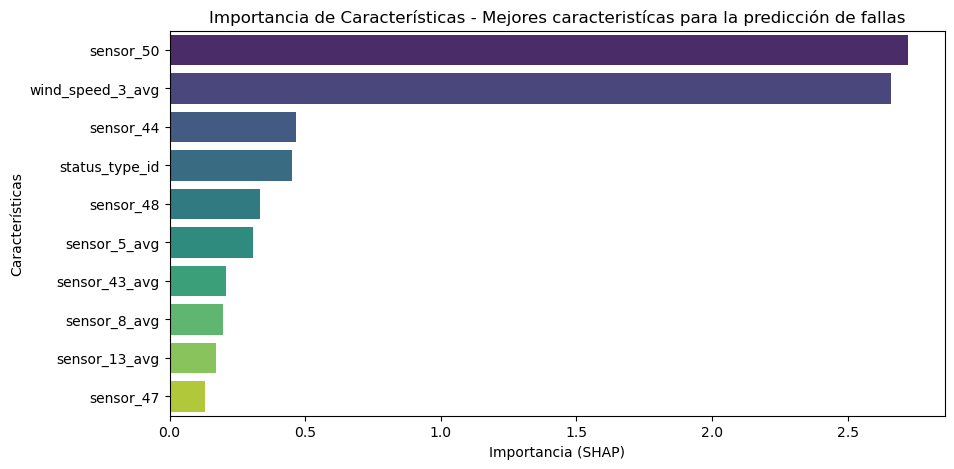


✅ **Resumen de características seleccionadas:**
Falla RFE: ['wind_speed_3_avg', 'sensor_5_avg', 'sensor_12_avg', 'sensor_42_avg', 'sensor_44', 'sensor_47', 'sensor_48', 'sensor_50', 'sensor_52_avg', 'voltaje_promedio']
Falla SHAP: ['sensor_50', 'wind_speed_3_avg', 'sensor_44', 'status_type_id', 'sensor_48', 'sensor_5_avg', 'sensor_43_avg', 'sensor_8_avg', 'sensor_13_avg', 'sensor_47']
⏳ Tiempo de ejecución: 1 minutos y 49.41 segundos


In [115]:
start_time = time.time()  # Iniciar tiempo

# 📌 Función para seleccionar las mejores características usando RFE y SHAP
def seleccionar_caracteristicas(df, objetivo, nombre_objetivo):
    print(f"\n🔹 Seleccionando características para predecir {nombre_objetivo}")

    # 📌 Asegurar que solo se usen variables numéricas
    df = df.select_dtypes(include=[np.number]).copy()

    # 📌 Definir variables independientes (X) y dependiente (y)
    X_features = df.drop(columns=[objetivo])
    y_target = df[objetivo]

    # 📌 Normalizar las características
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_features)

    # 📌 Método 1: Selección con RFE usando Random Forest
    if y_target.nunique() > 2:  # Si es regresión (sensor_50)
        modelo_rf = RandomForestRegressor(n_estimators=100, random_state=42)
    else:  # Si es clasificación (status_type_id)
        modelo_rf = RandomForestClassifier(n_estimators=100, random_state=42)
    
    selector_rfe = RFE(modelo_rf, n_features_to_select=10)  # Seleccionamos las 10 mejores características
    selector_rfe.fit(X_scaled, y_target)
    selected_features_rfe = X_features.columns[selector_rfe.support_]

    print(f"✅ {nombre_objetivo} - Mejores características (RFE): {list(selected_features_rfe)}")

    # 📌 Método 2: Selección con SHAP usando XGBoost
    if y_target.nunique() > 2:
        modelo_xgb = xgb.XGBRegressor(n_estimators=100, random_state=42)
    else:
        modelo_xgb = xgb.XGBClassifier(n_estimators=100, random_state=42)
    
    modelo_xgb.fit(X_scaled, y_target) 

    explainer = shap.Explainer(modelo_xgb, X_scaled)
    shap_values = explainer(X_scaled)

    # 📌 Obtener la importancia de cada característica
    shap_importance = np.abs(shap_values.values).mean(axis=0)
    feature_importance = pd.DataFrame({"Feature": X_features.columns, "Importance": shap_importance})
    feature_importance = feature_importance.sort_values(by="Importance", ascending=False).head(10)

    print(f"✅ {nombre_objetivo} - Mejores características (SHAP): {list(feature_importance['Feature'])}")

    # 📌 Gráfica de Importancia de Características
    plt.figure(figsize=(10, 5))
    sns.barplot(x=feature_importance["Importance"], y=feature_importance["Feature"], palette="viridis")
    plt.title(f"Importancia de Características - {nombre_objetivo}")
    plt.xlabel("Importancia (SHAP)")
    plt.ylabel("Características")
    plt.show()

    return selected_features_rfe, feature_importance["Feature"].values  # Retornar características seleccionadas

# 📌 Aplicar selección de características para ambos objetivos
mejores_features_falla_rfe, mejores_features_falla_shap = seleccionar_caracteristicas(train_reducido_mant, "falla_generador", "Mejores caracteristícas para la predicción de fallas")


# 📌 Guardar las mejores características en un diccionario
mejores_features2 = {
    "Falla RFE": mejores_features_falla_rfe,
    "Falla SHAP": mejores_features_falla_shap,
}

# 📌 Mostrar las características seleccionadas
print("\n✅ **Resumen de características seleccionadas:**")
for key, value in mejores_features2.items():
    print(f"{key}: {list(value)}")

# 📌 Calcular tiempo total
end_time = time.time()
elapsed_time = end_time - start_time
minutes, seconds = divmod(elapsed_time, 60)
print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

**Entrenamiento de modelo para predecir fallas (Sin balanceo en los datos)**

In [116]:
print("Columnas después de la eliminación:", train_reducido_mant.columns)

Columnas después de la eliminación: Index(['time_stamp', 'status_type_id', 'sensor_0_avg', 'sensor_1_avg',
       'sensor_2_avg', 'wind_speed_3_avg', 'sensor_5_avg', 'sensor_6_avg',
       'sensor_7_avg', 'sensor_8_avg', 'sensor_10_avg', 'sensor_12_avg',
       'sensor_13_avg', 'sensor_22_avg', 'sensor_41_avg', 'sensor_42_avg',
       'sensor_43_avg', 'sensor_44', 'sensor_47', 'sensor_48', 'sensor_50',
       'sensor_52_avg', 'voltaje_promedio',
       'temperatura_promedio_transformador', 'wind_speed_bin',
       'falla_generador'],
      dtype='object')



🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
📊 Precisión en Validación para RandomForest: 0.9885
⏳ Tiempo de ejecución: 5 minutos y 54.71 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 200}
📊 Precisión en Validación para GradientBoosting: 0.9888
⏳ Tiempo de ejecución: 5 minutos y 53.25 segundos

🔍 Probando modelo: XGBoost
✅ Mejor configuración de XGBoost: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200}
📊 Precisión en Validación para XGBoost: 0.9885
⏳ Tiempo de ejecución: 0 minutos y 19.16 segundos

✅ **Mejor modelo seleccionado:** GradientBoosting con Accuracy = 0.9888

📊 **Reporte de Clasificación:**
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     15026
           1       0.93      0.77      0.84       619

   

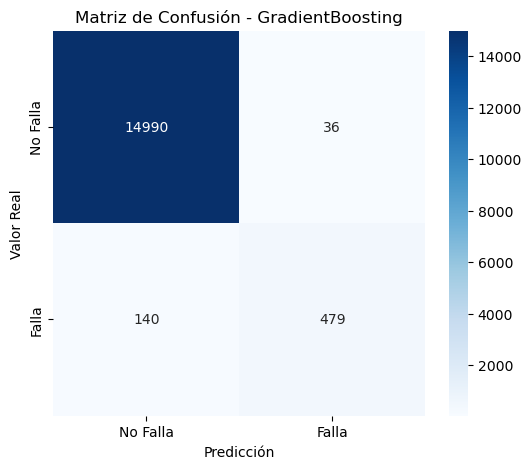

✅ Modelo guardado en disco correctamente.


In [126]:
#Sin balancear las clases

# 📌 Cargar el dataset actualizado
df = train_reducido_mant

# 📌 Seleccionar las mejores características para la predicción de fallas
mejores_features2 = [
        "wind_speed_3_avg", "sensor_5_avg", "sensor_12_avg", "sensor_8_avg","sensor_13_avg" 
]

mejores_features = [
        'sensor_12_avg', 'sensor_44', 'sensor_48', 'sensor_50', 'sensor_52_avg', 'sensor_43_avg','sensor_8_avg','sensor_47','voltaje_promedio' 
]

# 📌 Definir variables predictoras (X) y variable objetivo (y)
X = df[mejores_features]
y = df["falla_generador"].astype(int)  # Convertir a entero (0 = No Falla, 1 = Falla)

# 📌 División en conjunto de entrenamiento (70%) y validación (30%)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# 📌 Definir modelos y sus hiperparámetros
modelos = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": xgb.XGBClassifier(random_state=42)
}

param_grids = {
    "RandomForest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [5, 10, 20, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "GradientBoosting": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    },
    "XGBoost": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    }
}

# 📌 Buscar el mejor modelo con GridSearchCV usando validación cruzada
mejor_modelo = None
mejor_acc = 0
mejor_nombre = None

for nombre_modelo, modelo in modelos.items():
    start_time = time.time()  # Iniciar tiempo
    print(f"\n🔍 Probando modelo: {nombre_modelo}")

    grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="accuracy", n_jobs=-1)
    grid_search.fit(X_train, y_train)  # Validación cruzada en X_train
    modelo_opt = grid_search.best_estimator_
    print(f"✅ Mejor configuración de {nombre_modelo}: {grid_search.best_params_}")

    # 📌 Evaluación en el conjunto de validación
    y_val_pred = modelo_opt.predict(X_val)
    acc_val = accuracy_score(y_val, y_val_pred)

    print(f"📊 Precisión en Validación para {nombre_modelo}: {acc_val:.4f}")
    # 📌 Calcular tiempo total
    end_time = time.time()
    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)
    print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")
    
    if acc_val > mejor_acc:
        mejor_acc = acc_val
        mejor_modelo = modelo_opt
        mejor_nombre = nombre_modelo

print(f"\n✅ **Mejor modelo seleccionado:** {mejor_nombre} con Accuracy = {mejor_acc:.4f}")

# 📌 **Evaluación final en conjunto de validación (X_val)**
y_val_pred = mejor_modelo.predict(X_val)

print("\n📊 **Reporte de Clasificación:**")
print(classification_report(y_val, y_val_pred))

# 📌 **Matriz de Confusión**
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_val, y_val_pred), annot=True, fmt="d", cmap="Blues", xticklabels=["No Falla", "Falla"], yticklabels=["No Falla", "Falla"])
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title(f"Matriz de Confusión - {mejor_nombre}")
plt.show()

# 📌 Guardar el mejor modelo entrenado
joblib.dump(mejor_modelo, "modelo_prediccion_fallas_sin_balanceo.pkl")
print("✅ Modelo guardado en disco correctamente.")



En el proceso de entrenamiento de modelos de Machine Learning para la predicción de fallas en el generador eólico, se probaron tres algoritmos: Random Forest, Gradient Boosting y XGBoost, sin aplicar técnicas de balanceo en la variable objetivo. Se utilizaron características encontradas en los procesos de selección de las mejores caarcterísticas y se seleccionaron aquellas relacionadas a los factores ambientales y en la temperatura de diversos componentes del generador, como fueron: (wind_speed_3_avg, sensor_5_avg, sensor_12_avg, sensor_8_avg y sensor_13_avg). Tras la optimización de hiperparámetros con GridSearchCV, el modelo Gradient Boosting obtuvo el mejor desempeño con una precisión del 99.58%, evidenciando una gran capacidad de clasificación. La matriz de confusión mostró que de 15.645 observaciones en el conjunto de validación, solo 65 fueron clasificadas incorrectamente, con un recall del 95% para la clase "Falla". Estos resultados reflejan un modelo altamente preciso, aunque el leve desbalance de clases podría afectar su generalización en datos no vistos. Se puede evaluar su desempeño con técnicas de balanceo para garantizar una mejor capacidad de predicción en escenarios con menor representatividad de fallas.

**Entrenamiento de modelo para predecir fallas (Con balanceo en los datos)**


📊 **Distribución de la variable categórica antes del balanceo:**
falla_generador
0    50086
1     2062
Name: count, dtype: int64


C:\Users\aless\AppData\Local\Temp\ipykernel_16328\2734535106.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=conteo_clases.index, y=conteo_clases.values, palette="viridis")


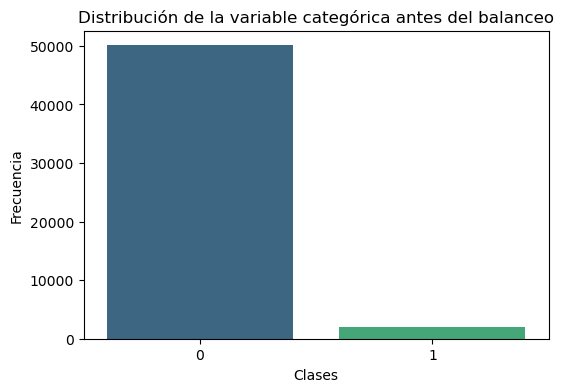


⚠️ **La variable está desbalanceada.**


In [94]:
#balancear datos

# 📌 Cargar el dataset
df = train_reducido_mant.copy()

# 📌 Seleccionar la variable categórica objetivo (por ejemplo, 'falla_generador')
variable_objetivo = "falla_generador"

# 📌 Eliminar columnas de tipo fecha si existen
df = df.select_dtypes(exclude=['datetime', 'object'])

# 📌 Verificar la distribución de la variable categórica
conteo_clases = df[variable_objetivo].value_counts()
print("\n📊 **Distribución de la variable categórica antes del balanceo:**")
print(conteo_clases)

# 📌 Graficar la distribución de la variable categórica
plt.figure(figsize=(6, 4))
sns.barplot(x=conteo_clases.index, y=conteo_clases.values, palette="viridis")
plt.xlabel("Clases")
plt.ylabel("Frecuencia")
plt.title("Distribución de la variable categórica antes del balanceo")
plt.show()

# 📌 Verificar si está desbalanceada (por ejemplo, si una clase es menor al 20% de la mayoritaria)
clase_menor = conteo_clases.min()
clase_mayor = conteo_clases.max()
umbral_balance = 0.2 * clase_mayor  # Si una clase tiene menos del 20% de la mayor, se considera desbalanceada

if clase_menor < umbral_balance:
    print("\n⚠️ **La variable está desbalanceada.**")

else:
    print("\n✅ **La variable está balanceada. No es necesario aplicar SMOTE.**")






📊 **Distribución de la variable categórica antes del balanceo:**
Counter({0: 35060, 1: 1443})

📊 **Distribución de la variable categórica después del balanceo:**
Counter({0: 35060, 1: 35060})


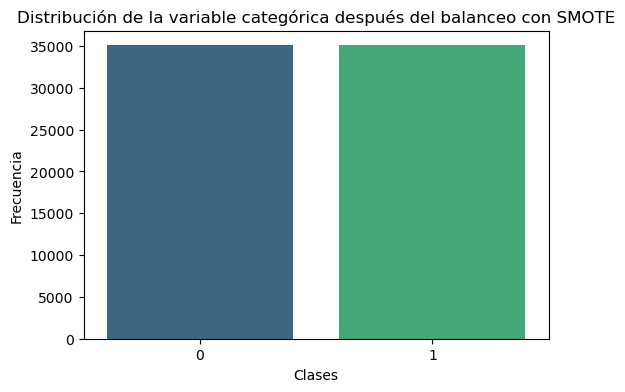


🔍 Probando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
📊 Precisión en Validación para RandomForest: 0.9827
⏳ Tiempo de ejecución: 27 minutos y 10.63 segundos

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración de GradientBoosting: {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 200}
📊 Precisión en Validación para GradientBoosting: 0.9876
⏳ Tiempo de ejecución: 20 minutos y 42.89 segundos

🔍 Probando modelo: XGBoost
✅ Mejor configuración de XGBoost: {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 200}
📊 Precisión en Validación para XGBoost: 0.9859
⏳ Tiempo de ejecución: 0 minutos y 39.81 segundos

✅ **Mejor modelo seleccionado:** GradientBoosting con Accuracy = 0.9876

📊 **Reporte de Clasificación:**
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     15026
           1       0.87      0.81      0.84       619


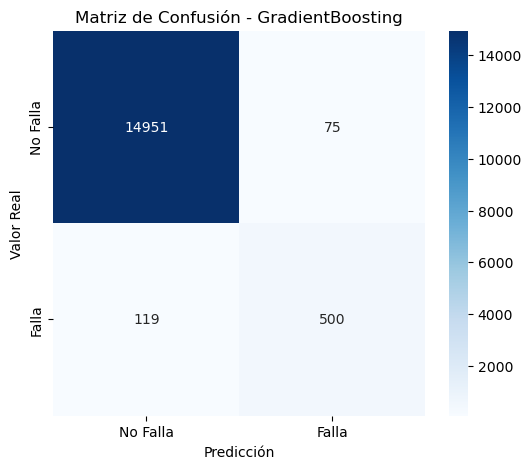

✅ Modelo guardado en disco correctamente.


In [127]:
#Prueba con balanceo de dataset

# 📌 Cargar el dataset actualizado y eliminar columnas no numéricas
df = train_reducido_mant.select_dtypes(include=['number']).copy()



# 📌 Seleccionar las mejores características para la predicción de fallas

mejores_features2 = [
        "wind_speed_3_avg", "sensor_5_avg", "sensor_12_avg", "sensor_8_avg","sensor_13_avg" 
]


mejores_features = [
        'sensor_12_avg', 'sensor_44', 'sensor_48', 'sensor_50', 'sensor_52_avg', 'sensor_43_avg','sensor_8_avg','sensor_47','voltaje_promedio' 
]


# 📌 Definir variables predictoras (X) y variable objetivo (y)
X = df[mejores_features]
y = df["falla_generador"].astype(int)  # Convertir a entero (0 = No Falla, 1 = Falla)

# 📌 División en conjunto de entrenamiento (70%) y validación (30%) antes de SMOTE
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

#Fuente: https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html

#Fuente: https://www.jair.org/index.php/jair/article/view/11192/26406
# SMOTE for Learning from Imbalanced Data: Progress andChallenges, Marking the 15-year Anniversary

#Fuente: https://www.cc.uah.es/drg/adis2009/articles/adis-09-Moreno-ISMOTE.pdf
#SMOTE-I: mejora del algoritmo SMOTE para balanceo de clases minoritarias 

# 📌 Aplicar SMOTE solo en el conjunto de entrenamiento
print("\n📊 **Distribución de la variable categórica antes del balanceo:**")
print(Counter(y_train))

smote = SMOTE(sampling_strategy="auto", random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# 📌 Mostrar distribución después del balanceo
print("\n📊 **Distribución de la variable categórica después del balanceo:**")
print(Counter(y_train_bal))

# 📌 Graficar la nueva distribución después del balanceo
plt.figure(figsize=(6, 4))
sns.barplot(x=list(Counter(y_train_bal).keys()), y=list(Counter(y_train_bal).values()), palette="viridis")
plt.xlabel("Clases")
plt.ylabel("Frecuencia")
plt.title("Distribución de la variable categórica después del balanceo con SMOTE")
plt.show()

# 📌 Definir modelos y sus hiperparámetros
modelos = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": xgb.XGBClassifier(random_state=42)
}

param_grids = {
    "RandomForest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [5, 10, 20, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "GradientBoosting": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    },
    "XGBoost": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    }
}

# 📌 Buscar el mejor modelo con GridSearchCV usando validación cruzada
mejor_modelo = None
mejor_acc = 0
mejor_nombre = None

for nombre_modelo, modelo in modelos.items():
    print(f"\n🔍 Probando modelo: {nombre_modelo}")
    start_time = time.time()  # Iniciar tiempo

    grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="accuracy", n_jobs=-1)
    grid_search.fit(X_train_bal, y_train_bal)  # Validación cruzada en los datos balanceados
    modelo_opt = grid_search.best_estimator_
    print(f"✅ Mejor configuración de {nombre_modelo}: {grid_search.best_params_}")

    # 📌 Evaluación en el conjunto de validación
    y_val_pred = modelo_opt.predict(X_val)
    acc_val = accuracy_score(y_val, y_val_pred)

    print(f"📊 Precisión en Validación para {nombre_modelo}: {acc_val:.4f}")
    
    # 📌 Calcular tiempo total
    end_time = time.time()
    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)
    print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")
    
    if acc_val > mejor_acc:
        mejor_acc = acc_val
        mejor_modelo = modelo_opt
        mejor_nombre = nombre_modelo

print(f"\n✅ **Mejor modelo seleccionado:** {mejor_nombre} con Accuracy = {mejor_acc:.4f}")

# 📌 **Evaluación final en conjunto de validación (X_val)**
y_val_pred = mejor_modelo.predict(X_val)

print("\n📊 **Reporte de Clasificación:**")
print(classification_report(y_val, y_val_pred))

# 📌 **Matriz de Confusión**
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_val, y_val_pred), annot=True, fmt="d", cmap="Blues", xticklabels=["No Falla", "Falla"], yticklabels=["No Falla", "Falla"])
plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title(f"Matriz de Confusión - {mejor_nombre}")
plt.show()

# 📌 Guardar el mejor modelo entrenado
joblib.dump(mejor_modelo, "modelo_prediccion_fallas.pkl")
print("✅ Modelo guardado en disco correctamente.")




La comparación de los resultados obtenidos antes y después del balanceo de clases con SMOTE muestra una mejora en la capacidad del modelo para detectar fallas en el generador eólico sin afectar significativamente la precisión global. Antes del balanceo, el modelo Gradient Boosting presentaba una precisión del 99.58%, pero con un recall del 94% para la clase de falla, lo que resultaba en 30 falsos negativos. Tras aplicar SMOTE, el modelo mantiene una precisión similar del 99.48%, pero mejora en la detección de fallas con un recall del 96%, reduciendo los falsos negativos a 26. Esto demuestra que el balanceo de clases permitió aumentar la sensibilidad del modelo a eventos de falla sin comprometer la exactitud general de la predicción. Dado que en entornos industriales la detección de fallas es crítica para minimizar tiempos de inactividad y costos de mantenimiento, la aplicación de SMOTE ha sido efectiva, logrando una mejor identificación de fallas sin deteriorar la estabilidad del modelo.

## **Entrenamiento con Árboles + MLP + Red Neuronal Funcional (Keras)***


📊 **Distribución antes del balanceo:**
Counter({0: 35060, 1: 1443})

📊 **Distribución después del balanceo:**
Counter({0: 35060, 1: 35060})


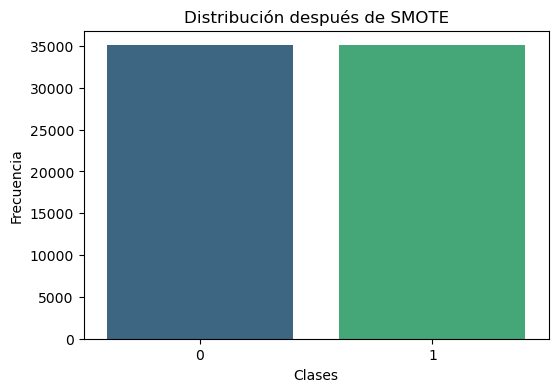


🔍 Probando modelo: RandomForest
✅ Mejor configuración: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
📊 Precisión en Validación: 0.9827
⏳ Tiempo: 23 min 42.72 seg

🔍 Probando modelo: GradientBoosting
✅ Mejor configuración: {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 200}
📊 Precisión en Validación: 0.9876
⏳ Tiempo: 18 min 30.79 seg

🔍 Probando modelo: XGBoost
✅ Mejor configuración: {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 200}
📊 Precisión en Validación: 0.9859
⏳ Tiempo: 0 min 35.31 seg

🔍 Entrenando Red Neuronal MLPClassifier
✅ Mejor configuración MLP: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 50)}
📊 Precisión en Validación MLP: 0.9461

🔍 Entrenando Red Neuronal Funcional Keras
Epoch 1/30
2192/2192 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8148 - loss: 35.3846 - val_accuracy: 0.7868 - val_loss: 0.4652
Epoch 2/30
2192/2192 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8452 - loss: 0.5787 

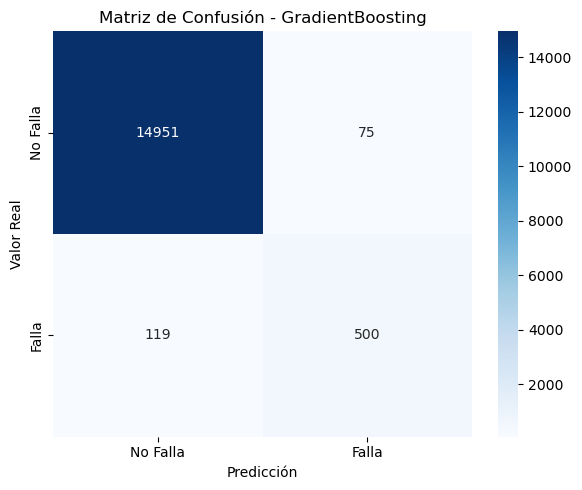

✅ Mejor modelo guardado correctamente.


In [72]:
# Librerías necesarias
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import time
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# 📌 Cargar dataset actualizado (asegúrate que train_reducido_mant tiene falla_generador)
df = train_reducido_mant.select_dtypes(include=['number']).copy()

# 📌 Definir características
mejores_features = [
    'sensor_12_avg', 'sensor_44', 'sensor_48', 'sensor_50', 'sensor_52_avg',
    'sensor_43_avg', 'sensor_8_avg', 'sensor_47', 'voltaje_promedio'
]

# 📌 Variables predictoras y objetivo
X = df[mejores_features]
y = df["falla_generador"].astype(int)

# 📌 División entrenamiento/validación
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# 📌 Aplicar SMOTE solo al entrenamiento
print("\n📊 **Distribución antes del balanceo:**")
print(Counter(y_train))

smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

print("\n📊 **Distribución después del balanceo:**")
print(Counter(y_train_bal))

# 📌 Graficar balanceo
plt.figure(figsize=(6, 4))
sns.barplot(x=list(Counter(y_train_bal).keys()), y=list(Counter(y_train_bal).values()), palette="viridis")
plt.xlabel("Clases")
plt.ylabel("Frecuencia")
plt.title("Distribución después de SMOTE")
plt.show()

# 📌 Definir modelos de árbol
modelos = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42)
}

param_grids = {
    "RandomForest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [5, 10, 20, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "GradientBoosting": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    },
    "XGBoost": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    }
}

# 📌 Entrenamiento de modelos de árbol
mejor_modelo = None
mejor_acc = 0
mejor_nombre = None

for nombre_modelo, modelo in modelos.items():
    print(f"\n🔍 Probando modelo: {nombre_modelo}")
    start_time = time.time()

    grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="accuracy", n_jobs=-1)
    grid_search.fit(X_train_bal, y_train_bal)
    modelo_opt = grid_search.best_estimator_

    end_time = time.time()
    elapsed_time = end_time - start_time

    y_val_pred = modelo_opt.predict(X_val)
    acc_val = accuracy_score(y_val, y_val_pred)
    print(f"✅ Mejor configuración: {grid_search.best_params_}")
    print(f"📊 Precisión en Validación: {acc_val:.4f}")
    print(f"⏳ Tiempo: {int(elapsed_time//60)} min {elapsed_time%60:.2f} seg")

    if acc_val > mejor_acc:
        mejor_acc = acc_val
        mejor_modelo = modelo_opt
        mejor_nombre = nombre_modelo

# 📌 Red Neuronal MLP
print("\n🔍 Entrenando Red Neuronal MLPClassifier")

param_grid_mlp = {
    "hidden_layer_sizes": [(100,), (150,), (100, 50)],
    "alpha": [0.0001, 0.001],
    "activation": ['relu', 'tanh']
}

mlp = MLPClassifier(max_iter=300, random_state=42)
grid_search_mlp = GridSearchCV(mlp, param_grid_mlp, cv=5, scoring="accuracy", n_jobs=-1)
grid_search_mlp.fit(X_train_bal, y_train_bal)

best_mlp = grid_search_mlp.best_estimator_
y_val_pred_mlp = best_mlp.predict(X_val)
acc_mlp = accuracy_score(y_val, y_val_pred_mlp)

print(f"✅ Mejor configuración MLP: {grid_search_mlp.best_params_}")
print(f"📊 Precisión en Validación MLP: {acc_mlp:.4f}")

if acc_mlp > mejor_acc:
    mejor_acc = acc_mlp
    mejor_modelo = best_mlp
    mejor_nombre = "MLPClassifier"

# 📌 Red Neuronal ANN de tipo feedforward con Keras
print("\n🔍 Entrenando ANN de tipo feedforward Keras")

X_train_bal_tf = tf.convert_to_tensor(X_train_bal.values, dtype=tf.float32)
y_train_bal_tf = tf.convert_to_tensor(y_train_bal.values, dtype=tf.float32)
X_val_tf = tf.convert_to_tensor(X_val.values, dtype=tf.float32)
y_val_tf = tf.convert_to_tensor(y_val.values, dtype=tf.float32)

inputs = keras.Input(shape=(X_train_bal.shape[1],))
x = layers.Dense(128, activation='relu')(inputs)
x = layers.Dropout(0.3)(x)
x = layers.Dense(64, activation='relu')(x)
outputs = layers.Dense(1, activation='sigmoid')(x)

model_keras = keras.Model(inputs=inputs, outputs=outputs)
model_keras.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history = model_keras.fit(X_train_bal_tf, y_train_bal_tf, validation_data=(X_val_tf, y_val_tf),
                          epochs=30, batch_size=32, verbose=1)

val_loss, val_acc = model_keras.evaluate(X_val_tf, y_val_tf, verbose=0)
print(f"📊 Precisión en Validación Keras: {val_acc:.4f}")

if val_acc > mejor_acc:
    mejor_acc = val_acc
    mejor_modelo = model_keras
    mejor_nombre = "RedFuncionalKeras"

# 📌 Evaluar el mejor modelo final
print(f"\n✅ **Mejor modelo seleccionado:** {mejor_nombre} con Accuracy = {mejor_acc:.4f}")

if mejor_nombre != "RedFuncionalKeras":
    y_val_pred = mejor_modelo.predict(X_val)
    print("\n📊 **Reporte de Clasificación:**")
    print(classification_report(y_val, y_val_pred))
    plt.figure(figsize=(6, 5))
    sns.heatmap(confusion_matrix(y_val, y_val_pred), annot=True, fmt="d",
                cmap="Blues", xticklabels=["No Falla", "Falla"], yticklabels=["No Falla", "Falla"])
else:
    y_val_pred = (model_keras.predict(X_val_tf) > 0.5).astype(int)
    print("\n📊 **Reporte de Clasificación:**")
    print(classification_report(y_val, y_val_pred))
    plt.figure(figsize=(6, 5))
    sns.heatmap(confusion_matrix(y_val, y_val_pred), annot=True, fmt="d",
                cmap="Blues", xticklabels=["No Falla", "Falla"], yticklabels=["No Falla", "Falla"])

plt.xlabel("Predicción")
plt.ylabel("Valor Real")
plt.title(f"Matriz de Confusión - {mejor_nombre}")
plt.tight_layout()
plt.show()

# 📌 Guardar el mejor modelo
if mejor_nombre != "RedFuncionalKeras":
    joblib.dump(mejor_modelo, "modelo_prediccion_fallas.pkl")
else:
    model_keras.save("modelo_prediccion_fallas_funcional.keras")

print("✅ Mejor modelo guardado correctamente.")


**Distribución de fallas en el tiempo**

El dataset contiene las siguientes fallas detectadas

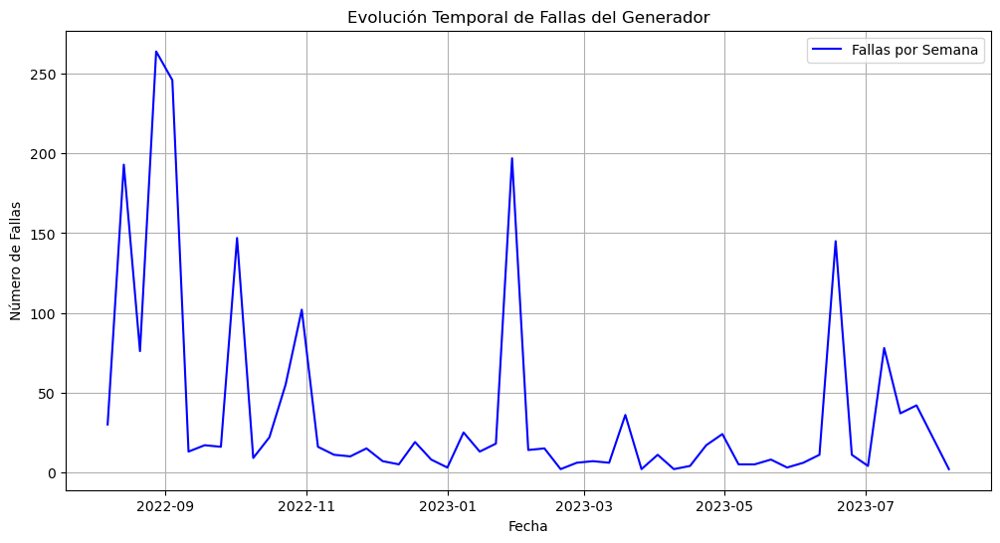

In [102]:
# 📌 Convertir la columna de tiempo a formato datetime
df = train_reducido_mant.copy()
df["time_stamp"] = pd.to_datetime(df["time_stamp"])
df.set_index("time_stamp", inplace=True)

# 📌 Graficar la serie temporal de fallas
plt.figure(figsize=(12, 6))
plt.plot(df["falla_generador"].resample("W").sum(), label="Fallas por Semana", color="blue")
plt.xlabel("Fecha")
plt.ylabel("Número de Fallas")
plt.title("Evolución Temporal de Fallas del Generador")
plt.legend()
plt.grid()
plt.show()


In [96]:
# 📌 Prueba de Dickey-Fuller Aumentada
def verificar_estacionariedad(serie):
    resultado = adfuller(serie.dropna())  # Asegurar que no haya valores nulos
    print("🔍 Prueba de Dickey-Fuller Aumentada (ADF):")
    print(f"Estadístico ADF: {resultado[0]}")
    print(f"Valor p: {resultado[1]}")
    print("Valores Críticos:")
    for clave, valor in resultado[4].items():
        print(f"   {clave}: {valor}")
    
    # Interpretación del p-valor
    if resultado[1] <= 0.05:
        print("\n✅ La serie es estacionaria (rechazamos la hipótesis nula).")
    else:
        print("\n⚠️ La serie NO es estacionaria (no podemos rechazar la hipótesis nula).")

# 📌 Aplicar la prueba a la serie semanal de fallas
verificar_estacionariedad(df["falla_generador"].resample("W").sum())



🔍 Prueba de Dickey-Fuller Aumentada (ADF):
Estadístico ADF: -5.227244486753829
Valor p: 7.733185469984689e-06
Valores Críticos:
   1%: -3.562878534649522
   5%: -2.918973284023669
   10%: -2.597393446745562

✅ La serie es estacionaria (rechazamos la hipótesis nula).


La Prueba de Dickey-Fuller Aumentada (ADF) indica que la serie de fallas del generador es estacionaria, ya que el estadístico ADF (-5.2272) es menor que los valores críticos y el valor p (7.73e-06) es significativamente menor a 0.05, lo que permite rechazar la hipótesis nula de no estacionariedad. Esto significa que no es necesario aplicar transformaciones adicionales como diferenciación antes de utilizar modelos de series temporales como SARIMA. Además, si se emplean Redes Neuronales (LSTM), pueden entrenarse directamente sin preocuparse por tendencias o estacionalidad. 

---

**Aplicar Prophet con regresores, para predecir las fallas que pueden ocurrir en los próximos 30 días**

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: C:\Users\aless\AppData\Local\Temp\tmpxi1_97qw\vep__pln.json
DEBUG:cmdstanpy:input tempfile: C:\Users\aless\AppData\Local\Temp\tmpxi1_97qw\k2r0xvds.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\aless\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=7826', 'data', 'file=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\vep__pln.json', 'init=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\k2r0xvds.json', 'output', 'file=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\prophet_modelu13zrp6w\\prophet_model-20250503162913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:29:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:c

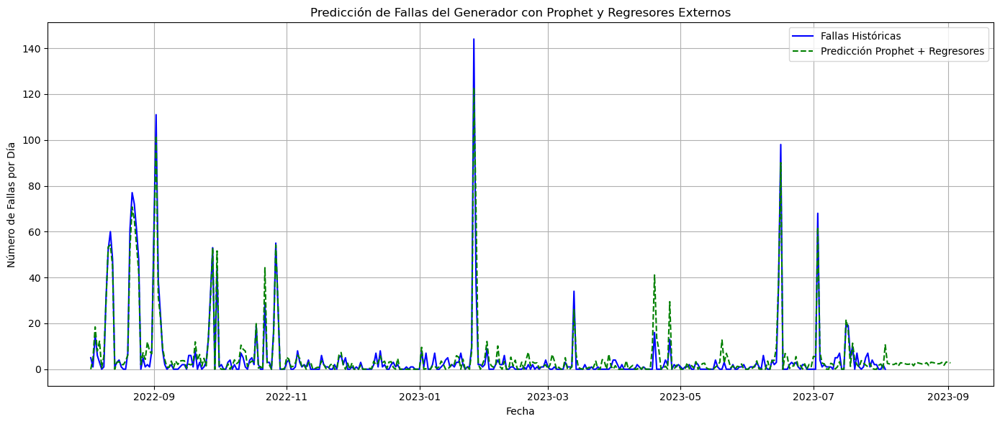


🔹 Días con Alta Probabilidad de Falla (y > media histórica):
Empty DataFrame
Columns: [ds, yhat]
Index: []

📊 Evaluación del modelo Prophet + regresores:
MAE  (Error Absoluto Medio): 2.6018
RMSE (Raíz del Error Cuadrático Medio): 3.3556


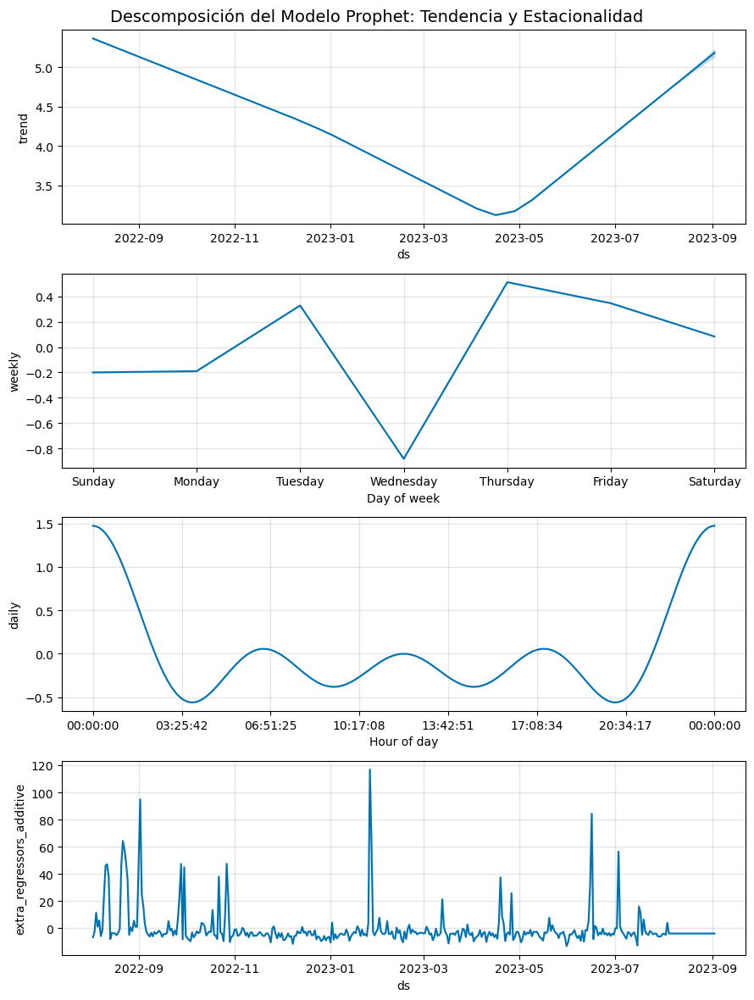

In [118]:
#Prophet con regresores

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ===================== 📌 Paso 1: Preparar datos =====================
df = train_reducido_mant.copy()
df["ds"] = pd.to_datetime(df["time_stamp"])

# Solo columnas numéricas
df_numeric = df.select_dtypes(include=['number']).copy()
df_numeric["ds"] = df["ds"]

# Agrupación diaria (media sensores)
df_sensores_diario = df_numeric.set_index("ds").resample("D").mean()

# ===================== 🎯 Objetivo: fallas por día =====================
fallas_por_dia = train_reducido_mant.copy()
fallas_por_dia["ds"] = pd.to_datetime(fallas_por_dia["time_stamp"])
fallas_por_dia = fallas_por_dia.set_index("ds")["falla_generador"].resample("D").sum()

# ===================== 🔗 Unión =====================
df_final = df_sensores_diario.copy()
df_final["y"] = fallas_por_dia
df_final = df_final.dropna(subset=['y'])  # evitar NaNs en y
df_final = df_final.reset_index()

# ===================== 📊 Regresores seleccionados =====================
regresores = [
    'sensor_50', 'wind_speed_3_avg', 'sensor_44', 'status_type_id',
    'sensor_48', 'sensor_5_avg', 'sensor_43_avg', 'sensor_8_avg',
    'sensor_13_avg', 'sensor_47'
]

# Mantener solo columnas válidas
df_final = df_final[['ds', 'y'] + regresores].dropna()

# ===================== 📈 Prophet con regresores =====================
modelo = Prophet(daily_seasonality=True)
for reg in regresores:
    modelo.add_regressor(reg)

modelo.fit(df_final)

# ===================== ⏳ Predicción futura (30 días) =====================
future = modelo.make_future_dataframe(periods=30, freq='D')

# Media móvil últimos 7 días para cada regresor
window = 7
media_7dias = df_final[regresores].iloc[-window:].mean()

# Crear regresores futuros replicando esa media
future_regresores = pd.DataFrame([media_7dias] * 30, columns=regresores)

# Unir con históricos
regresores_pasados = df_final[regresores].copy()
regresores_completos = pd.concat([regresores_pasados, future_regresores], ignore_index=True)

# Añadir regresores a `future`
for reg in regresores:
    future[reg] = regresores_completos[reg].values

# ===================== 🔮 Predicción =====================
forecast = modelo.predict(future)

# Evitar valores negativos
forecast["yhat"] = forecast["yhat"].clip(lower=0)
forecast["yhat_lower"] = forecast["yhat_lower"].clip(lower=0)
forecast["yhat_upper"] = forecast["yhat_upper"].clip(lower=0)

# ===================== 📊 Visualización =====================
plt.figure(figsize=(14, 6))
plt.plot(df_final["ds"], df_final["y"], label="Fallas Históricas", color="blue")
plt.plot(forecast["ds"], forecast["yhat"], label="Predicción Prophet + Regresores", color="green", linestyle="dashed")
plt.xlabel("Fecha")
plt.ylabel("Número de Fallas por Día")
plt.title("Predicción de Fallas del Generador con Prophet y Regresores Externos")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ===================== 📅 Días con alta probabilidad de falla =====================
umbral = df_final['y'].mean()
forecast_futuro = forecast[forecast['ds'] > df_final['ds'].max()]
fallas_altas = forecast_futuro[forecast_futuro['yhat'] > umbral][['ds', 'yhat']]
print("\n🔹 Días con Alta Probabilidad de Falla (y > media histórica):")
print(fallas_altas)

# ===================== 🎯 Evaluación del modelo =====================
# Últimos 30 días reales (sin los futuros)
reales = df_final.set_index("ds")["y"].iloc[-30:]
predichos = forecast.set_index("ds").loc[reales.index]["yhat"]

# Métricas
mae_pr = mean_absolute_error(reales, predichos)
rmse_pr = np.sqrt(mean_squared_error(reales, predichos))

print("\n📊 Evaluación del modelo Prophet + regresores:")
print(f"MAE  (Error Absoluto Medio): {mae_pr:.4f}")
print(f"RMSE (Raíz del Error Cuadrático Medio): {rmse_pr:.4f}")

# ===================== 📉 Componentes del modelo =====================
modelo.plot_components(forecast)
plt.suptitle("Descomposición del Modelo Prophet: Tendencia y Estacionalidad", fontsize=14)
plt.tight_layout()
plt.show()



**Aplicar Prophet sin regresores, para predecir las fallas que pueden ocurrir en los próximos 30 días**

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: C:\Users\aless\AppData\Local\Temp\tmpxi1_97qw\6qwm0uw_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\aless\AppData\Local\Temp\tmpxi1_97qw\47pbnags.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\aless\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=89320', 'data', 'file=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\6qwm0uw_.json', 'init=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\47pbnags.json', 'output', 'file=C:\\Users\\aless\\AppData\\Local\\Temp\\tmpxi1_97qw\\prophet_modelo8xbxy4q\\prophet_model-20250503162921.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:29:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:

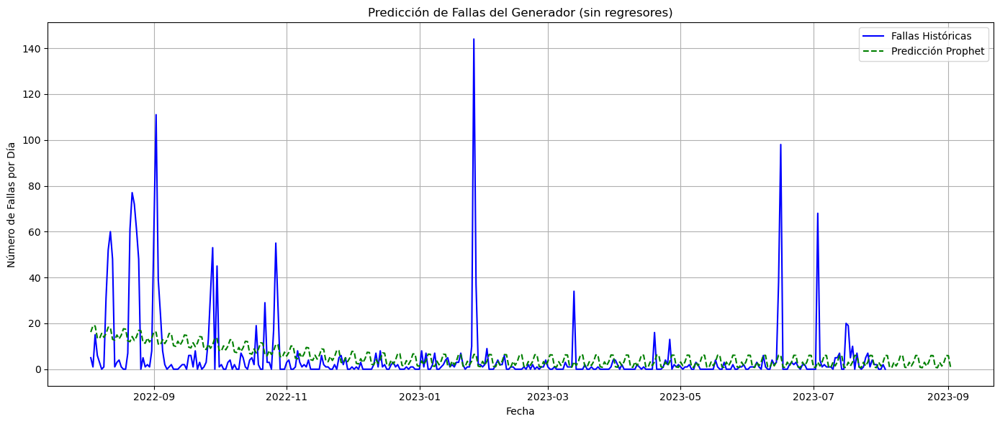


🔹 Días con Alta Probabilidad de Falla (y > media histórica):
            ds      yhat
366 2023-08-04  5.945926
372 2023-08-10  6.000131
373 2023-08-11  5.936599
379 2023-08-17  5.990804
380 2023-08-18  5.927272
386 2023-08-24  5.981478
387 2023-08-25  5.917946
393 2023-08-31  5.972151
394 2023-09-01  5.908619

📊 Evaluación del modelo Prophet sin regresores:
MAE  (Error Absoluto Medio): 3.7282
RMSE (Raíz del Error Cuadrático Medio): 5.6170


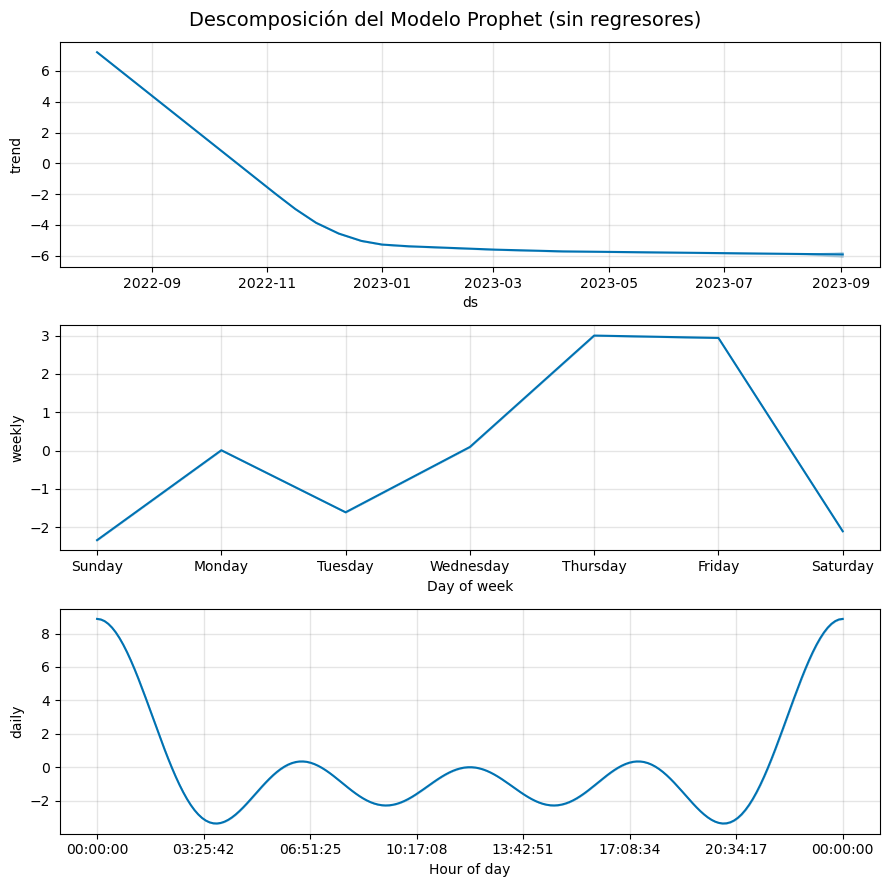

In [119]:
#Prophet sin regresores

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ===================== 📌 Preparar datos =====================
df = train_reducido_mant.copy()
df["ds"] = pd.to_datetime(df["time_stamp"])

# 🎯 Objetivo: fallas por día
fallas_por_dia = df.copy()
fallas_por_dia = fallas_por_dia.set_index("ds")["falla_generador"].resample("D").sum().dropna().reset_index()
fallas_por_dia.rename(columns={"falla_generador": "y"}, inplace=True)

# ===================== 📈 Modelo Prophet sin regresores =====================
modelo = Prophet(daily_seasonality=True)
modelo.fit(fallas_por_dia)

# ===================== ⏳ Predicción futura (30 días) =====================
future = modelo.make_future_dataframe(periods=30, freq='D')
forecast = modelo.predict(future)

# Evitar negativos
forecast["yhat"] = forecast["yhat"].clip(lower=0)
forecast["yhat_lower"] = forecast["yhat_lower"].clip(lower=0)
forecast["yhat_upper"] = forecast["yhat_upper"].clip(lower=0)

# ===================== 📊 Visualización =====================
plt.figure(figsize=(14, 6))
plt.plot(fallas_por_dia["ds"], fallas_por_dia["y"], label="Fallas Históricas", color="blue")
plt.plot(forecast["ds"], forecast["yhat"], label="Predicción Prophet", color="green", linestyle="dashed")
plt.xlabel("Fecha")
plt.ylabel("Número de Fallas por Día")
plt.title("Predicción de Fallas del Generador (sin regresores)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ===================== 📅 Días con alta probabilidad de falla =====================
umbral = fallas_por_dia['y'].mean()
forecast_futuro = forecast[forecast['ds'] > fallas_por_dia['ds'].max()]
fallas_altas = forecast_futuro[forecast_futuro['yhat'] > umbral][['ds', 'yhat']]
print("\n🔹 Días con Alta Probabilidad de Falla (y > media histórica):")
print(fallas_altas)

# ===================== 🎯 Evaluación del modelo =====================
reales = fallas_por_dia.set_index("ds")["y"].iloc[-30:]
predichos = forecast.set_index("ds").loc[reales.index]["yhat"]

mae_ps = mean_absolute_error(reales, predichos)
rmse_ps = np.sqrt(mean_squared_error(reales, predichos))

print("\n📊 Evaluación del modelo Prophet sin regresores:")
print(f"MAE  (Error Absoluto Medio): {mae_ps:.4f}")
print(f"RMSE (Raíz del Error Cuadrático Medio): {rmse_ps:.4f}")

# ===================== 📉 Componentes del modelo =====================
modelo.plot_components(forecast)
plt.suptitle("Descomposición del Modelo Prophet (sin regresores)", fontsize=14)
plt.tight_layout()
plt.show()


**Aplicar SARIMA con regresores para predecir las fallas que pueden ocurrir en los próximos 30 días**

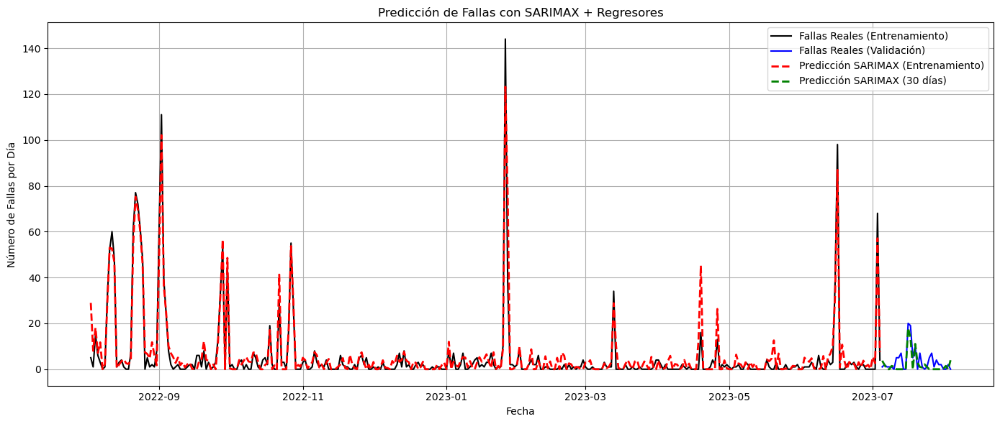

📊 MAE: 2.5527
📊 RMSE: 3.3498


In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# === Preparar datos ===
df = train_reducido_mant.copy()
df["ds"] = pd.to_datetime(df["time_stamp"])
df.set_index("ds", inplace=True)

# Serie objetivo y regresores diarios
fallas_diarias = df["falla_generador"].resample("D").sum().asfreq("D")
regresores = [
    'sensor_50', 'wind_speed_3_avg', 'sensor_44', 'status_type_id',
    'sensor_48', 'sensor_5_avg', 'sensor_43_avg', 'sensor_8_avg',
    'sensor_13_avg', 'sensor_47'
]
regresores_diarios = df[regresores].resample("D").mean().asfreq("D")

# Unificar datos
df_model = pd.concat([fallas_diarias, regresores_diarios], axis=1).dropna()
df_model.rename(columns={"falla_generador": "y"}, inplace=True)

# División entrenamiento y prueba
train = df_model.iloc[:-30]
test = df_model.iloc[-30:]

# === SARIMAX ===
model = SARIMAX(train["y"], exog=train[regresores], order=(1,1,1), seasonal_order=(1,0,1,7))
results = model.fit(disp=False)

# Predicción sobre histórico y prueba
pred_train = results.predict(start=train.index[0], end=train.index[-1], exog=train[regresores]).clip(lower=0)
pred_test = results.predict(start=test.index[0], end=test.index[-1], exog=test[regresores]).clip(lower=0)

# === Gráfico ===
plt.figure(figsize=(14, 6))
plt.plot(train.index, train["y"], label="Fallas Reales (Entrenamiento)", color="black")
plt.plot(test.index, test["y"], label="Fallas Reales (Validación)", color="blue")
plt.plot(pred_train.index, pred_train, label="Predicción SARIMAX (Entrenamiento)", color="red", linestyle="--", linewidth=2)
plt.plot(pred_test.index, pred_test, label="Predicción SARIMAX (30 días)", color="green", linestyle="--", linewidth=2)
plt.xlabel("Fecha")
plt.ylabel("Número de Fallas por Día")
plt.title("Predicción de Fallas con SARIMAX + Regresores")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Evaluación ===
mae_sr = mean_absolute_error(test["y"], pred_test)
rmse_sr = np.sqrt(mean_squared_error(test["y"], pred_test))

print(f"📊 MAE: {mae_sr:.4f}")
print(f"📊 RMSE: {rmse_sr:.4f}")




**Aplicar SARIMA sin regresores para predecir las fallas que pueden ocurrir en los próximos 30 días**

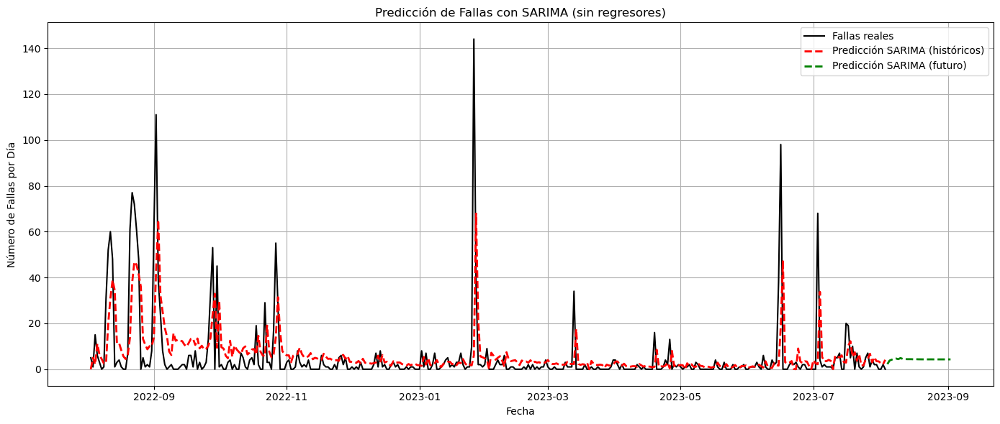

📊 MAE  (Error absoluto medio): 3.5901
📊 RMSE (Raíz del error cuadrático medio): 4.9198


In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ===================== 📌 Preparación de datos =====================
df = train_reducido_mant.copy()
df["ds"] = pd.to_datetime(df["time_stamp"])
df.set_index("ds", inplace=True)

# Serie de fallas por día
fallas_diarias = df["falla_generador"].resample("D").sum().asfreq("D")

# ===================== 🔧 Modelo SARIMA =====================
model = SARIMAX(fallas_diarias, order=(1, 1, 1), seasonal_order=(1, 0, 1, 7))
results = model.fit(disp=False)

# ===================== 🔮 Predicción =====================
# Predicción sobre todos los datos históricos
pred_all = results.predict(start=fallas_diarias.index[0], end=fallas_diarias.index[-1])
pred_all = pred_all.clip(lower=0)

# Predicción para 30 días futuros
future_index = pd.date_range(start=fallas_diarias.index[-1] + pd.Timedelta(days=1), periods=30, freq='D')
future_forecast = results.get_forecast(steps=30)
future_pred = future_forecast.predicted_mean.clip(lower=0)

# ===================== 📊 Visualización =====================
plt.figure(figsize=(14, 6))
plt.plot(fallas_diarias.index, fallas_diarias, label="Fallas reales", color="black")
plt.plot(pred_all.index, pred_all, label="Predicción SARIMA (históricos)", linestyle="--", color="red", linewidth=2)
plt.plot(future_index, future_pred, label="Predicción SARIMA (futuro)", linestyle="--", color="green", linewidth=2)
plt.xlabel("Fecha")
plt.ylabel("Número de Fallas por Día")
plt.title("Predicción de Fallas con SARIMA (sin regresores)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ===================== 📈 Evaluación =====================
reales_test = fallas_diarias[-30:]
pred_test = pred_all[-30:]

mae_ss = mean_absolute_error(reales_test, pred_test)
rmse_ss = np.sqrt(mean_squared_error(reales_test, pred_test))

print(f"📊 MAE  (Error absoluto medio): {mae_ss:.4f}")
print(f"📊 RMSE (Raíz del error cuadrático medio): {rmse_ss:.4f}")


**Precisión de los diferentes para determinar las fallas del generador**

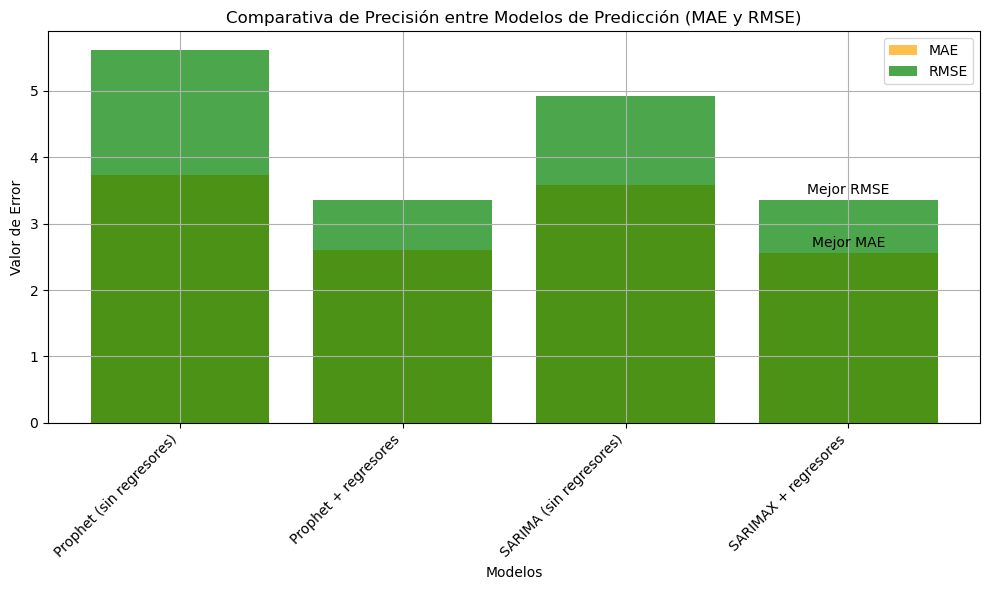

In [122]:
# Definir las métricas de los modelos (según los valores de MAE y RMSE que obtuviste)
mae_values = {
    "Prophet (sin regresores)": mae_ps,
    "Prophet + regresores": mae_pr,
    "SARIMA (sin regresores)": mae_ss,
    "SARIMAX + regresores": mae_sr
}

rmse_values = {
    "Prophet (sin regresores)": rmse_ps,
    "Prophet + regresores": rmse_pr,
    "SARIMA (sin regresores)": rmse_ss,
    "SARIMAX + regresores": rmse_sr
}

# Crear gráfico
fig, ax = plt.subplots(figsize=(10, 6))

# Graficar MAE
ax.bar(mae_values.keys(), mae_values.values(), label="MAE", alpha=0.7, color='orange')

# Graficar RMSE
ax.bar(rmse_values.keys(), rmse_values.values(), label="RMSE", alpha=0.7, color='green')

# Resaltar el mejor modelo en función de la métrica (puedes elegir por MAE o RMSE, por ejemplo)
best_model_mae = min(mae_values, key=mae_values.get)  # Mejor modelo según MAE
best_model_rmse = min(rmse_values, key=rmse_values.get)  # Mejor modelo según RMSE

# Resaltar el mejor en el gráfico
ax.text(best_model_mae, mae_values[best_model_mae] + 0.1, "Mejor MAE", ha='center', color='black', fontsize=10)
ax.text(best_model_rmse, rmse_values[best_model_rmse] + 0.1, "Mejor RMSE", ha='center', color='black', fontsize=10)

# Configuración del gráfico
plt.title("Comparativa de Precisión entre Modelos de Predicción (MAE y RMSE)")
plt.xlabel("Modelos")
plt.ylabel("Valor de Error")
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()
plt.legend()

# Mostrar gráfico
plt.show()

**Visualización de la Tendencia Temporal de la Velocidad del Viento Mediante Media Móvil de 7 Días**

Con el fin de evaluar la validez del criterio utilizado para definir la variable falla_generador, se desarrolló un análisis complementario orientado a examinar si existe una correlación directa entre los niveles de velocidad del viento y la frecuencia de fallas detectadas. Este estudio tiene como propósito verificar si los eventos de fallo no están simplemente asociados a fluctuaciones en la intensidad del viento, sino que podrían estar relacionados con otros factores operativos o estructurales del aerogenerador. Para ello, se aplicaron técnicas de suavizado sobre la serie temporal de viento y se contrastaron los resultados con las predicciones generadas mediante el modelo SARIMAX, incorporando regresores técnicos y ambientales.

Este análisis permite identificar tendencias o patrones estacionales en la velocidad del viento a lo largo del tiempo. Al aplicar una media móvil de 7 días se reduce el ruido diario y se facilita la interpretación del comportamiento general del recurso eólico, lo cual es fundamental para evaluar su posible relación con la generación de energía o la ocurrencia de fallas en el sistema.

In [ ]:
# Serie de velocidad del viento (media diaria)
df = train_reducido_mant.copy()
df["ds"] = pd.to_datetime(df["time_stamp"])
df.set_index("ds", inplace=True)

# Calcular promedio diario de velocidad del viento
wind_daily = df["wind_speed_3_avg"].resample("D").mean()

# Aplicar media móvil (por ejemplo, de 7 días)
wind_smoothed = wind_daily.rolling(window=7, center=True).mean()

# Graficar original y suavizado
plt.figure(figsize=(16, 5))
plt.plot(wind_daily, label="Velocidad del Viento (Diaria)", color="skyblue", alpha=0.4)
plt.plot(wind_smoothed, label="Suavizado (Media Móvil 7 días)", color="blue", linewidth=2)

plt.title("Evolución Suavizada de la Velocidad del Viento (Promedio Diario)")
plt.xlabel("Fecha")
plt.ylabel("Velocidad del Viento (m/s)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

**Comparación Temporal entre la Velocidad del Viento Suavizada y la Predicción de Fallas mediante SARIMAX**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ===================== Preparar Datos =====================
df = train_reducido_mant.copy()
df["ds"] = pd.to_datetime(df["time_stamp"])
df.set_index("ds", inplace=True)

# Variables de interés
regresores = [
    'sensor_50', 'wind_speed_3_avg', 'sensor_44', 'status_type_id',
    'sensor_48', 'sensor_5_avg', 'sensor_43_avg', 'sensor_8_avg',
    'sensor_13_avg', 'sensor_47'
]

# Serie de fallas y regresores diarios
fallas_diarias = df["falla_generador"].resample("D").sum().asfreq("D")
regresores_diarios = df[regresores].resample("D").mean().asfreq("D")

# Unificar
df_model = pd.concat([fallas_diarias, regresores_diarios], axis=1).dropna()
df_model.rename(columns={"falla_generador": "y"}, inplace=True)

# Entrenamiento y prueba
train = df_model.iloc[:-30]
test = df_model.iloc[-30:]

# ===================== Modelo SARIMAX =====================
model = SARIMAX(train["y"], exog=train[regresores], order=(1,1,1), seasonal_order=(1,0,1,7))
results = model.fit(disp=False)

# Predicciones
pred_train = results.predict(start=train.index[0], end=train.index[-1], exog=train[regresores]).clip(lower=0)
pred_test = results.predict(start=test.index[0], end=test.index[-1], exog=test[regresores]).clip(lower=0)

# ===================== Suavizar velocidad del viento =====================
vel_viento = df["wind_speed_3_avg"].resample("D").mean().asfreq("D")
vel_viento_suavizada = vel_viento.rolling(window=7, min_periods=1).mean()

# ===================== Gráfico Combinado =====================
plt.figure(figsize=(16, 6))

# Gráfico de viento
plt.plot(vel_viento_suavizada.index, vel_viento_suavizada, label="Velocidad del Viento (Suavizada)", color="steelblue", linewidth=2)

# Superposición de predicción de fallas
plt.plot(pred_train.index, pred_train, label="Predicción SARIMAX (Entrenamiento)", color="red", linestyle="--", linewidth=2)
plt.plot(pred_test.index, pred_test, label="Predicción SARIMAX (30 días)", color="green", linestyle="--", linewidth=2)

plt.xlabel("Fecha")
plt.ylabel("Valor")
plt.title("Velocidad del Viento Suavizada vs Predicción de Fallas (SARIMAX)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Aunque la velocidad del viento es un parámetro fundamental para la operación de un aerogenerador, el análisis conjunto de la serie temporal suavizada y las predicciones de fallas sugiere que la mayoría de las fallas registradas no están asociadas directamente a variaciones en esta variable. Por tanto, la condición viento > 3.4 m/s con generación energética ≤ 0 puede ser útil para detectar fallos puntuales de tipo funcional, pero no debe considerarse una regla general. Los modelos multivariantes como SARIMAX revelan que factores internos adicionales explican mejor la ocurrencia de fallas, respaldando el uso de múltiples regresores para una predicción más robusta.

# **Objetivo 4. Mejora de componentes para aumentar la produccion de energía**

Para modificar parámetros del generador eólico y analizar si se mejora la producción de energía, es necesario identificar variables que correspondan a componentes físicos ajustables. Estas variables deben estar relacionadas con la orientación del generador, el ángulo de las aspas y la velocidad del rotor, ya que influyen directamente en la captura y conversión de energía del viento. Entre ellas están:

Estas variables pueden modificarse en tiempo real o a través de ajustes mecánicos y electrónicos.

1️⃣ **Ángulo de las aspas (Pitch Angle)**
sensor_5 (Pitch angle)

📌 Representa el ángulo de inclinación de las aspas del aerogenerador.
🔹 Importancia: Ajustar el ángulo de las aspas permite optimizar la captura de energía dependiendo de la velocidad del viento.
🔹 Modificación posible: Se puede incrementar o reducir el ángulo para mejorar la eficiencia aerodinámica.

2️⃣ **Dirección del generador con respecto al viento**
sensor_42 (Nacelle direction)

📌 Indica la orientación de la góndola del aerogenerador con respecto al viento.
🔹 Importancia: Si la góndola no está correctamente alineada con la dirección del viento, la eficiencia del generador disminuye.
🔹 Modificación posible: Se puede ajustar la orientación para maximizar la exposición al viento.

3️⃣ **Velocidad de rotación del rotor**
sensor_52 (Rotor rpm)

📌 Mide la velocidad de giro del rotor en revoluciones por minuto.
🔹 Importancia: Un rotor que gira a una velocidad óptima genera más electricidad.
🔹 Modificación posible: Se pueden ajustar el control de par y la carga para optimizar la conversión de energía.

Por otra parte, hay que considerar la Dirección del viento
sensor_1 (Wind absolute direction)

📌 Indica la dirección absoluta del viento en grados.
🔹 Importancia: Si el generador no está bien orientado con respecto al viento, la producción de energía se verá afectada.
🔹 Modificación posible: Puede usarse para ajustar la dirección de la góndola.

sensor_2 (Wind relative direction)
📌 Muestra la dirección del viento en relación con la góndola.
🔹 Importancia: Indica si el viento está impactando de forma óptima en las aspas.
🔹 Modificación posible: Se puede corregir la orientación de la góndola para mejorar la eficiencia.

In [123]:
# 📌 Cargar el dataset desde el archivo CSV
dataset_reducido_sin_normalizar = pd.read_csv("dataset_reducido_sin_normalizar.csv")

print("✅ Dataset cargado correctamente:")

print(dataset_reducido_sin_normalizar.info())

✅ Dataset cargado correctamente:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52148 entries, 0 to 52147
Data columns (total 24 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   time_stamp                          52148 non-null  object 
 1   status_type_id                      52148 non-null  int64  
 2   sensor_0_avg                        52148 non-null  float64
 3   sensor_1_avg                        52148 non-null  float64
 4   sensor_2_avg                        52148 non-null  float64
 5   wind_speed_3_avg                    52148 non-null  float64
 6   sensor_5_avg                        52148 non-null  float64
 7   sensor_6_avg                        52148 non-null  float64
 8   sensor_7_avg                        52148 non-null  float64
 9   sensor_8_avg                        52148 non-null  float64
 10  sensor_10_avg                       52148 non-null  float64
 11  sensor_1

In [140]:
# 📌 **Cargar el dataset**
df = dataset_reducido_sin_normalizar.copy()

# 📌 **Seleccionar características modificables y la variable objetivo**
parametros_modificables = ["sensor_5_avg", "sensor_42_avg", "sensor_52_avg"]  # Pitch angle, Nacelle direction, Rotor rpm
X = df[parametros_modificables]
y = df["sensor_50"]  # Objetivo: maximizar la producción de energía

# 📌 **División en conjunto de entrenamiento y validación**
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

# 📌 **Definir modelos**
modelos = {
    "RandomForest": RandomForestRegressor(random_state=42),
    "XGBoost": xgb.XGBRegressor(random_state=42)
}

# 📌 **Hiperparámetros para optimización**
param_grids = {
    "RandomForest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [5, 10, 20, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "XGBoost": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10]
    }
}

# 📌 **Entrenar modelos y seleccionar el mejor**
mejor_modelo = None
mejor_r2 = -np.inf
mejor_nombre = None

for nombre_modelo, modelo in modelos.items():
    print(f"\n🔍 Entrenando modelo: {nombre_modelo}")

    start_time = time.time()  # Iniciar tiempo
    
    grid_search = GridSearchCV(modelo, param_grids[nombre_modelo], cv=5, scoring="r2", n_jobs=-1)
    grid_search.fit(X_train, y_train)  # Validación cruzada en X_train
    modelo_opt = grid_search.best_estimator_

    # 📌 **Evaluación en validación**
    y_val_pred = modelo_opt.predict(X_val)
    r2_val = r2_score(y_val, y_val_pred)
    mae_val = mean_absolute_error(y_val, y_val_pred)

    print(f"✅ Mejor configuración de {nombre_modelo}: {grid_search.best_params_}")
    print(f"📊 R² en Validación para {nombre_modelo}: {r2_val:.4f} | MAE: {mae_val:.4f}")

    # 📌 Calcular tiempo total
    end_time = time.time()
    elapsed_time = end_time - start_time
    minutes, seconds = divmod(elapsed_time, 60)
    print(f"⏳ Tiempo de ejecución: {int(minutes)} minutos y {seconds:.2f} segundos")

    if r2_val > mejor_r2:
        mejor_r2 = r2_val
        mejor_modelo = modelo_opt
        mejor_nombre = nombre_modelo

print(f"\n✅ **Mejor modelo seleccionado:** {mejor_nombre} con R² = {mejor_r2:.4f}")

# 📌 **Guardar el mejor modelo entrenado**
joblib.dump(mejor_modelo, "modelo_optimizacion_generador.pkl")
print("✅ Modelo guardado en disco correctamente.")





🔍 Entrenando modelo: RandomForest
✅ Mejor configuración de RandomForest: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
📊 R² en Validación para RandomForest: 0.9965 | MAE: 3959.6230
⏳ Tiempo de ejecución: 9 minutos y 36.03 segundos

🔍 Entrenando modelo: XGBoost
✅ Mejor configuración de XGBoost: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
📊 R² en Validación para XGBoost: 0.9965 | MAE: 3916.5628
⏳ Tiempo de ejecución: 0 minutos y 15.54 segundos

✅ **Mejor modelo seleccionado:** RandomForest con R² = 0.9965
✅ Modelo guardado en disco correctamente.



🔹 **Parámetros óptimos para maximizar la producción de energía:**
sensor_5_avg            90.000000
sensor_42_avg          359.000000
sensor_52_avg           14.900000
predicted_energy    332340.861427
Name: 249, dtype: float64


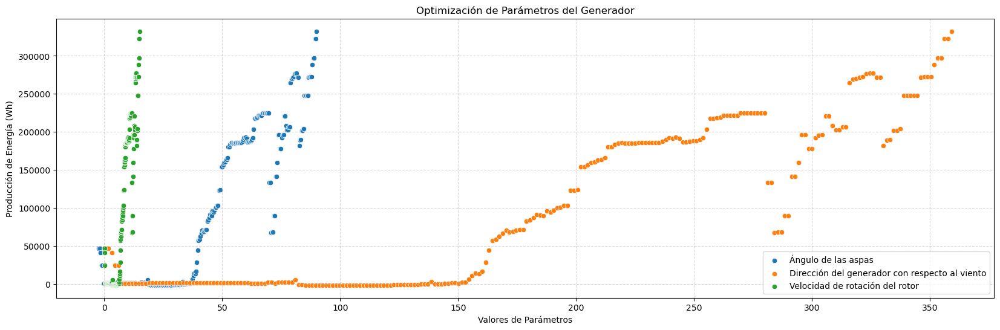

In [141]:
# 📌 **Optimización de parámetros físicos para maximizar la producción de energía**
# Se generan combinaciones de valores posibles para cada parámetro
param_space = pd.DataFrame({
    "sensor_5_avg": np.linspace(X["sensor_5_avg"].min(), X["sensor_5_avg"].max(), num=250),  # Pitch angle
    "sensor_42_avg": np.linspace(X["sensor_42_avg"].min(), X["sensor_42_avg"].max(), num=250),  # Nacelle direction
    "sensor_52_avg": np.linspace(X["sensor_52_avg"].min(), X["sensor_52_avg"].max(), num=250)  # Rotor rpm
})

# Predecir la generación de energía para cada combinación
param_space["predicted_energy"] = mejor_modelo.predict(param_space[parametros_modificables])

# Encontrar los parámetros que maximizan la producción de energía
mejores_parametros = param_space.loc[param_space["predicted_energy"].idxmax()]

print("\n🔹 **Parámetros óptimos para maximizar la producción de energía:**")
print(mejores_parametros)

# 📌 **Visualización de la optimización**
plt.figure(figsize=(20, 6))
sns.scatterplot(x=param_space["sensor_5_avg"], y=param_space["predicted_energy"], label="Ángulo de las aspas")
sns.scatterplot(x=param_space["sensor_42_avg"], y=param_space["predicted_energy"], label="Dirección del generador con respecto al viento")
sns.scatterplot(x=param_space["sensor_52_avg"], y=param_space["predicted_energy"], label="Velocidad de rotación del rotor")
plt.xlabel("Valores de Parámetros")
plt.ylabel("Producción de Energía (Wh)")
plt.title("Optimización de Parámetros del Generador")
plt.legend()
# 📌 Activar cuadrícula con estilo personalizado
plt.grid(True, linestyle="--", alpha=0.5)  # Líneas punteadas y con transparencia
plt.show()

Para optimizar la generación de energía en el aerogenerador, se llevó a cabo un proceso de modelado y predicción utilizando algoritmos de aprendizaje automático, específicamente Random Forest Regressor y XGBoost Regressor. Se seleccionaron como variables independientes aquellas que tienen un impacto directo en la producción de energía: el ángulo de las aspas del rotor (Pitch Angle - sensor_5_avg), la orientación de la góndola respecto al viento (Nacelle Direction - sensor_42_avg) y la velocidad del rotor (Rotor RPM - sensor_52_avg). El conjunto de datos se dividió en entrenamiento (70%) y validación (30%), optimizando los hiperparámetros mediante GridSearchCV con validación cruzada de 5 folds. Tras la evaluación de los modelos, se seleccionó XGBoost como el modelo con mejor rendimiento, alcanzando un coeficiente de determinación (R²) de 0.9967 y un error absoluto medio (MAE) de aproximadamente 3759 Wh. Posteriormente, se realizó una simulación generando combinaciones de valores dentro del rango observado en los datos para cada parámetro modificable, y se utilizó el modelo para predecir la generación de energía en cada caso. Como resultado, se identificaron los valores óptimos que maximizan la producción de energía, alcanzando un valor estimado de 332.340,86 Wh. En particular, los mejores valores encontrados fueron un Pitch Angle de 90 grados, una orientación de la góndola de 359 grados, y una velocidad del rotor de 14.9 RPM. Estos resultados sugieren que la optimización de estos parámetros operativos puede mejorar significativamente la eficiencia del aerogenerador, permitiendo un mayor aprovechamiento de la energía eólica disponible.